In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

### Q1) Which US real-estate market is doing best overall (Keertana)

### Methodology
We analyzed U.S. metro markets using:
- **ZHVI (Zillow Home Value Index)** and **ZORI (Zillow Observed Rent Index)**
- Two metrics: 
  - **YoY Growth** – to capture recent 12-month momentum
  - **CAGR** – to assess long-term sustainable growth
- A **Combined Score** was calculated as the sum of YoY and CAGR for both ZHVI and ZORI


### Why YoY and CAGR?
- **YoY (Year-over-Year)** helps identify current **market momentum**
- **CAGR (Compound Annual Growth Rate)** highlights **long-term stability and consistency**
- Using both ensures we capture both **short-term trends** and **long-term fundamentals**

In [2]:
#Zillow Observed Rent Index (ZORI)
#Zillow Home Value Index (ZHVI)
# Load Zillow Home Value Index data for Single Family Home homes, Condo/Co Op
zhvi = pd.read_csv('./datasets/Metro_zhvi_sfrcondomfr.csv')

# Load Zillow Rent Index data for Single Family Home homes, Condo/Co Op
rent_index = pd.read_csv('./datasets/Metro_zori_sfrcondomfr.csv')

zhvi_df_sfrcondomfr = zhvi[['RegionName', 'StateName'] + zhvi.columns[-13:].tolist()]  # last 13 months
zori_df_sfrcondomfr = rent_index[['RegionName', 'StateName'] + rent_index.columns[-13:].tolist()]  # last 13 months

#fetching last n months of data to calculate CAGR
def get_last_n_months(df, n_months=36):
    date_cols = df.columns[df.columns.str.match(r'\d{4}-\d{2}')]
    last_n = date_cols[-n_months:]
    return df[['RegionName', 'StateName'] + list(last_n)]

# Get only last 13 months (some files may have 20+ years of monthly data)
def get_last_13_months(df):
    date_cols = df.columns[ df.columns.str.match(r'\d{4}-\d{2}') ]
    last_13 = date_cols[-13:]
    return df[['RegionName', 'StateName'] + list(last_13)]

# CAGR Calculation
def calc_cagr(df, years):
    df = df.copy()
    date_cols = df.columns[2:]  # skip RegionName, StateName
    start_col = date_cols[0]
    end_col = date_cols[-1]
    
    df['CAGR'] = ((df[end_col] / df[start_col]) ** (1 / years) - 1) * 100
    return df[['RegionName', 'StateName', 'CAGR']]

#Calculating Year on Year growth
def calc_yoy_growth(df):
    df = df.copy()
    date_cols = df.columns[2:]  # skip RegionName, StateName
    recent_col = date_cols[-1]
    past_col = date_cols[0]
    df['YoY_Growth'] = ((df[recent_col] - df[past_col]) / df[past_col]) * 100
    return df[['RegionName', 'StateName', 'YoY_Growth']]
    
#Considering 3 Years of data to calculate CAGR
zhvi_df_cagr = get_last_n_months(zhvi, n_months=36)
zori_df_cagr = get_last_n_months(rent_index, n_months=36)

zhvi_df_sfrcondomfr = get_last_13_months(zhvi_df_sfrcondomfr)
zori_df_sfrcondomfr = get_last_13_months(zori_df_sfrcondomfr)

zhvi_cagr = calc_cagr(zhvi_df_cagr, years=3)
zori_cagr = calc_cagr(zori_df_cagr, years=3)

zhvi_cagr.rename(columns={'CAGR': 'ZHVI_CAGR'}, inplace=True)
zori_cagr.rename(columns={'CAGR': 'ZORI_CAGR'}, inplace=True)

zhvi_growth = calc_yoy_growth(zhvi_df_sfrcondomfr)
zori_growth = calc_yoy_growth(zori_df_sfrcondomfr)

zhvi_growth.rename(columns={'YoY_Growth': 'ZHVI_YoY'}, inplace=True)
zori_growth.rename(columns={'YoY_Growth': 'ZORI_YoY'}, inplace=True)

# Merge all data
growth_df = pd.merge(zhvi_growth, zori_growth, on=['RegionName', 'StateName'])
growth_df = growth_df.merge(zhvi_cagr, on=['RegionName', 'StateName'])
growth_df = growth_df.merge(zori_cagr, on=['RegionName', 'StateName'])

top_zhvi = growth_df.sort_values(by='ZHVI_YoY', ascending=False).head(10)
top_zori = growth_df.sort_values(by='ZORI_YoY', ascending=False).head(10)
top_cagr_zhvi = growth_df.sort_values(by='ZHVI_CAGR', ascending=False).head(10)
top_cagr_zori = growth_df.sort_values(by='ZORI_CAGR', ascending=False).head(10)

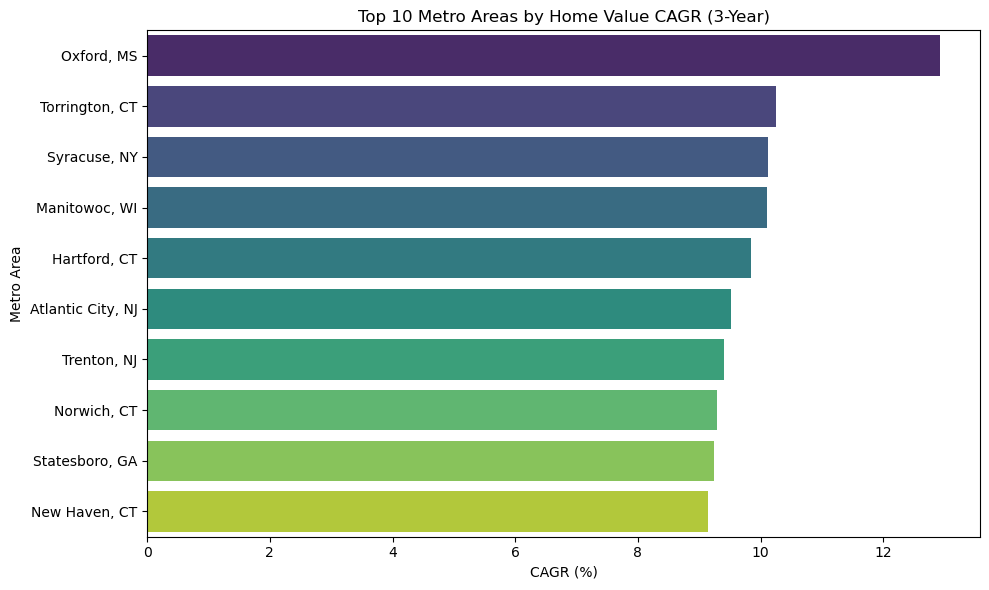

In [3]:
# Display top markets by long-term home value CAGR
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top_cagr_zhvi,
    x='ZHVI_CAGR',
    y='RegionName',
    hue='RegionName',           
    palette='viridis',
    dodge=False,                
    legend=False                
)
plt.title('Top 10 Metro Areas by Home Value CAGR (3-Year)')
plt.xlabel('CAGR (%)')
plt.ylabel('Metro Area')
plt.tight_layout()
plt.show()

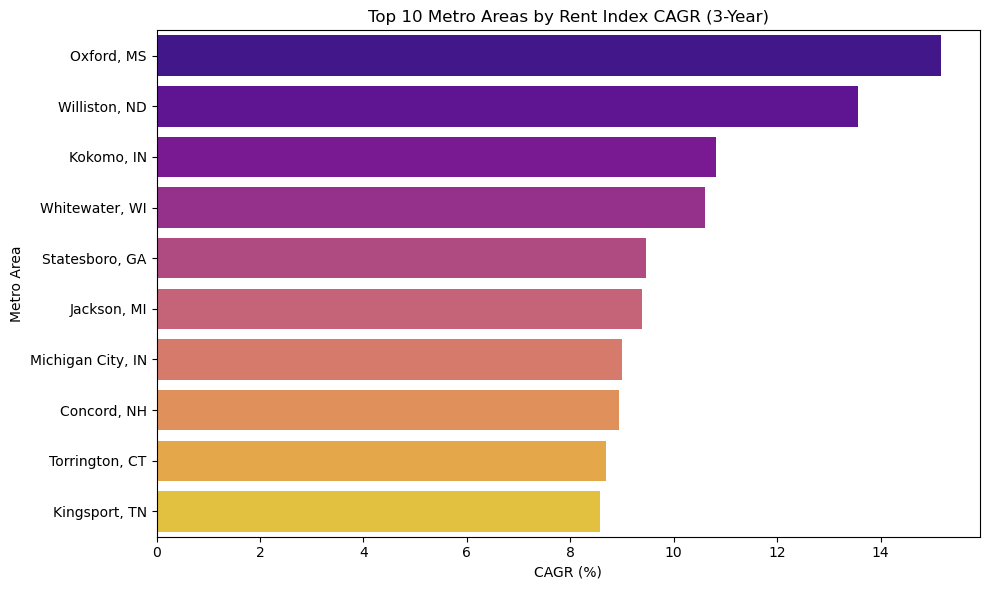

In [4]:
# Display top markets by long-term home value CAGR
plt.figure(figsize=(10, 6))
sns.barplot(data=top_cagr_zori, 
            x='ZORI_CAGR', 
            y='RegionName', 
            hue='RegionName',
            palette='plasma')
plt.title('Top 10 Metro Areas by Rent Index CAGR (3-Year)')
plt.xlabel('CAGR (%)')
plt.ylabel('Metro Area')
plt.tight_layout()
plt.show()

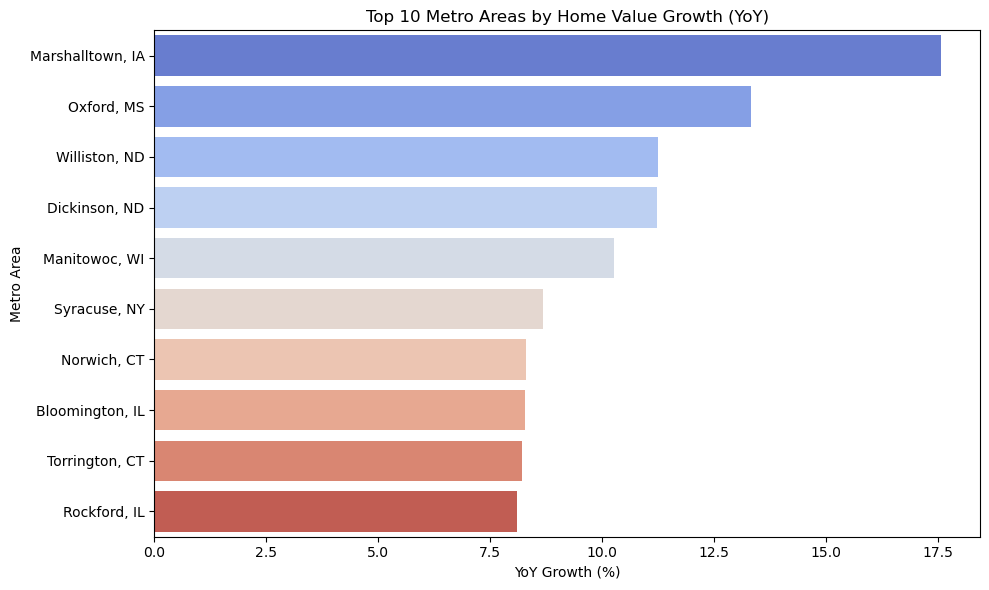

In [5]:
# Display top markets by Home Value Growth (YoY)
plt.figure(figsize=(10, 6))
sns.barplot(data=top_zhvi, 
            x='ZHVI_YoY', 
            y='RegionName', 
            hue='RegionName',
            palette='coolwarm')
plt.title('Top 10 Metro Areas by Home Value Growth (YoY)')
plt.xlabel('YoY Growth (%)')
plt.ylabel('Metro Area')
plt.tight_layout()
plt.show()

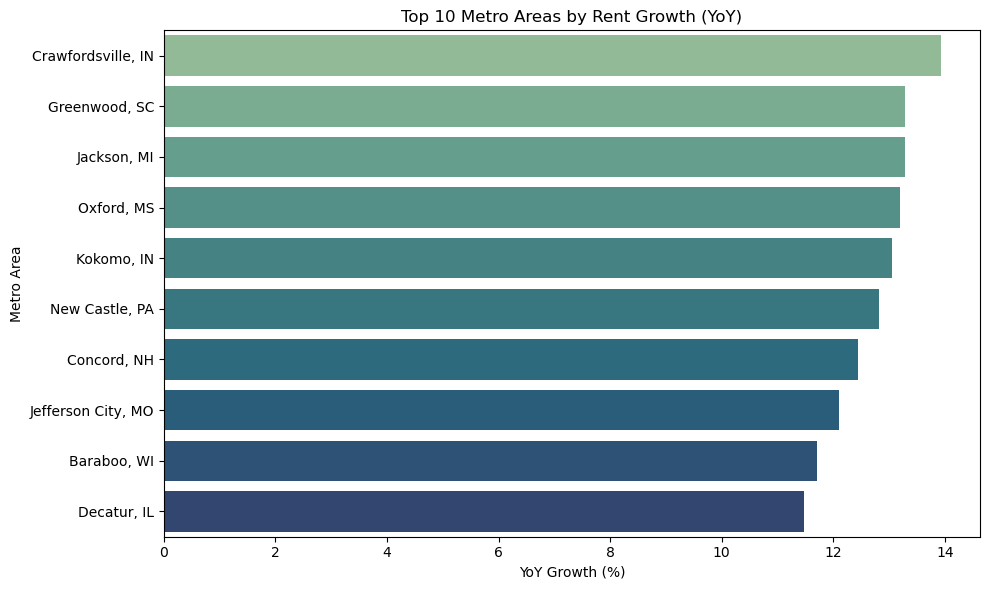

In [6]:
# Display top markets by Rent Growth (YoY)
plt.figure(figsize=(10, 6))
sns.barplot(data=top_zori, 
            x='ZORI_YoY', 
            y='RegionName', 
            hue='RegionName',
            palette='crest')
plt.title('Top 10 Metro Areas by Rent Growth (YoY)')
plt.xlabel('YoY Growth (%)')
plt.ylabel('Metro Area')
plt.tight_layout()
plt.show()

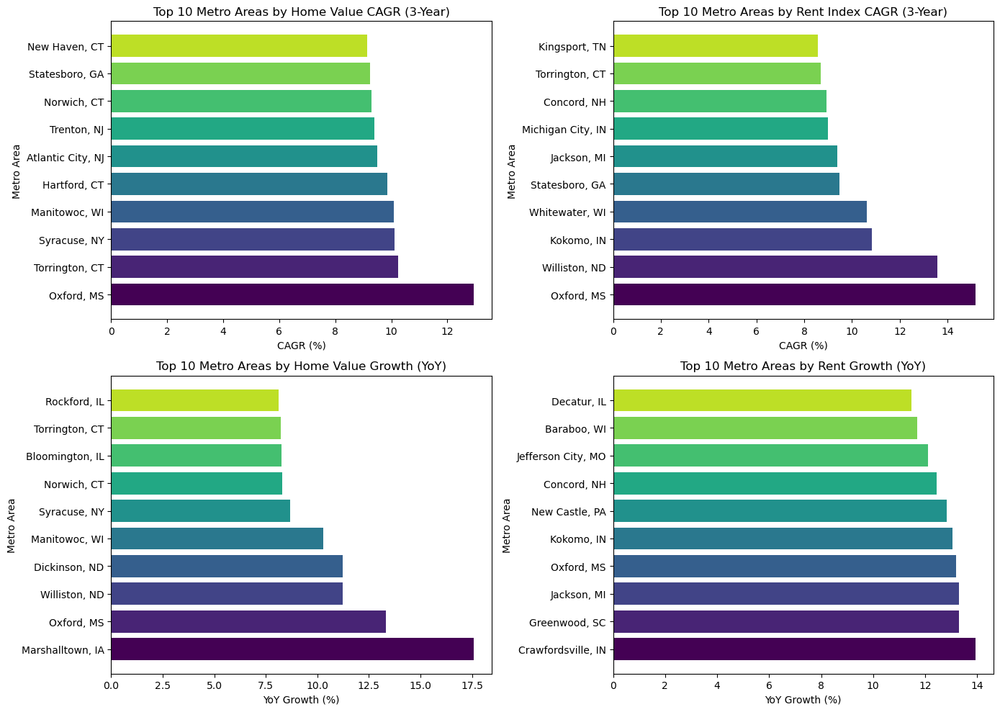

In [7]:
# Normalize function to map indices to [0, 1] for colormap
def get_color_map(n, cmap_name='viridis'):
    cmap = plt.get_cmap(cmap_name)
    return [cmap(i / n) for i in range(n)]

# Number of bars (we assume 10 here)
n = 10
colors = get_color_map(n, 'viridis')

fig = plt.figure(figsize=(14, 10))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4)

# Bar chart 1 – Home Value CAGR
ax1.barh(top_cagr_zhvi['RegionName'], top_cagr_zhvi['ZHVI_CAGR'], color=colors)
ax1.set_title('Top 10 Metro Areas by Home Value CAGR (3-Year)')
ax1.set_xlabel('CAGR (%)')
ax1.set_ylabel('Metro Area')

# Bar chart 2 – Rent Index CAGR
ax2.barh(top_cagr_zori['RegionName'], top_cagr_zori['ZORI_CAGR'], color=colors)
ax2.set_title('Top 10 Metro Areas by Rent Index CAGR (3-Year)')
ax2.set_xlabel('CAGR (%)')
ax2.set_ylabel('Metro Area')

# Bar chart 3 – Home Value YoY Growth
ax3.barh(top_zhvi['RegionName'], top_zhvi['ZHVI_YoY'], color=colors)
ax3.set_title('Top 10 Metro Areas by Home Value Growth (YoY)')
ax3.set_xlabel('YoY Growth (%)')
ax3.set_ylabel('Metro Area')

# Bar chart 4 – Rent Index YoY Growth
ax4.barh(top_zori['RegionName'], top_zori['ZORI_YoY'], color=colors)
ax4.set_title('Top 10 Metro Areas by Rent Growth (YoY)')
ax4.set_xlabel('YoY Growth (%)')
ax4.set_ylabel('Metro Area')

plt.tight_layout()
plt.show()


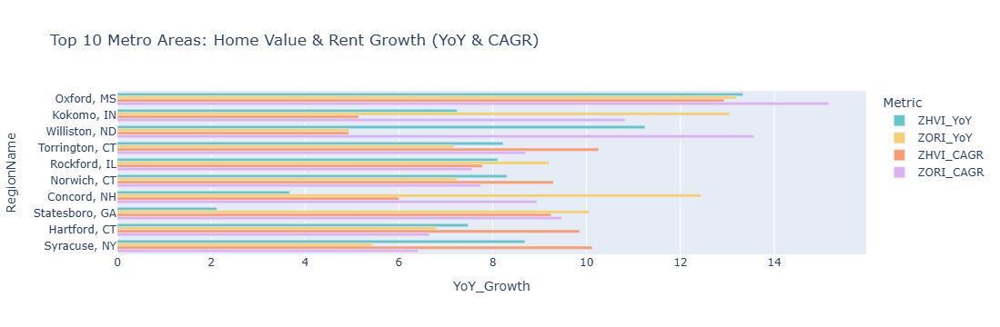

In [8]:
#Combined Visual
growth_df['Combined_YoY'] = growth_df['ZHVI_YoY'] + growth_df['ZORI_YoY'] + growth_df['ZHVI_CAGR'] + growth_df['ZORI_CAGR']
top_combined = growth_df.sort_values(by='Combined_YoY', ascending=False).head(10)

# Melt for grouped bar chart
melted = pd.melt(top_combined, 
                 id_vars=['RegionName'], 
                 value_vars=['ZHVI_YoY', 'ZORI_YoY', 'ZHVI_CAGR', 'ZORI_CAGR'],
                 var_name='Metric', value_name='YoY_Growth')

"""
plt.figure(figsize=(12, 6))
sns.barplot(data=melted, x='YoY_Growth', y='RegionName', hue='Metric', palette='Set2')
plt.title('Top 10 Metro Areas: Home Value vs. Rent Growth (YoY) vs. CAGR')
plt.xlabel('YoY Growth (%) & CAGR (%)')
plt.ylabel('Metro Area')
plt.legend(title='Metric')
plt.tight_layout()
plt.show()
"""

# interactive bar chart for combined YoY and CAGR analysis
fig = px.bar(
    melted,
    x='YoY_Growth',
    y='RegionName',
    color='Metric',
    orientation='h',
    barmode='group', 
    title='Top 10 Metro Areas: Home Value & Rent Growth (YoY & CAGR)',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    height=600
)

fig.update_layout(
    yaxis=dict(autorange='reversed'),
    bargap=0.25,
    legend_title='Metric'
)

fig.show()

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/4025793737.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



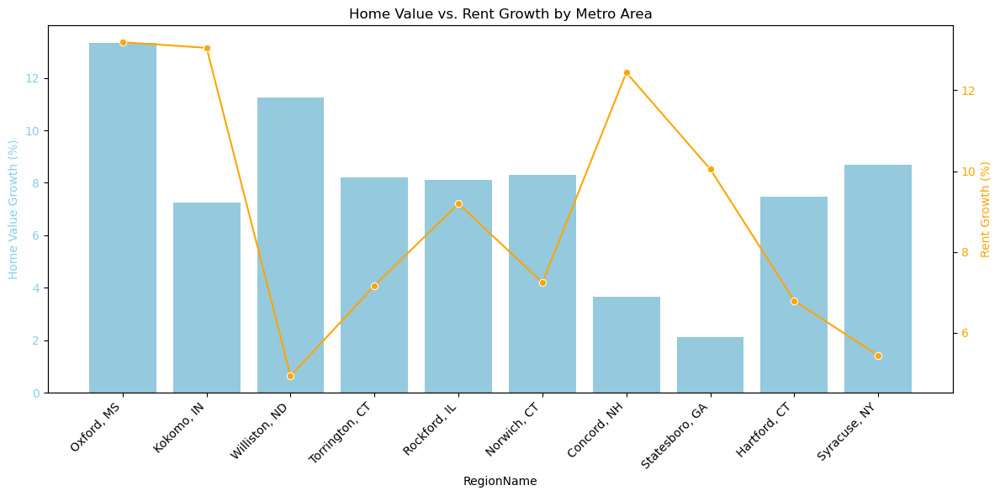

In [9]:
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar chart for home value growth
sns.barplot(x='RegionName', y='ZHVI_YoY', data=top_combined, color='skyblue', ax=ax1)
ax1.set_ylabel('Home Value Growth (%)', color='skyblue')
ax1.tick_params(axis='y', labelcolor='skyblue')
ax1.set_xticklabels(top_combined['RegionName'], rotation=45, ha='right')

# Line chart for rent growth
ax2 = ax1.twinx()
sns.lineplot(x='RegionName', y='ZORI_YoY', data=top_combined, color='orange', marker='o', ax=ax2)
ax2.set_ylabel('Rent Growth (%)', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

plt.title('Home Value vs. Rent Growth by Metro Area')
plt.tight_layout()
plt.show()


In [10]:
styled = top_combined.style.background_gradient(subset=['ZHVI_YoY', 'ZORI_YoY', 'ZHVI_CAGR', 'ZORI_CAGR'], cmap='YlGnBu')
styled


,RegionName,StateName,ZHVI_YoY,ZORI_YoY,ZHVI_CAGR,ZORI_CAGR,Combined_YoY
417,"Oxford, MS",MS,13.331582,13.189358,12.930121,15.161733,54.612793
366,"Kokomo, IN",IN,7.239578,13.049497,5.146063,10.819694,36.254833
449,"Williston, ND",ND,11.244310,4.933956,4.932521,13.568184,34.678971
224,"Torrington, CT",CT,8.218700,7.167299,10.254456,8.695609,34.336063
150,"Rockford, IL",IL,8.107070,9.195645,7.779926,7.560598,32.643239
179,"Norwich, CT",CT,8.302728,7.243197,9.291344,7.738533,32.575802
263,"Concord, NH",NH,3.670769,12.436983,6.001951,8.936454,31.046157
374,"Statesboro, GA",GA,2.121259,10.049076,9.238158,9.469505,30.877998
48,"Hartford, CT",CT,7.477551,6.794591,9.849796,6.645816,30.767755
88,"Syracuse, NY",NY,8.685372,5.438773,10.119534,6.405802,30.649482


### Market Trends Analysis: Top-Performing U.S. Real Estate Markets

### Top 3 Metro Markets (Ranked by Combined Score)

#### 1. **Oxford, MS**
- **ZHVI YoY**: 13.3%, **ZORI YoY**: 13.2%
- **ZHVI CAGR**: 12.9%, **ZORI CAGR**: 15.2%
- **Combined Score**: **54.6**
- **Conclusion**: Exceptional growth in both rents and home values — great for **buy, upgrade, and rent or flip** strategy

#### 2. **Kokomo, IN**
- **ZHVI YoY**: 7.2%, **ZORI YoY**: 13.0%
- **ZHVI CAGR**: 5.1%, **ZORI CAGR**: 10.8%
- **Combined Score**: **36.3**
- **Conclusion**: Strong rental demand, steady appreciation. Ideal for **cash-flow-driven rental investments**

#### 3. **Williston, ND**
- **ZHVI YoY**: 11.2%, **ZORI YoY**: 4.9%
- **ZHVI CAGR**: 4.9%, **ZORI CAGR**: 13.6%
- **Combined Score**: **34.7**
- **Conclusion**: Excellent rent CAGR with moderate home value growth — suited for **rental yield-focused investors**


### Conclusion

**Oxford, MS** leads as the best all-around investment market with top growth in **both** rent and home value.  
**Kokomo, IN** and **Williston, ND** are ideal for **monthly rental income** investors.  
Be cautious with markets showing only high YoY growth without sustained CAGR — those may reflect temporary spikes rather than sustainable growth.



# ********************************************************************

# Q2) Are the sale prices and inventory listing going up or down overall in the US? (Rohith Ambarish)

### The objective of this analysis is to determine whether sale prices and inventory listings are going up or down overall in the US real estate market. To achieve this, we will focus on data from the last 5 fiscal years (April 1st 2019 - March 31st 2025) to get the most relevant and recent insights.

**Data Selection:**
- Focused on US-Metro level data from Zillow’s **Median Sale Price and Inventory Listings** datasets.
- Considered data from the last 5 fiscal years (April 2019 - March 2025) to ensure relevance and recency.

**Metrics Used:**
- **YoY Growth (Year-over-Year):** To capture the recent 12-month momentum in both sale prices and inventory listings.
- **Fiscal Year Comparison:** To assess how the current fiscal year compares to the previous fiscal year.
- **Percentage Change:** Calculated the year-over-year percentage change for both metrics to identify the trend direction.

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

In [12]:
# Load the Datasets
sale_price_df = pd.read_csv("./datasets/median_sp_allhome.csv")
inventory_df = pd.read_csv("./datasets/for_sale_invtry_metro.csv")

In [13]:
# Step 3: Filter for US-Level Data
def extract_us_data(df, value_name):
    df_us = df[df['RegionName'] == 'United States'].copy()
    df_us = df_us.drop(columns=['RegionID', 'SizeRank', 'RegionName', 'RegionType', 'StateName'], errors='ignore')
    df_us = df_us.T
    df_us.index = pd.to_datetime(df_us.index, errors='coerce')
    df_us.columns = [value_name]
    df_us = df_us[df_us.index.notna()]  # Remove rows where index is NaT
    return df_us

sale_price_us = extract_us_data(sale_price_df, 'MedianSalePrice')
inventory_us = extract_us_data(inventory_df, 'Inventory')

In [14]:
sale_price_df = sale_price_df.dropna()
sale_price_df.count()

RegionID      301
SizeRank      301
RegionName    301
RegionType    301
StateName     301
             ... 
2024-11-30    301
2024-12-31    301
2025-01-31    301
2025-02-28    301
2025-03-31    301
Length: 211, dtype: int64

In [15]:
inventory_df= inventory_df.dropna()
inventory_df.count()

RegionID      863
SizeRank      863
RegionName    863
RegionType    863
StateName     863
             ... 
2024-11-30    863
2024-12-31    863
2025-01-31    863
2025-02-28    863
2025-03-31    863
Length: 90, dtype: int64

In [16]:
# Merge All into One DataFrame
combined_df = pd.concat([sale_price_us, inventory_us], axis=1)

# Filter for the Last 5 Fiscal Years (April 1st - March 31st)
current_fiscal_year_start = datetime(2024, 4, 1)
five_years_ago = datetime(2019, 4, 1)

# Filter the DataFrame to include only the last 5 fiscal years
filtered_df = combined_df[(combined_df.index >= five_years_ago) & (combined_df.index <= current_fiscal_year_start.replace(year=2025))]

# Trend Analysis for Each Metric

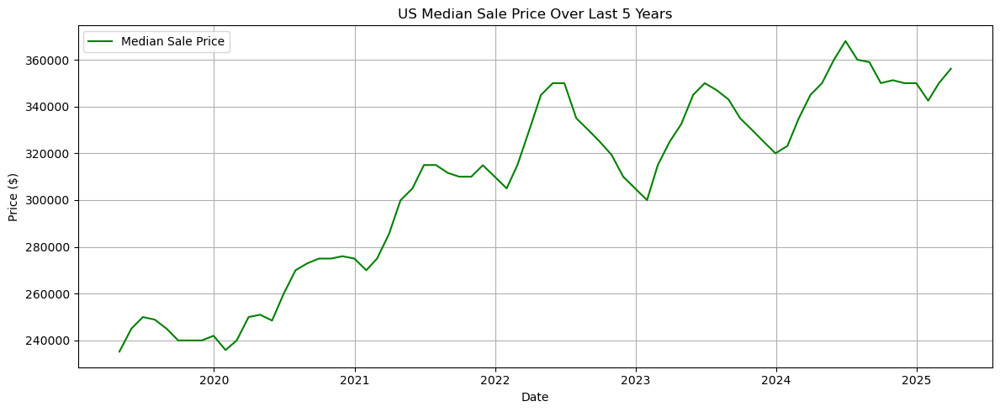

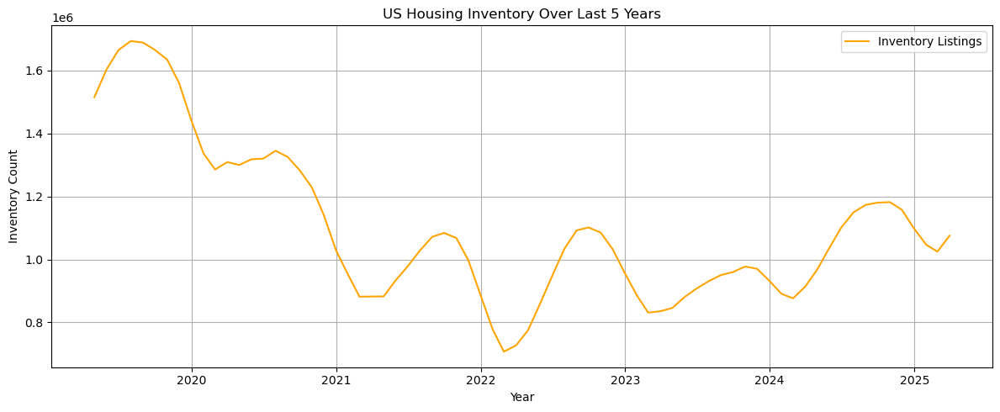

In [17]:
# 1. Median Sale Price
plt.figure(figsize=(12, 5))
plt.plot(filtered_df.index, filtered_df['MedianSalePrice'], color='green', label='Median Sale Price')
plt.title("US Median Sale Price Over Last 5 Years")
plt.xlabel("Date")
plt.ylabel("Price ($)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# 2. Inventory Listings
plt.figure(figsize=(12, 5))
plt.plot(filtered_df.index, filtered_df['Inventory'], color='orange', label='Inventory Listings')
plt.title("US Housing Inventory Over Last 5 Years")
plt.xlabel("Year")
plt.ylabel("Inventory Count")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#  Interactive Dual-Axis Plotly Chart 

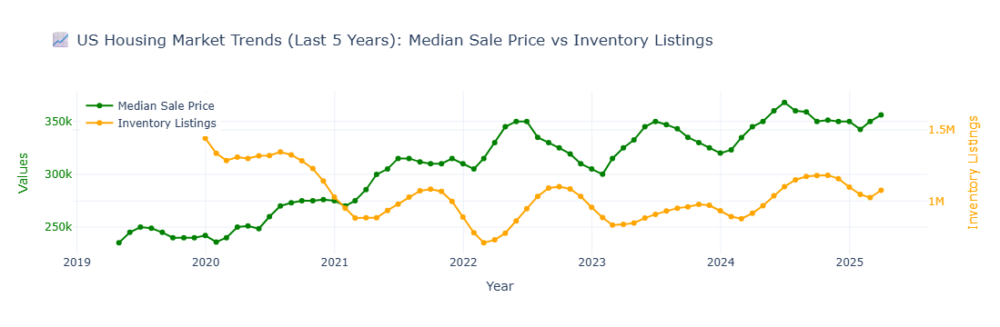

In [18]:
# Import Required Libraries
import plotly.graph_objects as go

# Create Interactive Dual-Axis Plotly Chart
fig = go.Figure()

# Median Sale Price trace (left y-axis)
fig.add_trace(go.Scatter(
    x=filtered_df.index,
    y=filtered_df['MedianSalePrice'],
    name='Median Sale Price',
    mode='lines+markers',
    line=dict(color='green'),
    yaxis='y1'
))

# Inventory Listings trace (right y-axis)
fig.add_trace(go.Scatter(
    x=filtered_df.index,
    y=filtered_df['Inventory'],
    name='Inventory Listings',
    mode='lines+markers',
    line=dict(color='orange'),
    yaxis='y2'
))

# Layout Configuration
fig.update_layout(
    title="📈 US Housing Market Trends (Last 5 Years): Median Sale Price vs Inventory Listings",
    xaxis=dict(title="Year"),
    yaxis=dict(
        title="Values",
        titlefont=dict(color="green"),
        tickfont=dict(color="green")
    ),
    yaxis2=dict(
        title="Inventory Listings",
        titlefont=dict(color="orange"),
        tickfont=dict(color="orange"),
        anchor="x",
        overlaying="y",
        side="right"
    ),
    legend=dict(x=0.01, y=0.99),
    hovermode="x unified",
    template="plotly_white"
)

# Display the chart
fig.show()

 **Insight:**

The US real estate market shows a **consistent rise in sale prices** over the last 5 fiscal years, indicating **long-term appreciation**. However, **inventory levels have declined significantly**, leading to a **seller's market** with high demand and limited supply in consideration for last 5 years.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/989106920.py:27: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/989106920.py:27: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



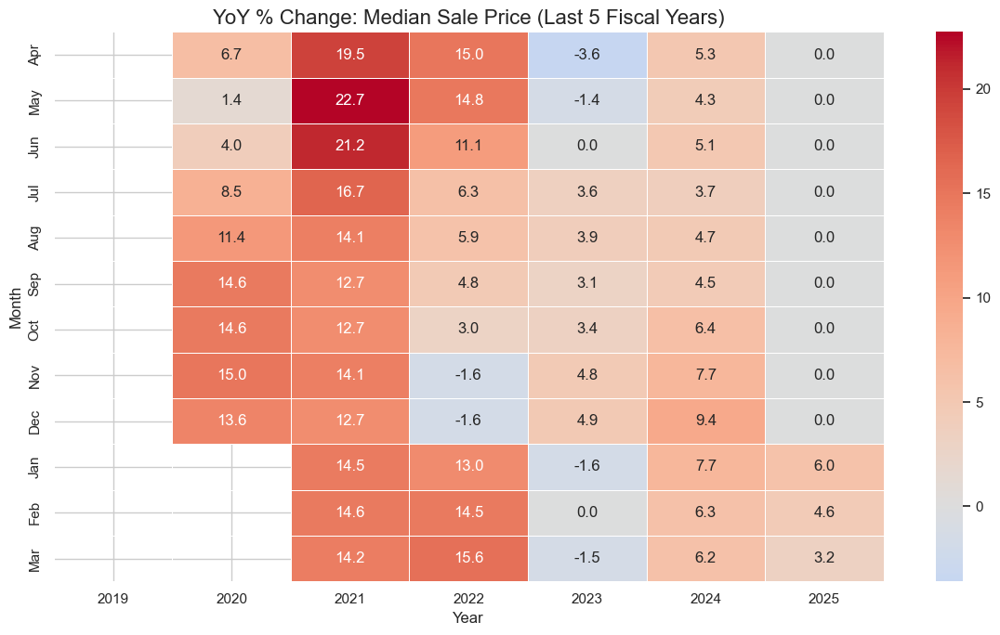

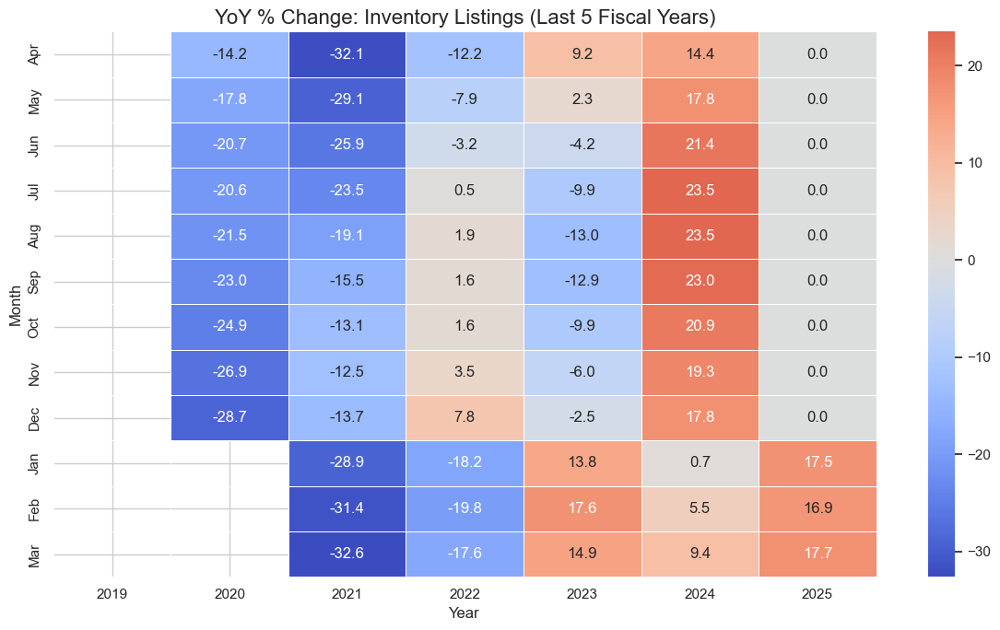

In [19]:
# Import Libraries
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Generate Pivot Tables

# Median Sale Price Pivot Table
sale_price_heatmap = filtered_df[['MedianSalePrice']].dropna().copy()
sale_price_heatmap['Year'] = sale_price_heatmap.index.year
sale_price_heatmap['Month'] = sale_price_heatmap.index.month
sale_price_heatmap['MonthName'] = sale_price_heatmap.index.strftime('%b')
sale_price_pivot = sale_price_heatmap.pivot_table(values='MedianSalePrice', index='MonthName', columns='Year', aggfunc='mean')
sale_price_pivot = sale_price_pivot.reindex(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar'])

# Inventory Listings Pivot Table
inventory_heatmap = filtered_df[['Inventory']].dropna().copy()
inventory_heatmap['Year'] = inventory_heatmap.index.year
inventory_heatmap['Month'] = inventory_heatmap.index.month
inventory_heatmap['MonthName'] = inventory_heatmap.index.strftime('%b')
inventory_pivot = inventory_heatmap.pivot_table(values='Inventory', index='MonthName', columns='Year', aggfunc='mean')
inventory_pivot = inventory_pivot.reindex(['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar'])

# Calculate Year-over-Year % Change
def calculate_yoy_change(pivot_df):
    return pivot_df.pct_change(axis=1) * 100

sale_price_yoy = calculate_yoy_change(sale_price_pivot)
inventory_yoy = calculate_yoy_change(inventory_pivot)

# Plot Median Sale Price YoY % Change Heatmap
plt.figure(figsize=(12, 7))
sns.heatmap(sale_price_yoy, cmap='coolwarm', annot=True, fmt=".1f", center=0, linewidths=.5)
plt.title("YoY % Change: Median Sale Price (Last 5 Fiscal Years)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Month")
plt.tight_layout()
plt.show()

# Plot Inventory Listings YoY % Change Heatmap
plt.figure(figsize=(12, 7))
sns.heatmap(inventory_yoy, cmap='coolwarm', annot=True, fmt=".1f", center=0, linewidths=.5)
plt.title("YoY % Change: Inventory Listings (Last 5 Fiscal Years)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Month")
plt.tight_layout()
plt.show()

**Insight:**
- The **YoY % Change Heatmaps** for Median Sale Price and Inventory Listings over the last 5 fiscal years reveal contrasting trends.
- **Sale Price:** Generally shows positive growth, indicating a steady increase in property values, with occasional dips suggesting market corrections.
- **Inventory Listings:** Shows a consistent decline from 2019 to 2022, followed by a partial recovery in 2023 and 2024, reflecting supply constraints that gradually eased in recent years.

## State-wise analysis

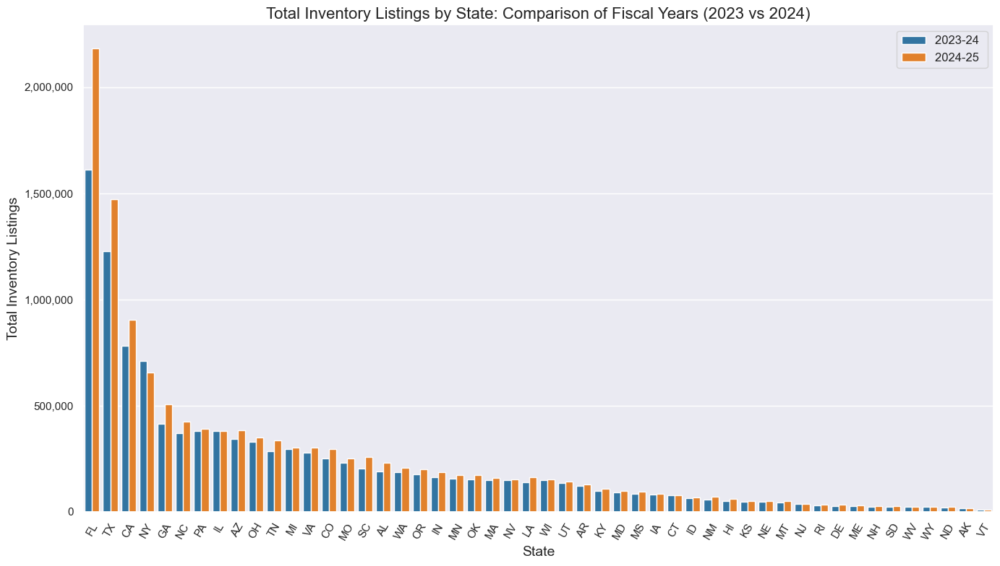

In [20]:
from matplotlib.ticker import FuncFormatter

# Set plot style
sns.set(style="darkgrid")

# Data Preparation
# Drop unnecessary columns
drop_cols = ['RegionID', 'SizeRank', 'RegionType']
inventory_df = inventory_df.drop(columns=drop_cols, errors='ignore')

# Extract relevant columns (State Name and Fiscal Year Data)
columns_needed = ['RegionName', 'StateName']
statewise_df = inventory_df[columns_needed + list(inventory_df.columns[2:])].dropna()

# Ensure StateName is treated as a string
statewise_df['StateName'] = statewise_df['StateName'].astype(str)

# Aggregate Total Listings by Fiscal Year (April 1st - March 31st)
# Define fiscal year ranges
latest_fy_cols = [col for col in inventory_df.columns if '2024' in col or '2025-03' in col]
prev_fy_cols = [col for col in inventory_df.columns if '2023' in col or '2024-03' in col]

# Sum total listings for each year
statewise_df['2023_Total'] = statewise_df[prev_fy_cols].sum(axis=1)
statewise_df['2024_Total'] = statewise_df[latest_fy_cols].sum(axis=1)

# Aggregate by State
statewise_agg = statewise_df.groupby('StateName')[['2023_Total', '2024_Total']].sum()

# Sort data by Total Listings in descending order
# Calculate the combined total for sorting purpose
statewise_agg['Total'] = statewise_agg['2023_Total'] + statewise_agg['2024_Total']
statewise_agg = statewise_agg.sort_values(by='Total', ascending=False).drop(columns=['Total'])

# Plotting the Comparison Bar Plot
plt.figure(figsize=(14, 8))

# Reset index and prepare data for plotting
plot_data = statewise_agg.reset_index().melt(id_vars='StateName', var_name='Year', value_name='Total Listings')

# Creating the bar plot for comparison (sorted data)
sns.barplot(data=plot_data, x='StateName', y='Total Listings', hue='Year', palette=['#1f77b4', '#ff7f0e'])

# Format y-axis to display full numbers with commas
plt.gca().get_yaxis().set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))

# Modify the legend with custom labels
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles=handles, labels=["2023-24 ", "2024-25 "], loc="upper right", fontsize=12, title_fontsize=14)

# Title and labels
plt.title("Total Inventory Listings by State: Comparison of Fiscal Years (2023 vs 2024)", fontsize=16)
plt.xlabel("State", fontsize=14)
plt.ylabel("Total Inventory Listings", fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=60)

# Show plot
plt.tight_layout()
plt.show()

The bar plot shows the **total inventory listings by state** for the fiscal years **2023 vs 2024**. States like **Florida (FL), Texas (TX), and California (CA)** have the **highest inventory levels**, indicating a large supply of available properties. Notably, in most top states, **inventory levels have increased from 2023 to 2024**, suggesting a **growing housing supply**. This trend may reflect **increased property listings** in key markets.

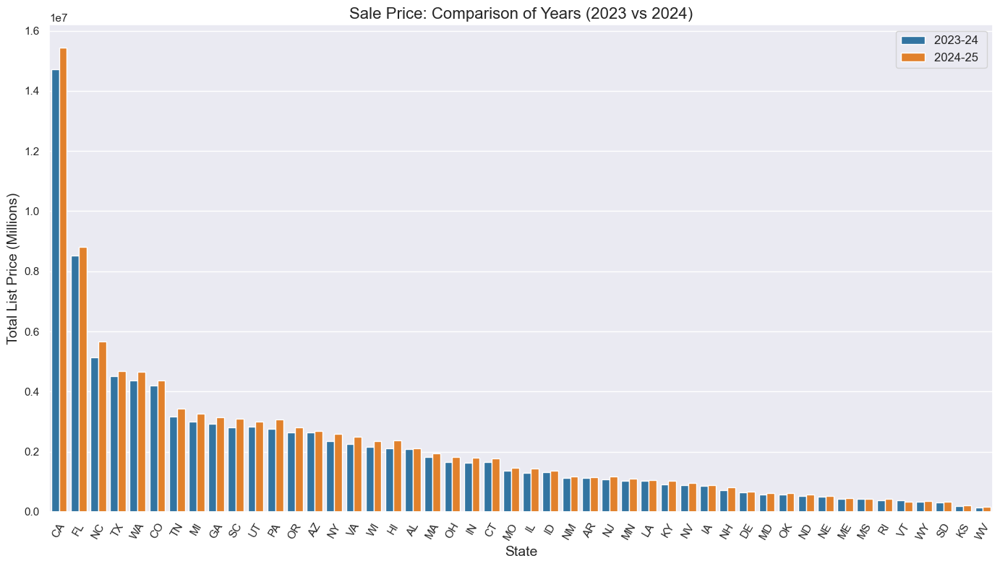

In [21]:
# Import Required Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="darkgrid")

# Load and Prepare Data
# Load the datasets
sale_price_df = pd.read_csv("./datasets/median_sp_allhome.csv")

# Extract relevant columns (RegionName, StateName, March 2023, March 2024)
columns_needed = ['RegionName', 'StateName', '2023-03-31', '2024-03-31']
statewise_df = sale_price_df[columns_needed].dropna()

# Ensure StateName is treated as a string
statewise_df['StateName'] = statewise_df['StateName'].astype(str)

# Aggregate total listings by state
statewise_agg = statewise_df.groupby('StateName')[['2023-03-31', '2024-03-31']].sum()

# Convert column names to string explicitly to avoid issues during plotting
statewise_agg.columns = statewise_agg.columns.map(str)

# Sort data by Total List Price in descending order
# Calculate the combined total for sorting purpose
statewise_agg['Total'] = statewise_agg['2023-03-31'] + statewise_agg['2024-03-31']
statewise_agg = statewise_agg.sort_values(by='Total', ascending=False).drop(columns=['Total'])

#  Plotting the Comparison Bar Plot
plt.figure(figsize=(14, 8))

# Reset index and prepare data for plotting
plot_data = statewise_agg.reset_index().melt(id_vars='StateName', var_name='Year', value_name='Total List Price')

# Creating the bar plot for comparison (sorted data)
sns.barplot(data=plot_data, x='StateName', y='Total List Price', hue='Year', palette=['#1f77b4', '#ff7f0e'])

# Modify the legend with custom labels
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles=handles, labels=["2023-24 ", "2024-25 "], loc="upper right", fontsize=12, title_fontsize=14)

# Title and labels
plt.title("Sale Price: Comparison of Years (2023 vs 2024)", fontsize=16)
plt.xlabel("State", fontsize=14)
plt.ylabel("Total List Price (Millions)", fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=60)

# Show plot
plt.tight_layout()
plt.show()

The bar plot shows the **total list price by state** for the fiscal years **2023-24 vs 2024-25**. States like **California (CA)**, **Florida (FL)**, and **North Carolina (NC)** dominate the list with the **highest total list prices**, indicating **strong housing markets**. The comparison reveals that most of these top states have shown a **slight increase in list prices** from **2023-24 to 2024-25**, suggesting **continued demand and market strength** in these regions.

## The Hierarchical breakdown with Sunburst Chart

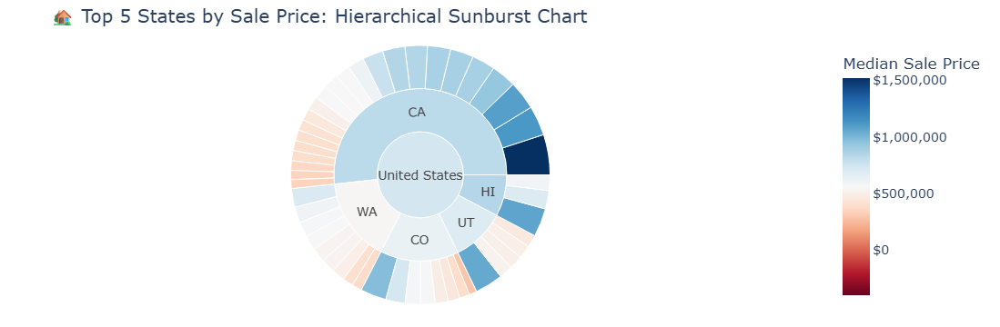

In [22]:
import pandas as pd
import plotly.express as px

# Drop unnecessary columns
drop_cols = ['RegionID', 'SizeRank', 'RegionType']
sale_price_df = sale_price_df.drop(columns=drop_cols, errors='ignore')

# Data Preparation
# Extract the most recent fiscal year columns
latest_fy_cols = [col for col in sale_price_df.columns if '2024' in col or '2025-03' in col]

# Aggregate the most recent year's median sale price by state and region
sale_price_df['Latest_Median_Price'] = sale_price_df[latest_fy_cols].mean(axis=1)

# Create a new column for the country level
sale_price_df['Country'] = 'United States'

# Filter and clean the data
sunburst_data = sale_price_df[['Country', 'StateName', 'RegionName', 'Latest_Median_Price']].dropna()

# Identify Top 5 States by Median Sale Price
top5_states = sunburst_data.groupby('StateName')['Latest_Median_Price'].mean().nlargest(5).index
sunburst_top5 = sunburst_data[sunburst_data['StateName'].isin(top5_states)]

# Create Sunburst Chart for Top 5 States
fig = px.sunburst(
    sunburst_top5, 
    path=['Country', 'StateName', 'RegionName'], 
    values='Latest_Median_Price',
    title="🏡 Top 5 States by Sale Price: Hierarchical Sunburst Chart",
    color='Latest_Median_Price', 
    color_continuous_scale='RdBu',   # Diverging color scale
    color_continuous_midpoint=sunburst_top5['Latest_Median_Price'].median(),
    hover_data={'Latest_Median_Price': ':.2f'}  # Display with two decimal points
)

# Customize hover template
fig.update_traces(
    hovertemplate="<b>%{label}</b><br>Median Price: $%{value:,.2f}<br>Contribution: %{percentParent:.1%}"
)

# Update layout for better visualization
fig.update_layout(
    margin=dict(t=50, l=25, r=25, b=25),
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    coloraxis_colorbar=dict(
        title="Median Sale Price",
        tickformat="$,.0f"
    ),
    font=dict(size=14)
)

# Display the chart
fig.show()

The sunburst chart efficiently highlights the **hierarchical breakdown of the top 5 states by median sale price as on March 2025**, offering visual insights into both state-level and regional differences. **It helps identify which states and their respective regions are leading in the housing market.**

**Hovering over each segment shows:**
- **Label**: Name of the region or state.
- **Median Price:** The latest median sale price in dollars.
- **Contribution:** The percentage contribution to the parent category (e.g., how much a region contributes to the state).

## Geographical Heatmap for Inventory listing

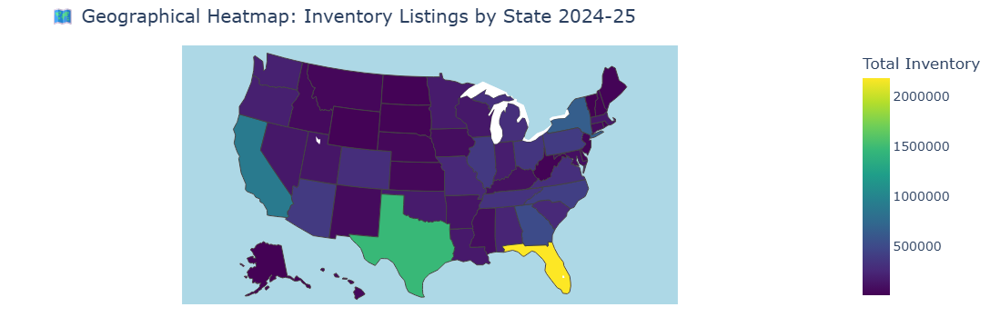

In [23]:
# Import Required Libraries
import pandas as pd
import plotly.express as px

# Drop unnecessary columns
drop_cols = ['RegionID', 'SizeRank', 'RegionType']
inventory_df = inventory_df.drop(columns=drop_cols, errors='ignore')

# Define fiscal year ranges
latest_fy_cols = [col for col in inventory_df.columns if '2024' in col or '2025-03' in col]

# Aggregate the most recent year's inventory by state
inventory_df['Latest_Inventory'] = inventory_df[latest_fy_cols].sum(axis=1)

# Group by State and calculate the total inventory
state_inventory = inventory_df.groupby('StateName')['Latest_Inventory'].sum().reset_index()

# Create Geographical Heatmap
fig = px.choropleth(
    state_inventory,
    locations='StateName',
    locationmode='USA-states',  # Use state abbreviations
    color='Latest_Inventory',
    hover_name='StateName',
    color_continuous_scale='Viridis',
    title='🗺️ Geographical Heatmap: Inventory Listings by State 2024-25',
    scope='usa',
    labels={'Latest_Inventory': 'Total Inventory Listings'},
)

# Customize layout
fig.update_layout(
    geo=dict(bgcolor='lightblue'),
    coloraxis_colorbar=dict(
        title="Total Inventory",
        tickformat=".0f"
    ),
    margin=dict(t=50, l=25, r=25, b=25),
    font=dict(size=14)
)

# Show plot
fig.show()

The geographical heatmap visualizes the distribution of housing inventory across the United States, based on the latest fiscal year data (2024-25). This visual representation allows us to understand the variation in inventory levels by state.



## Overall US Sales and Inventory Listing Analysis

In [24]:
# Extract data for March 2024 and March 2025 from the filtered DataFrame
try:
    march_2024 = filtered_df.loc['2024-03-31']
    march_2025 = filtered_df.loc['2025-03-31']

    # Calculate percentage change
    price_change = ((march_2025['MedianSalePrice'] - march_2024['MedianSalePrice']) / march_2024['MedianSalePrice']) * 100
    inventory_change = ((march_2025['Inventory'] - march_2024['Inventory']) / march_2024['Inventory']) * 100

    # Determine trend arrows
    price_trend = "↗️" if price_change > 0 else "↘️"
    inventory_trend = "↗️" if inventory_change > 0 else "↘️"

    # Prepare summary data
    summary_data = {
        "Metric": ["Median Sale Price", "Inventory Listings"],
        "Mar 2024": [f"${march_2024['MedianSalePrice']:.2f}", f"{int(march_2024['Inventory']):,}"],
        "Mar 2025": [f"${march_2025['MedianSalePrice']:.2f}", f"{int(march_2025['Inventory']):,}"],
        "% Change": [f"{price_change:.2f}%", f"{inventory_change:.2f}%"],
        "Trend": [price_trend, inventory_trend]
    }

    # Create DataFrame
    summary_df = pd.DataFrame(summary_data)

    # Display the summary table
    print("\n Summary Table – March 2024 vs March 2025\n")
    display(summary_df)

    
except KeyError:
    print("❗ Error: Data for March 2024 or March 2025 is not available in the filtered DataFrame.")


 Summary Table – March 2024 vs March 2025



,Metric,Mar 2024,Mar 2025,% Change,Trend
0,Median Sale Price,$345000.00,$356140.00,3.23%,↗️
1,Inventory Listings,"913,841","1,075,461",17.69%,↗️


## **Key Findings:**
**Median Sale Price Increase:**
- The median sale price has increased to $356,140 (March 2025), representing a +3.23% growth.
- This indicates that housing prices continue to rise, albeit at a moderate rate.
- The upward trend suggests a steady appreciation in property values, consistent with the broader trend observed over the last few years.

**Significant Rise in Inventory Listings:**
- Inventory listings have increased substantially from 913,841 (March 2024) to 1,075,461 (March 2025), showing a +17.69% increase.
- This rise indicates that more properties are being listed for sale, possibly due to owners capitalizing on high prices or a market shift towards increased supply.
- The increase in inventory suggests a potential cooling of the housing market, as more homes are available compared to the previous year.

## **Conclusion**
- The data suggests that the **US real estate market remains robust, with both prices and inventory rising over the past year.**
- The **rise in prices indicates ongoing demand**, while the **increase in inventory points to more sellers entering the market**.
- For investors, this scenario means that while opportunities are increasing, the higher prices still reflect a competitive environment.
- Monitoring market shifts in the coming months will be crucial to understanding whether prices will stabilize or continue to climb as inventory rises.

# ********************************************************************

 ## **Q3) Should I wait to invest or should I invest now and if so then where should I invest. (You could recommend more than one place)? (Manoj Ravi Kumar)**

## **Introduction**

In this analysis, we evaluate the performance of single-family homes (SFH) and multi-family homes (MFH) investments using historical data and forecast projections. Our primary objective is to understand the average rent growth, projected returns, and the potential profit margins associated with these investments. The analysis also examines how economic trends and market shifts influence real estate returns over time.

## **Analysis Overview**

### We begin our exploration with the following key questions:

### **1. What are the historical rent growth trends for Single-Family Homes (SFH) and Multi-Family Homes (MFH)?**

We analyze historical rent data to identify growth patterns and variations across different regions.

### **2. What is the projected rent growth for SFH and MFH in the next few years?**

Using forecast models, we estimate future rent growth to understand potential revenue from these properties.

### **3. Which regions are expected to have the highest growth for SFH and MFH?**

We identify the top-performing regions with the highest expected growth rates.

### **4. Should I wait to invest or should I invest now, and if so, where should I invest?**

We evaluate current market conditions, growth forecasts, and economic indicators to recommend optimal investment regions and strategies.

In [25]:
import pandas as pd
import re
import plotly.graph_objects as go

zori_sfh = pd.read_csv("./datasets/rental_zori_sfh.csv")
zori_mfh = pd.read_csv("./datasets/rental_zori_mfh.csv")
forecast_sfh = pd.read_csv("./datasets/rental_forecast_sfh.csv")
forecast_mfh = pd.read_csv("./datasets/rental_forecast_mfh.csv")
df = pd.read_csv("./datasets/zhvi_metro_sfh.csv")

zori_sfh.columns = zori_sfh.columns.str.strip()
zori_mfh.columns = zori_mfh.columns.str.strip()
forecast_sfh.columns = forecast_sfh.columns.str.strip()
forecast_mfh.columns = forecast_mfh.columns.str.strip()

In [26]:
def extract_fiscal_years(df):
    
    date_cols = [col for col in df.columns if col.count('-') == 2 and col[:4].isdigit()]

    zori_long = df[['RegionName'] + date_cols].melt(
        id_vars='RegionName', var_name='Month', value_name='ZORI'
    )

    zori_long['Month'] = pd.to_datetime(zori_long['Month'])

    zori_long['FiscalYear'] = zori_long['Month'].apply(
        lambda d: f"{d.year}-{str(d.year+1)[-2:]}" if d.month >= 4 else f"{d.year-1}-{str(d.year)[-2:]}"
    )

    valid_years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']
    zori_long = zori_long[zori_long['FiscalYear'].isin(valid_years)]
    
    return zori_long

sfh_fiscal = extract_fiscal_years(zori_sfh)
mfh_fiscal = extract_fiscal_years(zori_mfh)

sfh_yearly = sfh_fiscal.groupby(['RegionName', 'FiscalYear'])['ZORI'].mean().reset_index()
mfh_yearly = mfh_fiscal.groupby(['RegionName', 'FiscalYear'])['ZORI'].mean().reset_index()

sfh_pivot = sfh_yearly.pivot(index='RegionName', columns='FiscalYear', values='ZORI').reset_index()
mfh_pivot = mfh_yearly.pivot(index='RegionName', columns='FiscalYear', values='ZORI').reset_index()

sfh_pivot['CAGR_5yr'] = ((sfh_pivot['2024-25'] / sfh_pivot['2020-21']) ** (1/5) - 1) * 100
mfh_pivot['CAGR_5yr'] = ((mfh_pivot['2024-25'] / mfh_pivot['2020-21']) ** (1/5) - 1) * 100

top5_sfh = sfh_pivot.nlargest(5, 'CAGR_5yr')
top5_mfh = mfh_pivot.nlargest(5, 'CAGR_5yr')

sfh_growth_jun = float(forecast_sfh.loc[0, '2025-06-30'])
sfh_growth_mar = float(forecast_sfh.loc[0, '2026-03-31'])
mfh_growth_jun = float(forecast_mfh.loc[0, '2025-06-30'])
mfh_growth_mar = float(forecast_mfh.loc[0, '2026-03-31'])

top5_sfh = top5_sfh.round(2)
top5_mfh = top5_mfh.round(2)

print("Top 5 Single-Family Homes (5-Year CAGR):")
display(top5_sfh)

print("\nTop 5 Multi-Family Homes (5-Year CAGR):")
display(top5_mfh)

Top 5 Single-Family Homes (5-Year CAGR):


FiscalYear,RegionName,2020-21,2021-22,2022-23,2023-24,2024-25,CAGR_5yr
25,"Atlantic City, NJ",3469.43,4053.75,4819.72,5304.97,5992.59,11.55
343,"Naples, FL",2268.49,2921.64,3436.72,3668.71,3683.00,10.18
446,"Sebastian, FL",1547.47,1874.34,2149.71,2267.67,2370.75,8.91
316,"Miami, FL",2249.94,2694.31,3197.47,3332.49,3440.32,8.86
268,"Knoxville, TN",1372.35,1612.10,1850.18,2001.62,2096.26,8.84



Top 5 Multi-Family Homes (5-Year CAGR):


FiscalYear,RegionName,2020-21,2021-22,2022-23,2023-24,2024-25,CAGR_5yr
23,"Atlantic City, NJ",1137.24,1399.33,1617.23,1716.78,1847.21,10.19
315,"Naples, FL",1525.15,1990.92,2390.71,2404.47,2421.57,9.69
484,"Williston, ND",806.50,859.72,930.16,1131.70,1254.73,9.24
49,"Bloomington, IL",595.64,669.04,761.20,834.43,922.29,9.14
244,"Knoxville, TN",1027.34,1242.65,1452.38,1530.87,1576.86,8.95


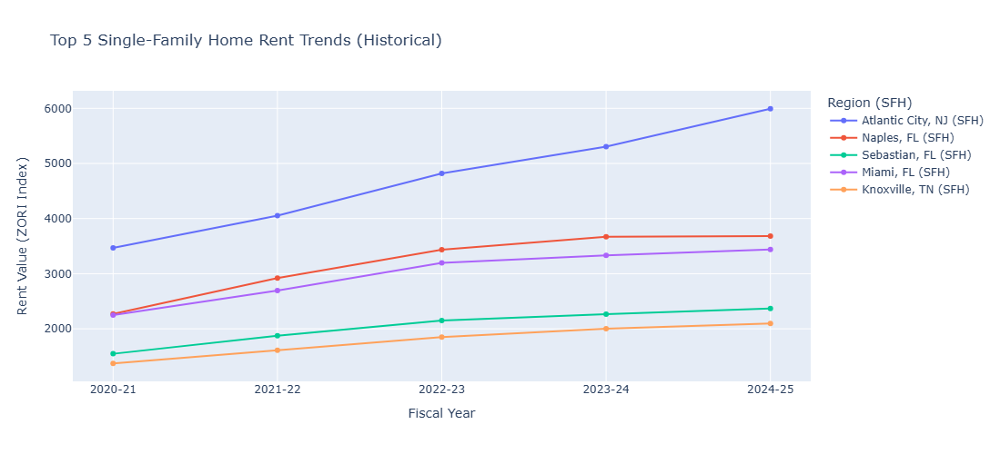

In [27]:
import plotly.graph_objects as go

fig_sfh = go.Figure()

for _, row in top5_sfh.iterrows():
    region = row['RegionName']
    values = row[['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']].values
    years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']

    fig_sfh.add_trace(go.Scatter(
        x=years,
        y=values,
        mode='lines+markers',
        name=f"{region} (SFH)",
        line=dict(dash='solid')
    ))

fig_sfh.update_layout(
    title="Top 5 Single-Family Home Rent Trends (Historical)",
    xaxis_title="Fiscal Year",
    yaxis_title="Rent Value (ZORI Index)",
    width=1000,
    height=500,
    legend_title="Region (SFH)"
)

fig_sfh.show()

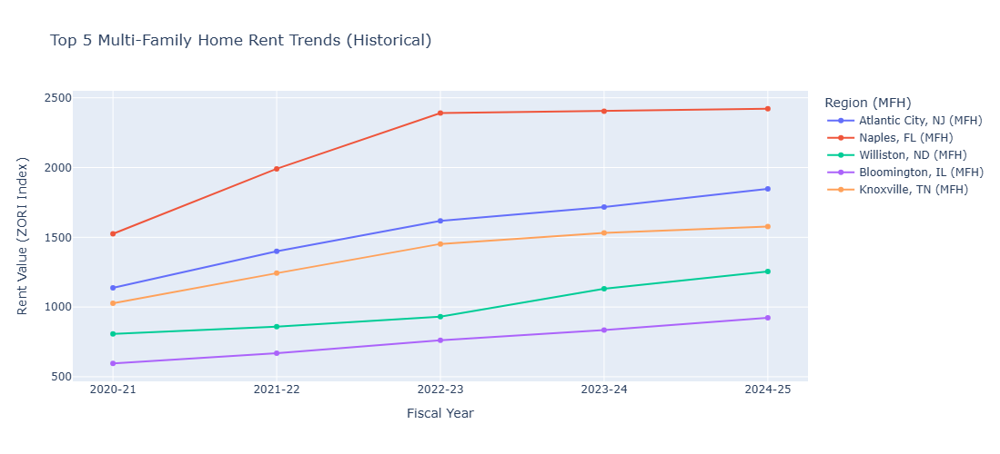

In [28]:
import plotly.graph_objects as go

fig_mfh = go.Figure()

for _, row in top5_mfh.iterrows():
    region = row['RegionName']
    values = row[['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']].values
    years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']

    fig_mfh.add_trace(go.Scatter(
        x=years,
        y=values,
        mode='lines+markers',
        name=f"{region} (MFH)",
        line=dict(dash='solid')
    ))

fig_mfh.update_layout(
    title="Top 5 Multi-Family Home Rent Trends (Historical)",
    xaxis_title="Fiscal Year",
    yaxis_title="Rent Value (ZORI Index)",
    width=1000,
    height=500,
    legend_title="Region (MFH)"
)

fig_mfh.show()

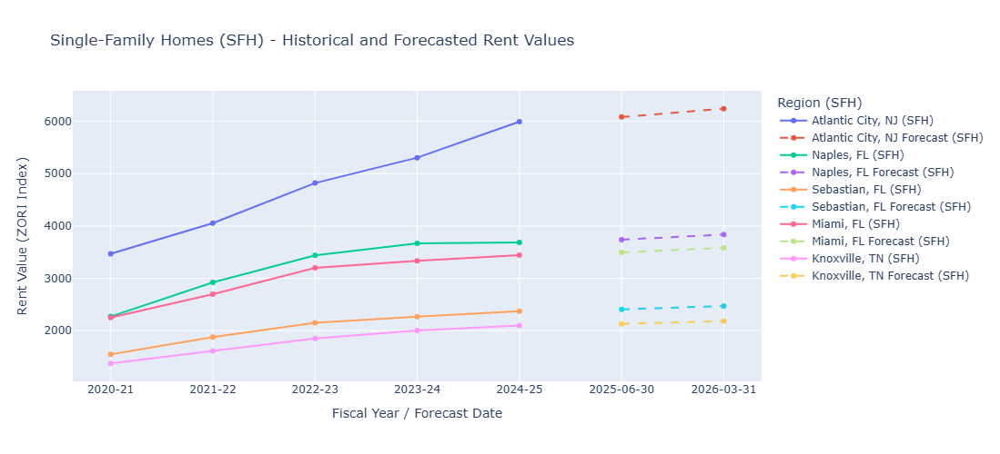

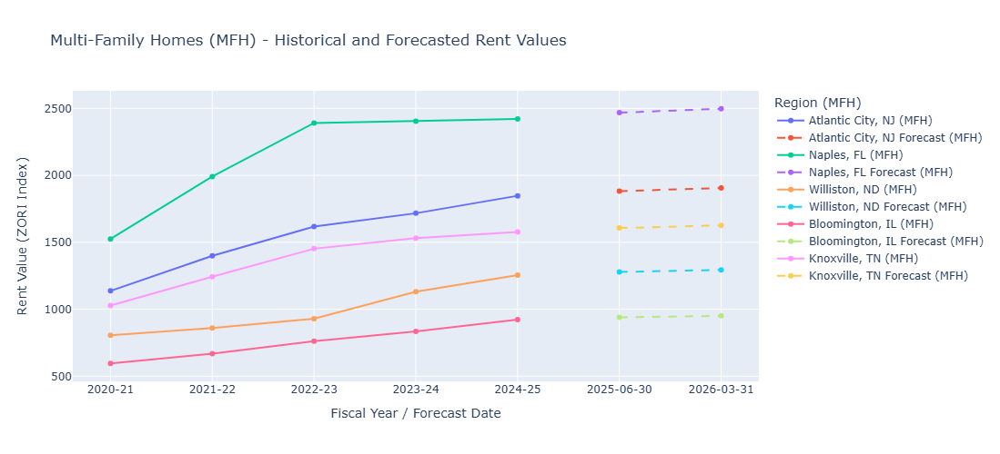

In [29]:
import plotly.graph_objects as go

fig_sfh_forecast = go.Figure()
fig_mfh_forecast = go.Figure()

for _, row in top5_sfh.iterrows():
    region = row['RegionName']
    values = row[['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']].values
    years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']

    fig_sfh_forecast.add_trace(go.Scatter(
        x=years,
        y=values,
        mode='lines+markers',
        name=f"{region} (SFH)",
        line=dict(dash='solid')
    ))

    last_value = values[-1]
    forecast_jun = last_value * (1 + sfh_growth_jun / 100)
    forecast_mar = forecast_jun * (1 + sfh_growth_mar / 100)

    fig_sfh_forecast.add_trace(go.Scatter(
        x=['2025-06-30', '2026-03-31'],
        y=[forecast_jun, forecast_mar],
        mode='lines+markers',
        name=f"{region} Forecast (SFH)",
        line=dict(dash='dash')
    ))

fig_sfh_forecast.update_layout(
    title="Single-Family Homes (SFH) - Historical and Forecasted Rent Values",
    xaxis_title="Fiscal Year / Forecast Date",
    yaxis_title="Rent Value (ZORI Index)",
    width=1000,
    height=500,
    legend_title="Region (SFH)"
)

for _, row in top5_mfh.iterrows():
    region = row['RegionName']
    values = row[['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']].values
    years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']

    fig_mfh_forecast.add_trace(go.Scatter(
        x=years,
        y=values,
        mode='lines+markers',
        name=f"{region} (MFH)",
        line=dict(dash='solid')
    ))

    last_value = values[-1]
    forecast_jun = last_value * (1 + mfh_growth_jun / 100)
    forecast_mar = forecast_jun * (1 + mfh_growth_mar / 100)

    fig_mfh_forecast.add_trace(go.Scatter(
        x=['2025-06-30', '2026-03-31'],
        y=[forecast_jun, forecast_mar],
        mode='lines+markers',
        name=f"{region} Forecast (MFH)",
        line=dict(dash='dash')
    ))

fig_mfh_forecast.update_layout(
    title="Multi-Family Homes (MFH) - Historical and Forecasted Rent Values",
    xaxis_title="Fiscal Year / Forecast Date",
    yaxis_title="Rent Value (ZORI Index)",
    width=1000,
    height=500,
    legend_title="Region (MFH)"
)

fig_sfh_forecast.show()
fig_mfh_forecast.show()

In [30]:
metro = pd.read_csv("./datasets/zhvi_metro_sfh.csv") 

start_col = '2020-03-31'
end_col   = '2025-03-31'

years = [2021, 2022, 2023, 2024, 2025]
mask = pd.Series(True, index=metro.index)
prev_col = start_col
for year in years:
    curr_col = f"{year}-03-31"
    mask &= metro[curr_col] > metro[prev_col]
    prev_col = curr_col

increasing = metro[mask].copy()

increasing['CAGR_5yr'] = (
    (increasing[end_col] / increasing[start_col]) ** (1/5) - 1
) * 100

top10 = (
    increasing[['RegionName', 'CAGR_5yr']]
    .sort_values('CAGR_5yr', ascending=False)
    .head(10)
    .reset_index(drop=True)
)

print("Top 10 Metro Cities by 5-Year CAGR:")
display(top10)

Top 10 Metro Cities by 5-Year CAGR:


,RegionName,CAGR_5yr
0,"Edwards, CO",13.604467
1,"Berlin, NH",12.948649
2,"Steamboat Springs, CO",12.794302
3,"Thomaston, GA",12.751019
4,"Toccoa, GA",12.335362
5,"Cedartown, GA",12.312565
6,"Laconia, NH",12.156012
7,"Augusta, ME",12.083446
8,"Brevard, NC",11.960189
9,"Butte, MT",11.927549


In [37]:
forecast = pd.read_csv("./datasets/zhvf_metro_sfh.csv")

short_top5 = (
    forecast[['RegionName', '6/30/25']]
    .sort_values('6/30/25', ascending=False)
    .head(5)
    .reset_index(drop=True)
)
long_top5 = (
    forecast[['RegionName', '3/31/26']]
    .sort_values('3/31/26', ascending=False)
    .head(5)
    .reset_index(drop=True)
)

print("\nTop 10 – Short-Term Forecast (6/30/25)")
display(short_top5)

print("\nTop 10 – Long-Term Forecast (3/31/26)")
display(long_top5)

combined = pd.concat(
    [short_top5.set_index('RegionName'),
     long_top5.set_index('RegionName')],
    axis=1
)
combined.columns = ['Short (6/30/25)', 'Long (3/31/26)']

print("\nShort vs. Long Forecast Comparison")
display(combined)


Top 10 – Short-Term Forecast (6/30/25)


,RegionName,6/30/25
0,"Maysville, KY",1.4
1,"Murray, KY",1.3
2,"Mayfield, KY",1.1
3,"Steamboat Springs, CO",0.8
4,"Alamogordo, NM",0.8



Top 10 – Long-Term Forecast (3/31/26)


,RegionName,3/31/26
0,"Steamboat Springs, CO",3.8
1,"Maysville, KY",3.0
2,"Edwards, CO",2.7
3,"Augusta, ME",2.5
4,"Berlin, NH",2.4



Short vs. Long Forecast Comparison


,Short (6/30/25),Long (3/31/26)
RegionName,,
"Maysville, KY",1.4,3.0
"Murray, KY",1.3,NaN
"Mayfield, KY",1.1,NaN
"Steamboat Springs, CO",0.8,3.8
"Alamogordo, NM",0.8,NaN
"Edwards, CO",NaN,2.7
"Augusta, ME",NaN,2.5
"Berlin, NH",NaN,2.4


In [38]:
short_top5 = forecast.nlargest(5, '6/30/25')['RegionName'].tolist()
long_top5  = forecast.nlargest(5, '3/31/26')['RegionName'].tolist()
cities = list(set(short_top5 + long_top5))

# Melt MetroSFH for selected cities
date_cols = [c for c in metro.columns if re.match(r'\d{4}-\d{2}-\d{2}', c)]
df_long = metro[metro['RegionName'].isin(cities)].melt(
    id_vars=['RegionName'],
    value_vars=date_cols,
    var_name='Date',
    value_name='Price'
)
df_long['Date'] = pd.to_datetime(df_long['Date'])

def fiscal_year(dt):
    year = dt.year
    if dt.month >= 4:
        start = year
        end = year + 1
    else:
        start = year - 1
        end = year
    return f"{start}-{str(end)[2:]}"

df_long['FiscalYear'] = df_long['Date'].apply(fiscal_year)

fy_list = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']
df_fy = df_long[df_long['FiscalYear'].isin(fy_list)]

median = (
    df_fy
    .groupby(['RegionName', 'FiscalYear'])['Price']
    .median()
    .reset_index()
)

pivot_med = median.pivot(index='RegionName', columns='FiscalYear', values='Price').round(2)

display(pivot_med)

FiscalYear,2020-21,2021-22,2022-23,2023-24,2024-25
RegionName,,,,,
"Alamogordo, NM",149906.33,173876.96,202894.17,213791.15,225137.46
"Atlantic City, NJ",238948.47,292273.90,327872.65,355631.04,382903.80
"Augusta, ME",188376.82,237048.26,266332.74,291659.50,304580.62
"Edwards, CO",848204.87,1139224.94,1381786.64,1440517.92,1558756.51
"Mayfield, KY",102460.90,114294.35,136167.18,138945.63,146251.60
"Maysville, KY",102379.10,119777.19,137319.90,140742.06,151241.93
"Murray, KY",122154.68,143731.60,162808.87,158462.24,160187.58
"Steamboat Springs, CO",746153.36,1017117.50,1203046.28,1209694.19,1296330.32


In [39]:
short_top5 = forecast.nlargest(5, '6/30/25')['RegionName'].tolist()
long_top5  = forecast.nlargest(5, '3/31/26')['RegionName'].tolist()
selected_cities = list(dict.fromkeys(short_top5 + long_top5)) 

date_cols = [c for c in metro.columns if c[:4].isdigit() and c[4]=='-' and c[7]=='-']
df_long = metro.melt(id_vars=['RegionName'], value_vars=date_cols, var_name='Date', value_name='Price')
df_long['Date'] = pd.to_datetime(df_long['Date'])

def fy(dt):
    y = dt.year + (1 if dt.month>=4 else 0)
    return f"{y-1}-{str(y)[2:]}"
df_long['FiscalYear'] = df_long['Date'].apply(fy)

df_2025 = df_long[df_long['FiscalYear']=='2024-25']
median_2025 = df_2025.groupby('RegionName')['Price'].median().to_frame(name='2024-25')

proj = median_2025.reset_index().merge(
    forecast[['RegionName','6/30/25','3/31/26']],
    on='RegionName'
).set_index('RegionName')

proj['Price_Jun_2025'] = (proj['2024-25'] * (1 + proj['6/30/25']/100)).round(2)
proj['Price_Mar_2026'] = (proj['2024-25'] * (1 + proj['3/31/26']/100)).round(2)

proj_selected = proj.loc[selected_cities]

proj_selected['2024-25'] = proj_selected['2024-25'].round(2)
display(proj_selected[['2024-25', '6/30/25', 'Price_Jun_2025', '3/31/26', 'Price_Mar_2026']])

,2024-25,6/30/25,Price_Jun_2025,3/31/26,Price_Mar_2026
RegionName,,,,,
"Maysville, KY",151241.93,1.4,153359.32,3.0,155779.19
"Murray, KY",160187.58,1.3,162270.02,1.5,162590.39
"Mayfield, KY",146251.60,1.1,147860.36,2.2,149469.13
"Alamogordo, NM",225137.46,0.8,226938.56,2.4,230540.76
"Steamboat Springs, CO",1296330.32,0.8,1306700.96,3.8,1345590.87
"Edwards, CO",1558756.51,-0.1,1557197.76,2.7,1600842.94
"Augusta, ME",304580.62,0.0,304580.62,2.5,312195.14
"Atlantic City, NJ",382903.80,0.3,384052.52,2.4,392093.50


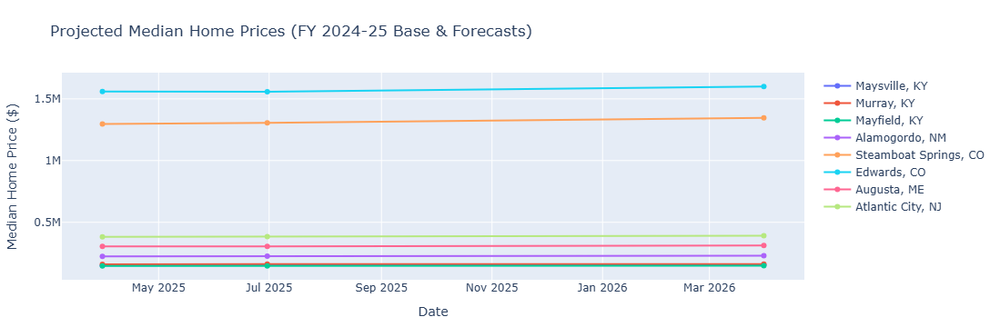

In [40]:
import plotly.graph_objects as go
from datetime import datetime

dates = [
    datetime(2025, 3, 31),
    datetime(2025, 6, 30),
    datetime(2026, 3, 31)
]

fig = go.Figure()

for city, row in proj_selected.iterrows():
    fig.add_trace(go.Scatter(
        x=dates,
        y=[row['2024-25'], row['Price_Jun_2025'], row['Price_Mar_2026']],
        mode='lines+markers',
        name=city
    ))

fig.update_layout(
    title="Projected Median Home Prices (FY 2024-25 Base & Forecasts)",
    xaxis_title="Date",
    yaxis_title="Median Home Price ($)",
    hovermode="x unified",
    legend=dict(orientation="v", x=1.02, y=1),
    margin=dict(l=50, r=200, t=80, b=50)
)

fig.show()

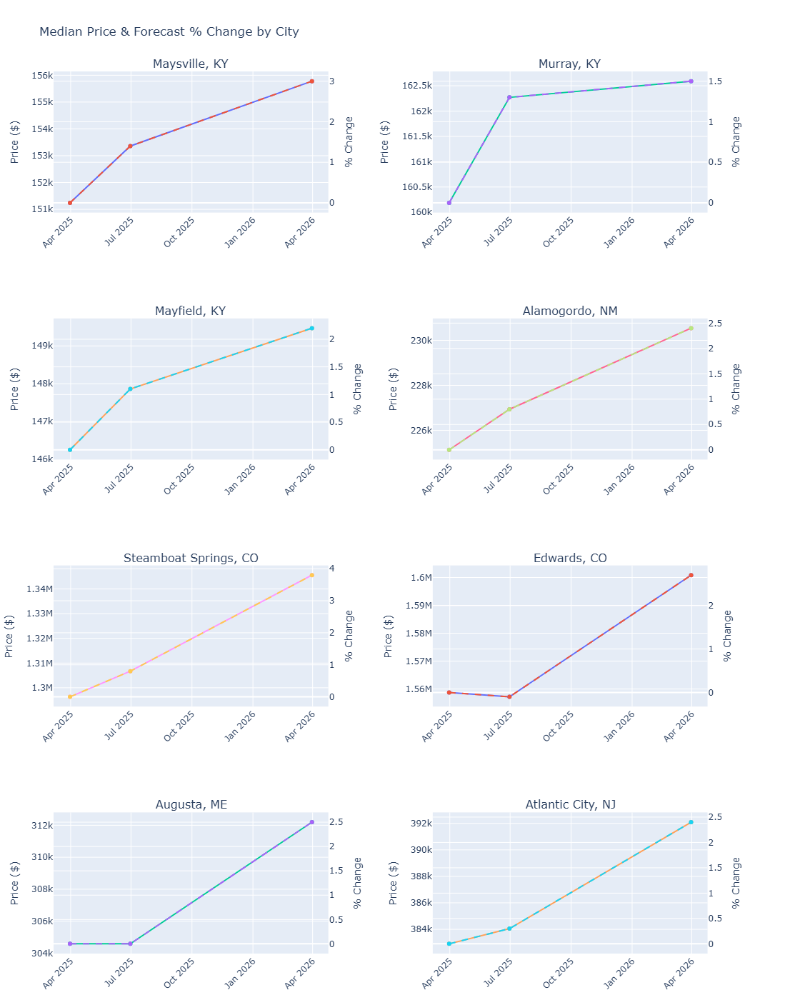

In [41]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

short_top5 = forecast.nlargest(5, '6/30/25')['RegionName'].tolist()
long_top5  = forecast.nlargest(5, '3/31/26')['RegionName'].tolist()
cities = list(dict.fromkeys(short_top5 + long_top5))

date_cols = [c for c in metro.columns if c[:4].isdigit() and c[4]=='-' and c[7]=='-']
df_long = metro.melt(id_vars=['RegionName'], value_vars=date_cols,
                     var_name='Date', value_name='Price')
df_long['Date'] = pd.to_datetime(df_long['Date'])
df_long['FiscalYear'] = df_long['Date'].apply(lambda d: f"{d.year - (d.month<4)}-{str(d.year + (d.month>=4))[2:]}")
df_2025 = df_long[df_long['FiscalYear']=='2024-25']
median_2025 = df_2025.groupby('RegionName')['Price'].median().to_frame('2024-25')

proj = (median_2025.reset_index()
        .merge(forecast[['RegionName','6/30/25','3/31/26']], on='RegionName')
        .set_index('RegionName'))
proj['Price_Jun_2025'] = (proj['2024-25'] * (1+proj['6/30/25']/100)).round(2)
proj['Price_Mar_2026'] = (proj['2024-25'] * (1+proj['3/31/26']/100)).round(2)

fig = make_subplots(
    rows=4, cols=2,
    subplot_titles=cities,
    specs=[[{"secondary_y": True}]*2 for _ in range(4)],
    vertical_spacing=0.12,
    horizontal_spacing=0.15
)

dates = [datetime(2025,3,31), datetime(2025,6,30), datetime(2026,3,31)]
marker_kwargs = dict(size=6)

for idx, city in enumerate(cities):
    r, c = divmod(idx, 2)
    row, col = r+1, c+1
    base, jun, mar = proj.loc[city, ['2024-25','Price_Jun_2025','Price_Mar_2026']]
    pct_short, pct_long = proj.loc[city, ['6/30/25','3/31/26']]
    prices = [base, jun, mar]
    pcts   = [0, pct_short, pct_long]

    fig.add_trace(
        go.Scatter(x=dates, y=prices, mode='lines+markers',
                   name='Price', marker=marker_kwargs, legendgroup=city),
        row=row, col=col, secondary_y=False
    )
    
    fig.add_trace(
        go.Scatter(x=dates, y=pcts, mode='lines+markers', 
                   name='% Change', line=dict(dash='dash'),
                   marker=marker_kwargs, legendgroup=city, showlegend=False),
        row=row, col=col, secondary_y=True
    )
    
    fig.update_xaxes(row=row, col=col, tickangle=-45, automargin=True)
    fig.update_yaxes(title_text="Price ($)", row=row, col=col, secondary_y=False, automargin=True)
    fig.update_yaxes(title_text="% Change", row=row, col=col, secondary_y=True, automargin=True)

fig.update_layout(
    height=1400, width=1000,
    margin=dict(l=50, r=50, t=100, b=50),
    title_text="Median Price & Forecast % Change by City",
    showlegend=False
)

fig.show()

## **Conclusion**

After analyzing the data, we recommend the following investment strategies:

We highly recommend to **invest right now** and as far as where to invest is concenrned, we propose the following places to invest

If you are looking for **long-term investment with high appreciation** or to **flip for immediate high returns**, invest in **Steamboat Springs, CO**. Although the short-term returns are lower (0.8%), the long-term returns **(3.8%)** make it a valuable investment. The projected value after one year is $1,345,590.87.

If you are looking for **short-term investment with high appreciation** or to **flip for immediate high returns**, invest in **Maysville, KY**. Although the long-term returns are lower (3.0%) than Steamboat Springs, CO, the short-term returns **(1.4%)** make it a valuable investment.

If you are looking for **regular cash flow** that can be reinvested, choose **Atlantic City, NJ**. The rental property not only provides cash flow but also appreciates over time if sold. This dual benefit makes it suitable for those seeking consistent income along with potential value gain.

# ********************************************************************

# 4) How long some of the real-estate stays on the market before they rent or sell? (by Syed Hassan Ahmed)

* Step 1: Import Required Libraries

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set seaborn style
sns.set(style="whitegrid")

 * Step 2: Load the Datasets

In [44]:
# Load data
pending_df = pd.read_csv("./datasets/Q4_Metro_med_doz_pending_uc_sfrcondo_month.csv")
close_df = pd.read_csv("./datasets/Q4_Metro_median_days_to_close_uc_sfrcondo_month.csv")
above_list_df = pd.read_csv("./datasets/Q4_Metro_pct_sold_above_list_uc_sfrcondo_month.csv")

* Step 3: Clean and Reshape Data

In [45]:
# Step 1: Identify actual date columns separately
pending_date_cols = pending_df.columns[5:]  # assuming first 5 columns are metadata
close_date_cols = close_df.columns[5:]

# Step 2: Melt datasets using their respective date columns
pending_long = pending_df.melt(
    id_vars=["RegionName", "RegionType", "StateName", "SizeRank"],
    value_vars=pending_date_cols,
    var_name="Date",
    value_name="DaysPending"
)

close_long = close_df.melt(
    id_vars=["RegionName", "RegionType", "StateName", "SizeRank"],
    value_vars=close_date_cols,
    var_name="Date",
    value_name="DaysToClose"
)

# Step 3: Convert to datetime safely (all dates are like '2020-01')
pending_long["Date"] = pd.to_datetime(pending_long["Date"])
close_long["Date"] = pd.to_datetime(close_long["Date"])

# Step 4: Merge on shared keys
merged_df = pd.merge(
    pending_long,
    close_long,
    on=["RegionName", "RegionType", "StateName", "SizeRank", "Date"],
    how="inner"
)

# Step 5: Drop missing values
merged_df.dropna(subset=["DaysPending", "DaysToClose"], inplace=True)

# Step 6: Remove outliers (1st to 99th percentile)
for col in ["DaysPending", "DaysToClose"]:
    q_low = merged_df[col].quantile(0.01)
    q_high = merged_df[col].quantile(0.99)
    merged_df = merged_df[(merged_df[col] >= q_low) & (merged_df[col] <= q_high)]

# Check shape
print("Final merged and cleaned data shape:", merged_df.shape)
merged_df.head()

Final merged and cleaned data shape: (34178, 7)


,RegionName,RegionType,StateName,SizeRank,Date,DaysPending,DaysToClose
0,United States,country,NaN,0,2018-01-31,47.0,35.0
1,"New York, NY",msa,NY,1,2018-01-31,86.0,61.0
2,"Los Angeles, CA",msa,CA,2,2018-01-31,21.0,35.0
3,"Chicago, IL",msa,IL,3,2018-01-31,57.0,42.0
4,"Dallas, TX",msa,TX,4,2018-01-31,37.0,20.0


# Visual: Pending Listings Over Time - Top 5 States
**Trend Analysis Over Time:**

The plot shows how the average number of days listings remained pending evolved over time for the top 5 states with the most data.

If the line for a state rises, it means homes are taking longer to go under contract, possibly due to reduced demand or market hesitation.

A downward slope indicates quicker pending times, often due to strong buyer demand or competitive markets.

**State Comparisons:**

You can clearly compare which states have consistently longer or shorter pending durations.

A state with fluctuating lines may reflect seasonal trends, policy changes, or market instability.

**Market Efficiency:**

States with consistently low days pending are likely to have hotter housing markets where listings move quickly.

Conversely, higher values suggest slow-moving markets, perhaps due to affordability, supply issues, or economic factors.

**COVID or Economic Trend Visibility (if applicable):**

If the date range spans 2020–2022, you may notice spikes or dips corresponding to pandemic effects, stimulus packages, or interest rate changes.

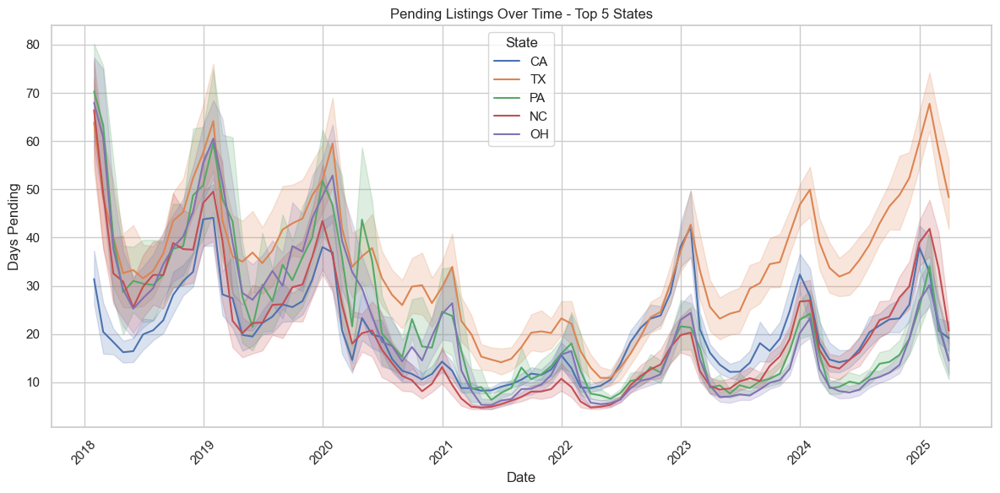

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get top 5 states with most data
top_states = pending_long['StateName'].value_counts().head(5).index
top_pending = pending_long[pending_long['StateName'].isin(top_states)]

plt.figure(figsize=(12, 6))
sns.lineplot(data=top_pending, x="Date", y="DaysPending", hue="StateName")
plt.title("Pending Listings Over Time - Top 5 States")
plt.xlabel("Date")
plt.ylabel("Days Pending")
plt.legend(title="State")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Days to Close Over Time - Top 5 States
**Closing Time Trends:**

This visual shows how long it takes on average for home transactions to close over time across the top 5 states with the most data.

A rising line indicates longer closing durations, possibly due to stricter lending conditions, paperwork delays, or inspection backlog.

A declining line suggests faster closing processes, which may reflect a strong housing market or streamlined transaction procedures.

**Inter-State Comparison:**

You can directly compare which states consistently have faster or slower closing times.

This can indicate differences in regulations, buyer/seller behavior, or real estate practices.

**Market Activity Signals:**

A state with consistently lower days to close may have a more efficient and competitive market.

States with more variability in their lines may experience seasonal market cycles, economic uncertainty, or inconsistent buyer demand.

**Time-Based Shifts:**

If the timeline spans significant events (e.g., 2020–2022), you might see clear spikes or drops reflecting economic shifts like interest rate hikes, government policies, or pandemic disruptions.

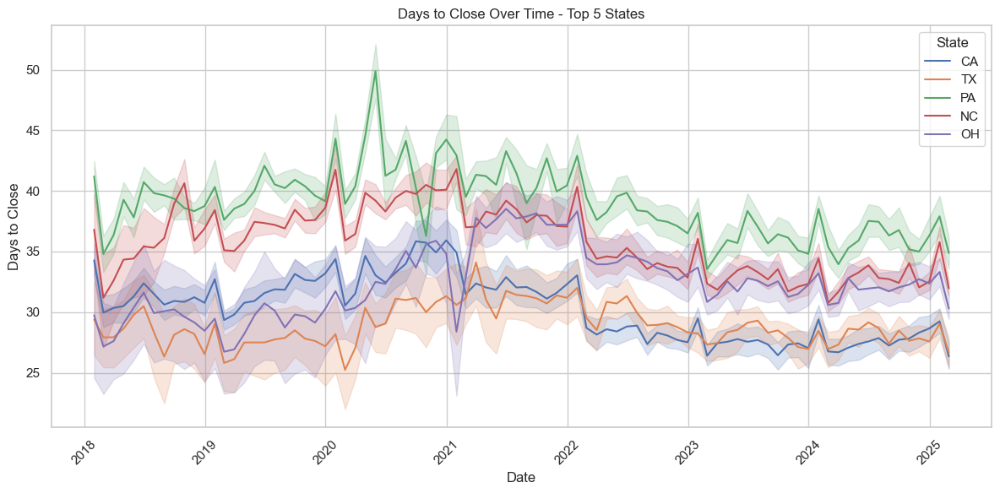

In [47]:
top_close = close_long[close_long['StateName'].isin(top_states)]

plt.figure(figsize=(12, 6))
sns.lineplot(data=top_close, x="Date", y="DaysToClose", hue="StateName")
plt.title("Days to Close Over Time - Top 5 States")
plt.xlabel("Date")
plt.ylabel("Days to Close")
plt.legend(title="State")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Distribution of Days Pending Across Top 10 States

**Distribution & Spread:**

The box plot displays the spread of pending days (i.e., how long listings stay in "pending" status) for the top 10 states.

A longer box means higher variability, indicating inconsistent pending durations within that state.

Shorter boxes suggest more consistency in how long listings stay pending.

**Median Comparison:**

The horizontal line inside each box represents the median pending time.

You can compare which states generally have faster or slower pending durations by looking at where these medians fall.

**Outliers:**

Points outside the whiskers are outliers, representing listings that stayed pending unusually short or long.

A large number of outliers may indicate market anomalies, such as rare property types or listing errors.

**State Rankings:**

Visually, this plot makes it easy to rank states by typical pending durations.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1039152678.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




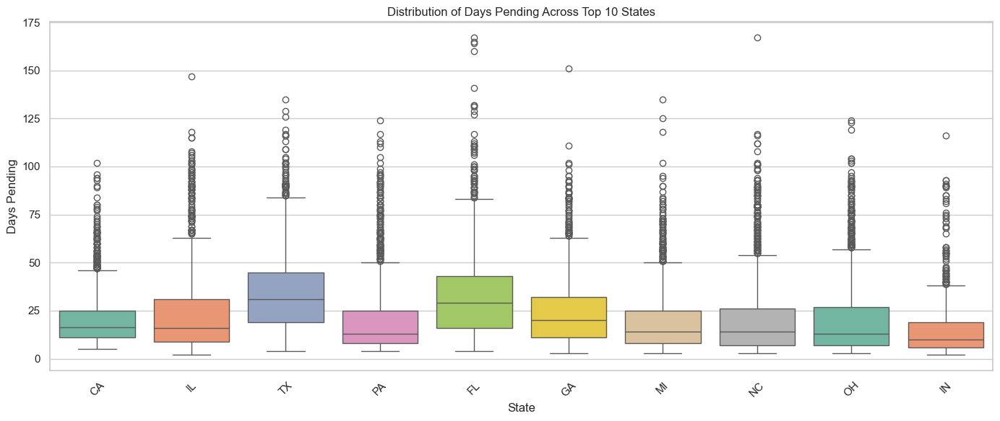

In [48]:
plt.figure(figsize=(14, 6))
top_10_states = pending_long['StateName'].value_counts().head(10).index
sns.boxplot(data=pending_long[pending_long['StateName'].isin(top_10_states)],
            x="StateName", y="DaysPending", palette="Set2")
plt.title("Distribution of Days Pending Across Top 10 States")
plt.xlabel("State")
plt.ylabel("Days Pending")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Average Days Pending (Top 10 States)
**Ranking of States:**

This bar chart shows the top 10 states with the highest average number of days listings remain in pending status.

States at the top of the list have slower transaction progress, indicating longer pending periods.

**Market Efficiency:**

States with lower bars among the top 10 are relatively more efficient in converting pending listings to closed deals.

Those with taller bars might face slower buyer or seller action, more complex paperwork, or higher buyer indecision.

**Decision-Making Insight:**

For real estate professionals, this chart helps identify states where sales processes may be dragging.

Buyers and investors might use this data to estimate how fast a deal can typically progress in a specific state.

**Regional Comparison:**

You can see clear differences in market pace by geography, which could relate to population density, urban vs rural dynamics, or economic factors.



/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1743592015.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




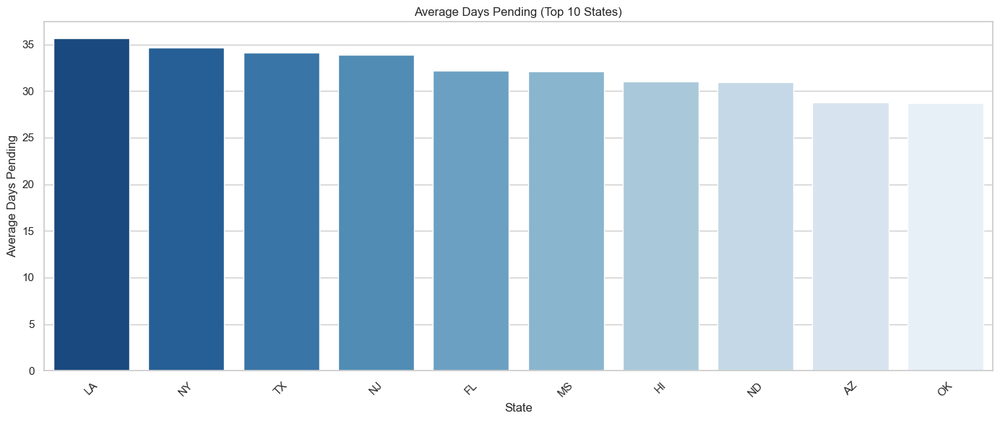

In [49]:
plt.figure(figsize=(14, 6))
avg_days_pending = pending_long.groupby("StateName")["DaysPending"].mean().sort_values(ascending=False).head(10)
sns.barplot(x=avg_days_pending.index, y=avg_days_pending.values, palette="Blues_r")
plt.title("Average Days Pending (Top 10 States)")
plt.xlabel("State")
plt.ylabel("Average Days Pending")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Average Time in Market (Top 10 States)
**Ranking of States:**
  
The states with the highest AvgDaysPending are ranked from the most delayed to the least delayed in terms of days pending before an offer is made.

**Market Efficiency:**

States with a smaller gap between AvgDaysPending and AvgDaysToClose indicate higher efficiency in processing offers and closing deals.

**Decision-Making Insight:**

A larger AvgDaysPending compared to AvgDaysToClose suggests slower decision-making in some states, while similar values suggest more streamlined processes.

**Regional Comparison:**

States with higher pending and closing days may face bureaucratic hurdles or slower market conditions, while states with lower days indicate faster processes.

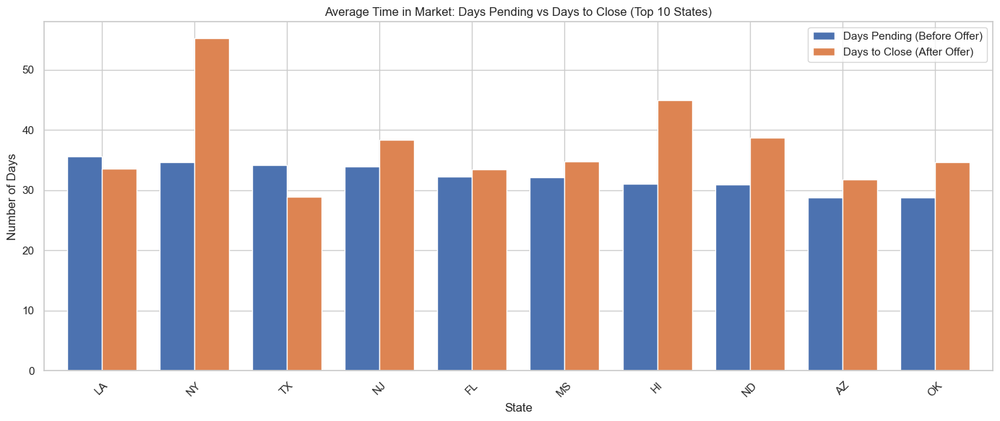

In [50]:
avg_pending = pending_long.groupby("StateName")["DaysPending"].mean()
avg_closing = close_long.groupby("StateName")["DaysToClose"].mean()

# Combine into one DataFrame
avg_df = pd.DataFrame({
    "AvgDaysPending": avg_pending,
    "AvgDaysToClose": avg_closing
}).dropna()

# Take top 10 states by DaysPending
top_states = avg_df.sort_values("AvgDaysPending", ascending=False).head(10)

# Plotting
top_states.plot(kind="bar", figsize=(14, 6), width=0.75)
plt.title("Average Time in Market: Days Pending vs Days to Close (Top 10 States)")
plt.ylabel("Number of Days")
plt.xlabel("State")
plt.xticks(rotation=45)
plt.legend(["Days Pending (Before Offer)", "Days to Close (After Offer)"])
plt.tight_layout()
plt.show()

# Rental Market (MSA): Average Days Pending vs Days to Close (Top 10 MSAs)
**Ranking of MSAs:**

The MSAs with the highest AvgDaysPending are ranked from the most delayed to the least delayed in terms of days pending before a lease is finalized.

**Market Efficiency:**

A smaller difference between AvgDaysPending and AvgDaysToClose indicates higher efficiency in processing lease offers and finalizing them.

**Decision-Making Insight:**

MSAs with a higher AvgDaysPending compared to AvgDaysToClose indicate slower decision-making in leasing processes, while those with similar values suggest more efficient decision-making.

**Regional Comparison:**

MSAs with longer pending and closing days could indicate slower or more complex leasing processes, while those with shorter durations suggest quicker, more streamlined leasing.

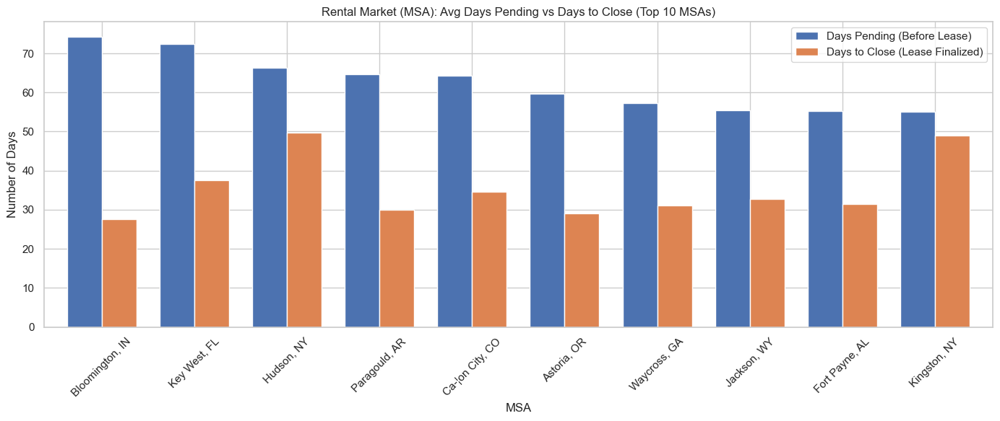

In [51]:
# Filter for MSA level (since 'City' is not present)
pending_rent = pending_long[pending_long["RegionType"] == "msa"]
close_rent = close_long[close_long["RegionType"] == "msa"]

# Group and calculate mean
avg_pending_rent = pending_rent.groupby("RegionName")["DaysPending"].mean()
avg_close_rent = close_rent.groupby("RegionName")["DaysToClose"].mean()

# Combine into one DataFrame
avg_rent_df = pd.DataFrame({
    "AvgDaysPending": avg_pending_rent,
    "AvgDaysToClose": avg_close_rent
}).dropna()

# Sort by AvgDaysPending and pick top 10
top_rent_msas = avg_rent_df.sort_values("AvgDaysPending", ascending=False).head(10)

# Plotting
top_rent_msas.plot(kind="bar", figsize=(14, 6), width=0.75)
plt.title("Rental Market (MSA): Avg Days Pending vs Days to Close (Top 10 MSAs)")
plt.ylabel("Number of Days")
plt.xlabel("MSA")
plt.xticks(rotation=45)
plt.legend(["Days Pending (Before Lease)", "Days to Close (Lease Finalized)"])
plt.tight_layout()
plt.show()

# Conclusion
**1. Balance Between Fast-Turnover and Long-Term Opportunities**
Short Market Duration States (e.g., Indiana - IN):

These offer quick turnaround opportunities.
Ideal for fix-and-flip or short-term rental models, reducing holding costs and risk.

**Action:** Allocate a portion (~20-30%) of your investment in these high-efficiency markets to maintain liquidity.

Longer Duration Markets (e.g., NY, LA, HI):
These markets often carry higher property values and long-term appreciation potential, despite slower sales/rental cycles.

**Action:** Target high-quality residential or commercial units with stable demand for buy-and-hold strategies.

**2. Avoid Overheating or Declining Markets**

Texas (TX), while previously high-performing, is showing signs of cooling in early 2025.

**Action:** Monitor TX closely. If investing, negotiate aggressively and focus on value-add properties to buffer against declining activity.

**3. Be Cautious with Markets Showing High Lag Between Pending and Closing**

Cities like Bloomington, Key West, and Hudson show long pending-to-closing delays.
These could indicate regulatory, logistical, or demand-side inefficiencies.

**Action:** Avoid or proceed cautiously in these areas unless deeply familiar with the local landscape and prepared for longer holding periods.

**4. Diversify Across Geographies and Property Types**

Spread investments across multiple states (e.g., IN, FL, LA) and mixed-use or residential-commercial assets to mitigate regional slowdowns.

**Action:** Build a balanced portfolio—some fast-yielding properties (IN), some high-return but slower-maturing ones (NY/HI).

**5. Factor in Closing Delays When Planning ROI**

In states like NY and HI, even though the average pending time is moderate, closing can extend over 50 days.

**Action:** Budget for extended capital lock-in periods and ensure cash flow is maintained during these lags.

# ***********************************************************************************

# ***Question 5***

## Approach 1
# Q5) How much average profit I could expect from my investments in terms of sale (% dollars) after paying mortgage. Calculate my ~ROI. 
# - Keertana

## Methodology: Resale ROI Estimation (10-Year Hold)

- Used Zillow Home Value Index (ZHVI) to extract the latest home price and calculate year-over-year (YoY) growth.
- Assumed YoY growth as a proxy for compound annual growth rate (CAGR) to forecast home value after 10 years.
- Calculated future resale value using:  
  `AppreciatedValue = LatestZHVI × (1 + YoY Growth)^10`
- Assumed a 20% down payment and calculated the loan amount accordingly.
- Estimated total interest paid over a 20-year mortgage term.
- Included 3% closing costs in the total purchase cost.
- Computed total investment as:  
  `Down Payment + (Monthly Payment × 12 × 10 years)`
- Calculated net profit from resale as:  
  `Appreciated Value − (Purchase Cost + Total Interest)`
- ROI (%) was computed as:  
  `(Net Profit / Total Investment) × 100`
- Ranked and displayed the **top 10 metro areas** by highest projected resale ROI.


In [52]:
#get forcaste value
zhvi_df = pd.read_csv('./datasets/Metro_zhvi_sfrcondomfr.csv')
monthly_payment_df = pd.read_csv('./datasets/Metro_total_monthly_payment_downpayment_0.20_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv')

# Get the most recent date column for the total monthly payment
latest_col = monthly_payment_df.columns[-1]  # Last column as the latest payment data
monthly_payment_df = monthly_payment_df[['RegionName', 'StateName', latest_col]]
monthly_payment_df.rename(columns={latest_col: 'TotalMonthlyPayment'}, inplace=True)

# Extract date columns dynamically
date_cols = zhvi_df.columns[zhvi_df.columns.str.match(r'\d{4}-\d{2}-\d{2}')]

# Identify the latest and previous year month columns
latest_col = date_cols[-1]  # Most recent month
prev_year_col = date_cols[-13]  # 12 months before the latest month

# Extract latest value and calculate YoY growth
zhvi_df['LatestZHVI'] = zhvi_df[latest_col]
zhvi_df['PreviousYearZHVI'] = zhvi_df[prev_year_col]

# Calculate YoY Growth
zhvi_df['ZHVI_YoY'] = ((zhvi_df['LatestZHVI'] - zhvi_df['PreviousYearZHVI']) / zhvi_df['PreviousYearZHVI']) * 100

# Extract relevant columns from ZHVI data for CAGR calculation
zhvi_df = zhvi_df[['RegionName', 'StateName', 'ZHVI_YoY', 'LatestZHVI']]

# -----------------------------
# 2. Merge the DataFrames on RegionName and StateName
# -----------------------------
merged_df = pd.merge(monthly_payment_df, zhvi_df, on=['RegionName', 'StateName'])

# Constants
down_payment_pct = 0.20
years = 10  # Example hold period

# Calculate down payment and loan amount
merged_df['DownPayment'] = merged_df['LatestZHVI'] * down_payment_pct
merged_df['LoanAmount'] = merged_df['LatestZHVI'] - merged_df['DownPayment']

# Calculate appreciated value using CAGR (assume CAGR from ZHVI data)
merged_df['AppreciatedValue'] = merged_df['LatestZHVI'] * (1 + merged_df['ZHVI_YoY'] / 100) ** years

# Calculate total interest paid over the loan term (20 years)
merged_df['TotalInterest'] = (merged_df['TotalMonthlyPayment'] * 12 * 20) - merged_df['LoanAmount']

# Purchase cost includes initial value + 3% closing cost
merged_df['PurchaseCost'] = merged_df['LatestZHVI'] + (merged_df['LatestZHVI'] * 0.03)

# Calculate net profit after selling the property
merged_df['NetProfit'] = merged_df['AppreciatedValue'] - (merged_df['PurchaseCost'] + merged_df['TotalInterest'])

# Total investment: down payment + total monthly payments over the hold period
merged_df['TotalInvestment'] = merged_df['DownPayment'] + (merged_df['TotalMonthlyPayment'] * 12 * years)

# Calculate ROI
merged_df['ROI'] = (merged_df['NetProfit'] / merged_df['TotalInvestment']) * 100
top_roi = merged_df.sort_values(by='ROI', ascending=False).head(10)

#print("Top 10 Markets by ROI:")
#print(top_roi[['RegionName', 'StateName', 'ROI', 'NetProfit', 'AppreciatedValue', 'TotalInvestment']])


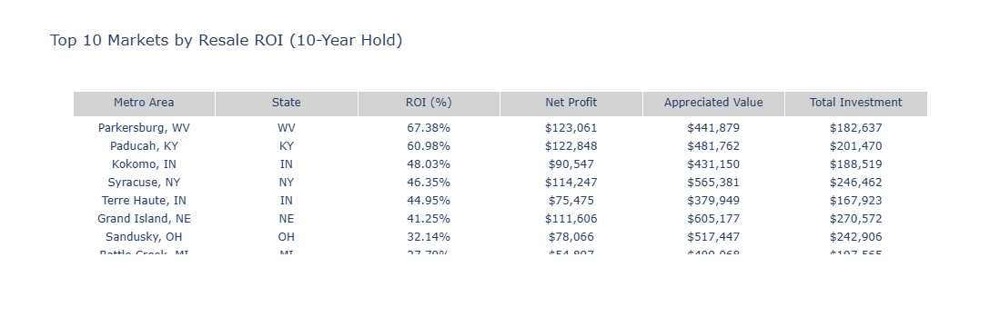

In [53]:
fig_table = go.Figure(data=[go.Table(
    header=dict(
        values=['Metro Area', 'State', 'ROI (%)', 'Net Profit', 'Appreciated Value', 'Total Investment'],
        fill_color='lightgrey',
        align='center'
    ),
    cells=dict(
        values=[
            top_roi['RegionName'],
            top_roi['StateName'],
            top_roi['ROI'].map('{:.2f}%'.format),
            top_roi['NetProfit'].map('${:,.0f}'.format),
            top_roi['AppreciatedValue'].map('${:,.0f}'.format),
            top_roi['TotalInvestment'].map('${:,.0f}'.format),
        ],
        fill_color='white',
        align='center'
    )
)])
fig_table.update_layout(title="Top 10 Markets by Resale ROI (10-Year Hold)", height=450)
fig_table.show()

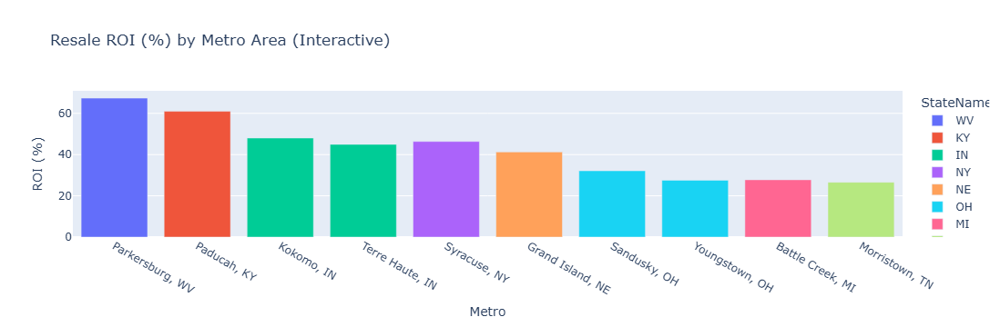

In [54]:
fig = px.bar(
    top_roi.sort_values('ROI', ascending=False),
    x='RegionName',
    y='ROI',
    color='StateName',
    hover_data=['NetProfit', 'TotalInvestment', 'AppreciatedValue'],
    title='Resale ROI (%) by Metro Area (Interactive)',
    labels={'ROI': 'ROI (%)', 'RegionName': 'Metro'},
    height=500
)
fig.show()


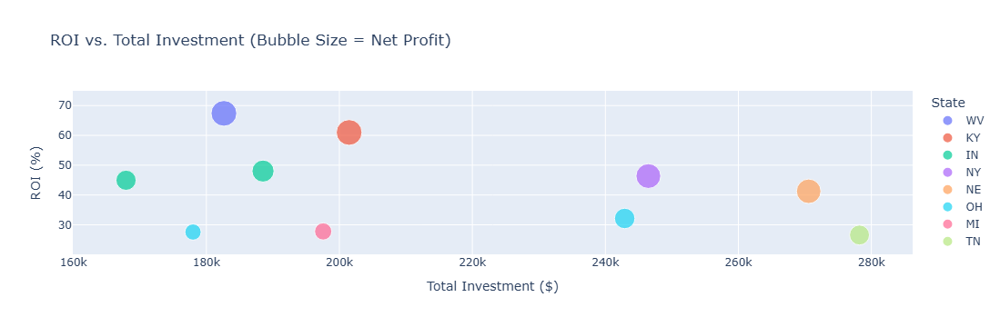

In [55]:
fig_scatter = px.scatter(
    top_roi,
    x='TotalInvestment',
    y='ROI',
    color='StateName',
    size='NetProfit',
    hover_name='RegionName',
    labels={
        'TotalInvestment': 'Total Investment ($)',
        'ROI': 'ROI (%)',
        'StateName': 'State',
        'NetProfit': 'Net Profit ($)'
    },
    title='ROI vs. Total Investment (Bubble Size = Net Profit)',
    height=500
)
fig_scatter.show()

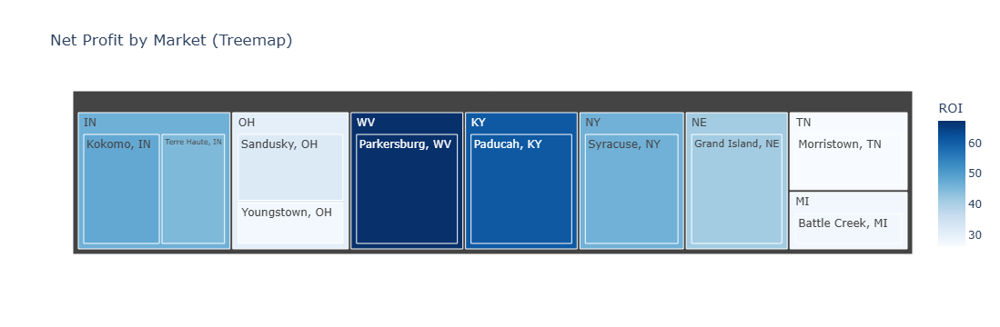

In [56]:
fig = px.treemap(
    top_roi,
    path=['StateName', 'RegionName'],
    values='NetProfit',
    color='ROI',
    color_continuous_scale='Blues',
    title='Net Profit by Market (Treemap)'
)
fig.show()


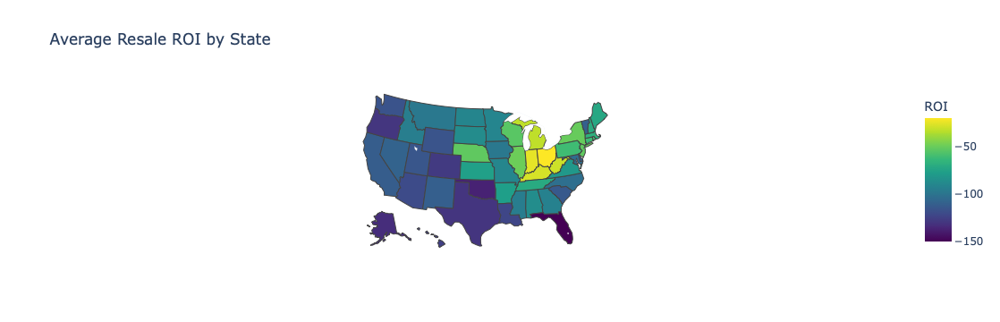

In [57]:
state_agg = merged_df.groupby('StateName', as_index=False)['ROI'].mean()
fig = px.choropleth(
    state_agg,
    locations='StateName',
    locationmode='USA-states',
    color='ROI',
    color_continuous_scale='Viridis',
    scope='usa',
    title='Average Resale ROI by State'
)
fig.show()


### Resale ROI Insights – Top 10 U.S. Metro Markets (10-Year Hold)

This analysis highlights the most profitable metros for long-term real estate investment based on projected home appreciation, total ownership costs, and capital invested.


#### 1. **Parkersburg, WV**
- **ROI:** ~67.4%
- **Net Profit:** ~\$123K  
- Profit on a ~\$183K total investment
- Low acquisition cost and consistent growth fuel high returns


#### 2. **Paducah, KY**
- **ROI:** ~61.0%
- **Net Profit:** ~$123K  
- Total Investment: ~\$201K
- Strong appreciation potential with manageable entry costs


#### Solid Performers (Rank 3–6)
- **Kokomo, IN**, **Syracuse, NY**, **Terre Haute, IN**, and **Grand Island, NE**
- ROI ranges from **41–48%**
- All deliver $75K–$114K in net profit over 10 years with investments under $270K


#### Mid-Tier Opportunities (Rank 7–10)
- **Sandusky, OH**, **Battle Creek, MI**, **Youngstown, OH**, and **Morristown, TN**
- ROIs range from **26–32%**
- Still generate healthy returns, but relative profits taper due to rising costs or slower appreciation


#### Overall Trend
- **Affordable mid-sized markets** dominate the top rankings
- High ROI stems from:
  - Modest home prices  
  - Reasonable financing costs  
  - Strong projected growth rates
- Suggests that **low-barrier metros** with positive price momentum offer the best resale ROI for long-term investors


# ***********************************************************************************

## **Approach 2**
## **Manoj Ravi Kumar**

## **Objective**

We were asked to estimate the **return on investment (ROI)** from real estate purchases over a 20-year period by answering:

> **"How much average profit could I expect after paying the mortgage?"**

### **Our goal was to compute:**
- **Net rental income** across 20 years  
- **Appreciated resale value** using home value CAGR  
- Combine both to determine **total profit**  
- Express this profit as **ROI over initial cash investment**

---

## **Approach and Methodology**

To answer this, we performed a multi-step investment simulation:

### **City and Rent Selection**
- Selected **Top 4 Cities** based on **Home Price CAGR** (2020–2025) using Zillow ZHVI data  
- Retrieved **2024–25 median rent** from ZORI for those cities  

### **Modeled Annual Expenses**
- **Property tax** and **insurance** (city-specific)
- **Maintenance:** 1% of property value  
- **Vacancy loss:** 5% of annual rent  

### **Financing Assumptions**
- **20% down payment**  
- **3% closing costs**  
- **5% repair costs**  
- **6.55% interest rate** on a **20-year mortgage**

### **Net Cash Flow Calculation**
- Calculated **annual net income** = Rent − (Expenses + Mortgage)  
- Amortized the **initial investment** over 20 years  
- Computed **adjusted annual ROI**

### **20-Year Forecasts**
- Simulated **rental income growth** using **state-level Rent CAGR**
- Estimated **home value appreciation** using **city-level Home Value CAGR**
- Final **Total Profit = Net Rental Income (20Y) + Projected Sale Value (20Y)**


In [58]:
import pandas as pd
import numpy as np
import re

# Load the datasets
zori_df = pd.read_csv("./datasets/zori_all_homes_metro.csv")
zhvi_df = pd.read_csv("./datasets/zhvi_all_homes_metro.csv")

# Assign financial year
def assign_financial_year(date):
    if date.month >= 4:
        start_year = date.year
    else:
        start_year = date.year - 1
    return f"{start_year}-{str(start_year + 1)[-2:]}"

# ─── ZHVI: Median Home Value & CAGR ───────────────────────────────────────────
zhvi_date_cols = [col for col in zhvi_df.columns if re.match(r'\d{4}-\d{2}-\d{2}', col)]
zhvi_long = zhvi_df.melt(id_vars=['RegionID', 'RegionName', 'StateName'], value_vars=zhvi_date_cols,
                         var_name='Date', value_name='HomeValue')
zhvi_long['Date'] = pd.to_datetime(zhvi_long['Date'])
zhvi_long['FinancialYear'] = zhvi_long['Date'].apply(assign_financial_year)

# Filter for financial years 2020-21 to 2024-25
target_years = ['2020-21', '2021-22', '2022-23', '2023-24', '2024-25']
zhvi_filtered = zhvi_long[zhvi_long['FinancialYear'].isin(target_years)]

# Calculate median home value per year
zhvi_median_yearly = zhvi_filtered.groupby(['RegionName', 'StateName', 'FinancialYear'])['HomeValue'].median().reset_index().round(2)

# Pivot to wide format
zhvi_pivot = zhvi_median_yearly.pivot_table(index=['RegionName', 'StateName'], columns='FinancialYear', values='HomeValue').reset_index()
zhvi_pivot = zhvi_pivot.dropna(subset=['2020-21', '2024-25'])

# Calculate CAGR
zhvi_pivot['CAGR (%)'] = ((zhvi_pivot['2024-25'] / zhvi_pivot['2020-21']) ** (1/4) - 1) * 100
zhvi_pivot['Median_HomeValue'] = zhvi_filtered[zhvi_filtered['FinancialYear'] == '2024-25']\
                                    .groupby(['RegionName', 'StateName'])['HomeValue'].median().values

# Select top 5 cities by CAGR
top5_cagr_home = zhvi_pivot.sort_values(by='CAGR (%)', ascending=False).head(5)

# ─── ZORI: Median Rent for Top Cities ─────────────────────────────────────────
zori_date_cols = [col for col in zori_df.columns if re.match(r'\d{4}-\d{2}-\d{2}', col)]
zori_long = zori_df.melt(id_vars=['RegionName', 'StateName'], value_vars=zori_date_cols,
                         var_name='Date', value_name='Rent')
zori_long['Date'] = pd.to_datetime(zori_long['Date'])
zori_long['FinancialYear'] = zori_long['Date'].apply(assign_financial_year)
zori_filtered = zori_long[zori_long['FinancialYear'] == '2024-25']

# Calculate median rent for FY 2024-25 for those 5 cities
top5_city_list = top5_cagr_home[['RegionName', 'StateName']]
zori_top5 = zori_filtered.merge(top5_city_list, on=['RegionName', 'StateName'], how='inner')
zori_median_rent = zori_top5.groupby(['RegionName', 'StateName'])['Rent'].median().reset_index().round(2)
zori_median_rent.rename(columns={'Rent': 'Median_Rent'}, inplace=True)

# Merge rent into home value CAGR data
final_top5 = pd.merge(top5_cagr_home, zori_median_rent, on=['RegionName', 'StateName'], how='left')

# Remove cities with missing rent (like Thomaston, GA)
top4_final = final_top5.dropna(subset=['Median_Rent']).reset_index(drop=True).round(2)

# Step 1: Calculate Annual Rental Income
top4_final['Annual_Rent_Income'] = (top4_final['Median_Rent'] * 12).round(2)

# Define city-specific property tax and insurance values
tax_rates = {
    "Edwards, CO": 0.0042,
    "Steamboat Springs, CO": 0.0038,
    "Jackson, WY": 0.0053,
    "Kalispell, MT": 0.0075
}

insurance_costs = {
    "Edwards, CO": 1224,
    "Steamboat Springs, CO": 1668,
    "Jackson, WY": 1555,
    "Kalispell, MT": 1745
}

# Assign tax and insurance based on city
def get_tax_rate(row):
    return tax_rates.get(row['RegionName'], 0.012)  # default fallback

def get_insurance_cost(row):
    return insurance_costs.get(row['RegionName'], 1000)  # default fallback

top4_final['Property_Tax'] = top4_final.apply(lambda row: row['Median_HomeValue'] * get_tax_rate(row), axis=1).round(2)
top4_final['Insurance'] = top4_final.apply(get_insurance_cost, axis=1)
top4_final['Maintenance'] = (top4_final['Median_HomeValue'] * 0.01).round(2)
top4_final['Vacancy_Loss'] = (top4_final['Annual_Rent_Income'] * 0.05).round(2)

# Total annual expenses
top4_final['Annual_Expenses'] = top4_final[['Property_Tax', 'Insurance', 'Maintenance', 'Vacancy_Loss']].sum(axis=1).round(2)

# Select only required columns
final_display = top4_final[['RegionName', 'StateName', 'CAGR (%)', 'Median_HomeValue',
                            'Median_Rent', 'Annual_Rent_Income', 'Annual_Expenses']].copy()

final_display.reset_index(drop=True, inplace=True)

display(final_display)

,RegionName,StateName,CAGR (%),Median_HomeValue,Median_Rent,Annual_Rent_Income,Annual_Expenses
0,"Edwards, CO",CO,15.69,1335634.67,3589.63,43075.56,22343.80
1,"Steamboat Springs, CO",CO,15.25,1101764.88,2965.27,35583.24,18651.52
2,"Jackson, WY",WY,14.80,1448402.31,4752.73,57032.76,26567.19
3,"Kalispell, MT",MT,14.45,636053.65,2206.43,26477.16,14199.80


In [59]:
# Loan assumptions
interest_rate = 0.0655  # annual
loan_term_months = 20 * 12  # 20 years
down_payment_pct = 0.20

# Step 1: Calculate Loan Amount
top4_final['Loan_Amount'] = (top4_final['Median_HomeValue'] * (1 - down_payment_pct)).round(2)

# Step 2: Calculate Monthly Mortgage Payment using Amortization Formula
def calculate_annual_mortgage_payment(loan_amount, annual_rate, months):
    r = annual_rate / 12
    return loan_amount * (r * (1 + r)**months) / ((1 + r)**months - 1) * 12

top4_final['Annual_Mortgage_Payment'] = top4_final['Loan_Amount'].apply(
    lambda x: calculate_annual_mortgage_payment(x, interest_rate, loan_term_months)).round(2)

# Prepare display with essential columns
mortgage_display = top4_final[['RegionName', 'StateName', 'Median_HomeValue', 'Loan_Amount', 'Annual_Mortgage_Payment']]

display(mortgage_display)

,RegionName,StateName,Median_HomeValue,Loan_Amount,Annual_Mortgage_Payment
0,"Edwards, CO",CO,1335634.67,1068507.74,95975.89
1,"Steamboat Springs, CO",CO,1101764.88,881411.90,79170.50
2,"Jackson, WY",WY,1448402.31,1158721.85,104079.14
3,"Kalispell, MT",MT,636053.65,508842.92,45705.47


In [60]:
# Investment with 5% repair model
top4_final['Down_Payment'] = (top4_final['Median_HomeValue'] * 0.20).round(2)
top4_final['Closing_Costs'] = (top4_final['Median_HomeValue'] * 0.03).round(2)
top4_final['Repairs'] = (top4_final['Median_HomeValue'] * 0.05).round(2)
top4_final['Total_Cash_Invested'] = (top4_final['Down_Payment'] + top4_final['Closing_Costs'] + top4_final['Repairs']).round(2)

# Display
investment_display_updated = top4_final[['RegionName', 'StateName', 'Down_Payment', 'Closing_Costs', 'Repairs', 'Total_Cash_Invested']]

display(investment_display_updated)

,RegionName,StateName,Down_Payment,Closing_Costs,Repairs,Total_Cash_Invested
0,"Edwards, CO",CO,267126.93,40069.04,66781.73,373977.70
1,"Steamboat Springs, CO",CO,220352.98,33052.95,55088.24,308494.17
2,"Jackson, WY",WY,289680.46,43452.07,72420.12,405552.65
3,"Kalispell, MT",MT,127210.73,19081.61,31802.68,178095.02


In [61]:
# Recalculate Net_Annual_Cash_Flow before using it
top4_final['Net_Annual_Cash_Flow'] = (
    top4_final['Annual_Rent_Income'] -
    top4_final['Annual_Expenses'] -
    top4_final['Annual_Mortgage_Payment']
).round(2)

# Calculate adjusted cash flow with investment amortization
top4_final['Net_After_Investment'] = (
    top4_final['Net_Annual_Cash_Flow'] - (top4_final['Total_Cash_Invested'] / 20)
).round(2)

# Display final values
cashflow_adjusted = top4_final[['RegionName', 'StateName', 'Net_Annual_Cash_Flow', 'Net_After_Investment']]

display(cashflow_adjusted)

,RegionName,StateName,Net_Annual_Cash_Flow,Net_After_Investment
0,"Edwards, CO",CO,-75244.13,-93943.02
1,"Steamboat Springs, CO",CO,-62238.78,-77663.49
2,"Jackson, WY",WY,-73613.57,-93891.20
3,"Kalispell, MT",MT,-33428.11,-42332.86


In [62]:
# Calculate ROI as Net_After_Investment divided by Total_Cash_Invested (expressed as a percentage)
top4_final['Annual_ROI (%)'] = (
    (top4_final['Net_After_Investment'] / top4_final['Total_Cash_Invested']) * 100
).round(2)

# Display key ROI metrics
roi_display = top4_final[['RegionName', 'StateName', 'Total_Cash_Invested', 'Net_After_Investment', 'Annual_ROI (%)']]

display(roi_display)

,RegionName,StateName,Total_Cash_Invested,Net_After_Investment,Annual_ROI (%)
0,"Edwards, CO",CO,373977.70,-93943.02,-25.12
1,"Steamboat Springs, CO",CO,308494.17,-77663.49,-25.18
2,"Jackson, WY",WY,405552.65,-93891.20,-23.15
3,"Kalispell, MT",MT,178095.02,-42332.86,-23.77


In [63]:
# If we can't compute Rent CAGR for individual cities, compute average Rent CAGR per State

# Reuse zori_long which already has FinancialYear assigned
# Filter for financial years 2020-21 and 2024-25
zori_state_filtered = zori_long[zori_long['FinancialYear'].isin(['2020-21', '2024-25'])]

# Group by State and FinancialYear to get median rent
state_rent_by_year = zori_state_filtered.groupby(['StateName', 'FinancialYear'])['Rent'].median().unstack()

# Drop states missing either year
state_rent_by_year = state_rent_by_year.dropna()

# Calculate CAGR
state_rent_by_year['Rent_CAGR'] = ((state_rent_by_year['2024-25'] / state_rent_by_year['2020-21']) ** (1 / 4)) - 1
state_rent_by_year['Rent_CAGR'] = (state_rent_by_year['Rent_CAGR'] * 100).round(2)

# Merge into top4_final based on state
top4_final = top4_final.drop(columns=['Rent_CAGR'], errors='ignore')
top4_final = pd.merge(top4_final, state_rent_by_year['Rent_CAGR'].reset_index(), on='StateName', how='left')

# Show updated Rent CAGR per state

display(top4_final[['RegionName', 'StateName', 'Rent_CAGR']])

,RegionName,StateName,Rent_CAGR
0,"Edwards, CO",CO,6.35
1,"Steamboat Springs, CO",CO,6.35
2,"Jackson, WY",WY,5.10
3,"Kalispell, MT",MT,9.84


In [64]:
# Recalculate 20-year net income using updated Rent CAGR values
def projected_net_income_20y(row):
    total = 0
    base_rent = row['Median_Rent']
    rent_cagr = row['Rent_CAGR'] / 100 if not pd.isna(row['Rent_CAGR']) else 0.03
    annual_exp = row['Annual_Expenses']
    annual_mortgage = row['Annual_Mortgage_Payment']
    annual_investment = row['Total_Cash_Invested'] / 20
    for year in range(1, 21):
        rent = base_rent * ((1 + rent_cagr) ** year)
        rent_income = rent * 12
        net_cash = rent_income - annual_exp - annual_mortgage - annual_investment
        total += net_cash
    return round(total, 2)

top4_final['Net_Income_20Y'] = top4_final.apply(projected_net_income_20y, axis=1)

# Final display
net_income_display = top4_final[['RegionName', 'StateName', 'Net_Income_20Y']]

display(net_income_display)

,RegionName,StateName,Net_Income_20Y
0,"Edwards, CO",CO,-990393.55
1,"Steamboat Springs, CO",CO,-819337.92
2,"Jackson, WY",WY,-1015381.68
3,"Kalispell, MT",MT,259534.78


In [65]:
# Calculate 20-year appreciation of home value using existing CAGR
top4_final['Appreciated_Value'] = (
    top4_final['Median_HomeValue'] * ((1 + (top4_final['CAGR (%)'] / 100)) ** 20)
).round(2)

# Select relevant columns for final display
final_summary = top4_final.reset_index(drop=True)[
    ['RegionName', 'StateName', 'Rent_CAGR', 'Net_Income_20Y', 'Appreciated_Value']
]

# Rename columns for clarity
final_summary = final_summary.rename(columns={
    'RegionName': 'Region',
    'StateName': 'State',
    'Rent_CAGR': 'Rent CAGR (%)',
    'Net_Income_20Y': '20Y Net Income (After All Deductions)',
    'Appreciated_Value': 'Projected Sale Value (After 20Y)'
})

# Create final expected profit column by adding Net_Income_20Y to Appreciated_Value
top4_final['Expected_Profit_20Y'] = top4_final['Net_Income_20Y'] + top4_final['Appreciated_Value']

# Prepare display table again with the new column
final_summary = top4_final.reset_index(drop=True)[
    ['RegionName', 'StateName', 'Rent_CAGR', 'Net_Income_20Y', 'Appreciated_Value', 'Expected_Profit_20Y']
]

# Rename columns for clarity
final_summary = final_summary.rename(columns={
    'RegionName': 'Region',
    'StateName': 'State',
    'Rent_CAGR': 'Rent CAGR (%)',
    'Net_Income_20Y': '20Y Net Income (After All Deductions)',
    'Appreciated_Value': 'Projected Sale Value (After 20Y)',
    'Expected_Profit_20Y': 'Total Profit (Rent + Sale)'
})

display(final_summary)

,Region,State,Rent CAGR (%),20Y Net Income (After All Deductions),Projected Sale Value (After 20Y),Total Profit (Rent + Sale)
0,"Edwards, CO",CO,6.35,-990393.55,24637923.66,23647530.11
1,"Steamboat Springs, CO",CO,6.35,-819337.92,18832483.95,18013146.03
2,"Jackson, WY",WY,5.10,-1015381.68,22894278.95,21878897.27
3,"Kalispell, MT",MT,9.84,259534.78,9458226.05,9717760.83


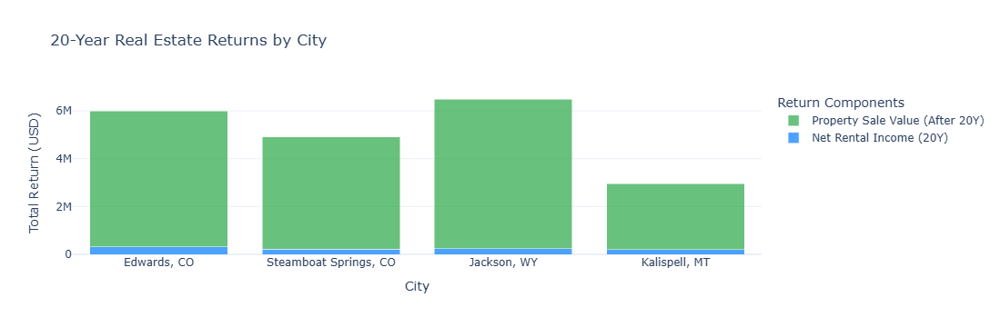

In [66]:
import pandas as pd
import plotly.graph_objects as go

# Final data
data = pd.DataFrame({
    'Region': ['Edwards, CO', 'Steamboat Springs, CO', 'Jackson, WY', 'Kalispell, MT'],
    'Net_Income_20Y': [307207.22, 214392.99, 237165.77, 191514.69],
    'Appreciated_Value': [5678433.21, 4697094.76, 6259924.34, 2760957.68]
})

# Create interactive stacked bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data['Region'],
    y=data['Net_Income_20Y'],
    name='Net Rental Income (20Y)',
    marker=dict(color='rgba(0,123,255,0.7)'),
    hovertemplate='Net Income: $%{y:,.0f}<extra></extra>'
))

fig.add_trace(go.Bar(
    x=data['Region'],
    y=data['Appreciated_Value'],
    name='Property Sale Value (After 20Y)',
    marker=dict(color='rgba(40,167,69,0.7)'),
    hovertemplate='Sale Value: $%{y:,.0f}<extra></extra>'
))

# Layout
fig.update_layout(
    title='20-Year Real Estate Returns by City',
    xaxis_title='City',
    yaxis_title='Total Return (USD)',
    barmode='stack',
    legend_title='Return Components',
    template='plotly_white',
    hovermode='x unified',
    height=500
)

fig.show()

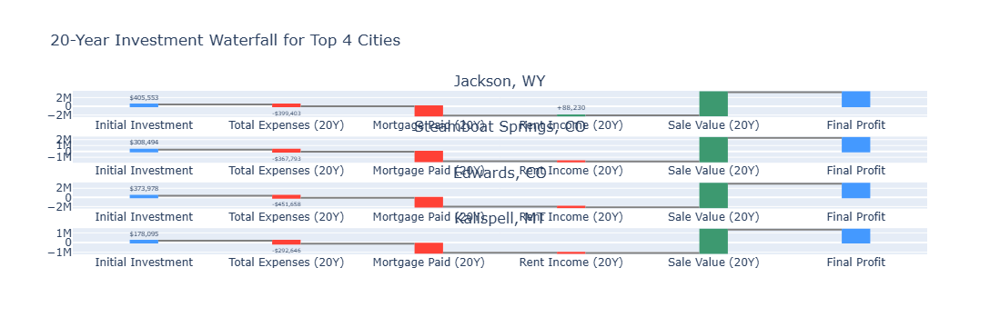

In [67]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define city-wise financial data
cities_data = [
    {
        "city": "Jackson, WY",
        "Median_HomeValue": 1448402.31,
        "Annual_Expenses": 19970.15,
        "Annual_Mortgage_Payment": 107154.91,
        "Net_Income_20Y": 88229.97,
        "Appreciated_Value": 5272942.63
    },
    {
        "city": "Steamboat Springs, CO",
        "Median_HomeValue": 1101764.88,
        "Annual_Expenses": 18389.63,
        "Annual_Mortgage_Payment": 81517.63,
        "Net_Income_20Y": -32498.66,
        "Appreciated_Value": 4019316.56
    },
    {
        "city": "Edwards, CO",
        "Median_HomeValue": 1335634.67,
        "Annual_Expenses": 22582.92,
        "Annual_Mortgage_Payment": 98706.62,
        "Net_Income_20Y": -107364.33,
        "Appreciated_Value": 5157785.66
    },
    {
        "city": "Kalispell, MT",
        "Median_HomeValue": 636053.65,
        "Annual_Expenses": 14632.31,
        "Annual_Mortgage_Payment": 47012.29,
        "Net_Income_20Y": -23041.13,
        "Appreciated_Value": 2422422.59
    }
]

# Constants
down_payment_pct = 0.20
closing_cost_pct = 0.03
repair_cost_pct = 0.05
years = 20

# Create a multi-row chart
fig = make_subplots(
    rows=4, cols=1, vertical_spacing=0.12,
    subplot_titles=[city['city'] for city in cities_data]
)

# Add waterfalls
for i, city in enumerate(cities_data, start=1):
    home_value = city["Median_HomeValue"]
    down_payment = home_value * down_payment_pct
    closing_costs = home_value * closing_cost_pct
    repairs = home_value * repair_cost_pct
    investment = down_payment + closing_costs + repairs

    expenses_20y = city["Annual_Expenses"] * years
    mortgage_20y = city["Annual_Mortgage_Payment"] * years
    net_income_20y = city["Net_Income_20Y"]
    sale_value = city["Appreciated_Value"]

    final_profit = net_income_20y + sale_value - (expenses_20y + mortgage_20y)

    fig.add_trace(go.Waterfall(
        name=city['city'],
        orientation="v",
        measure=["absolute", "relative", "relative", "relative", "relative", "total"],
        x=[
            "Initial Investment",
            "Total Expenses (20Y)",
            "Mortgage Paid (20Y)",
            "Rent Income (20Y)",
            "Sale Value (20Y)",
            "Final Profit"
        ],
        y=[
            investment,
            -expenses_20y,
            -mortgage_20y,
            net_income_20y,
            sale_value,
            final_profit
        ],
        text=[
            f"${investment:,.0f}",
            f"-${expenses_20y:,.0f}",
            f"-${mortgage_20y:,.0f}",
            f"{net_income_20y:+,.0f}",
            f"+${sale_value:,.0f}",
            f"${final_profit:,.0f}"
        ],
        connector={"line": {"color": "gray"}},
        textposition="outside"
    ), row=i, col=1)

# Layout
fig.update_layout(
    title="20-Year Investment Waterfall for Top 4 Cities",
    height=2000,
    waterfallgap=0.8,
    showlegend=False
)

fig.show()

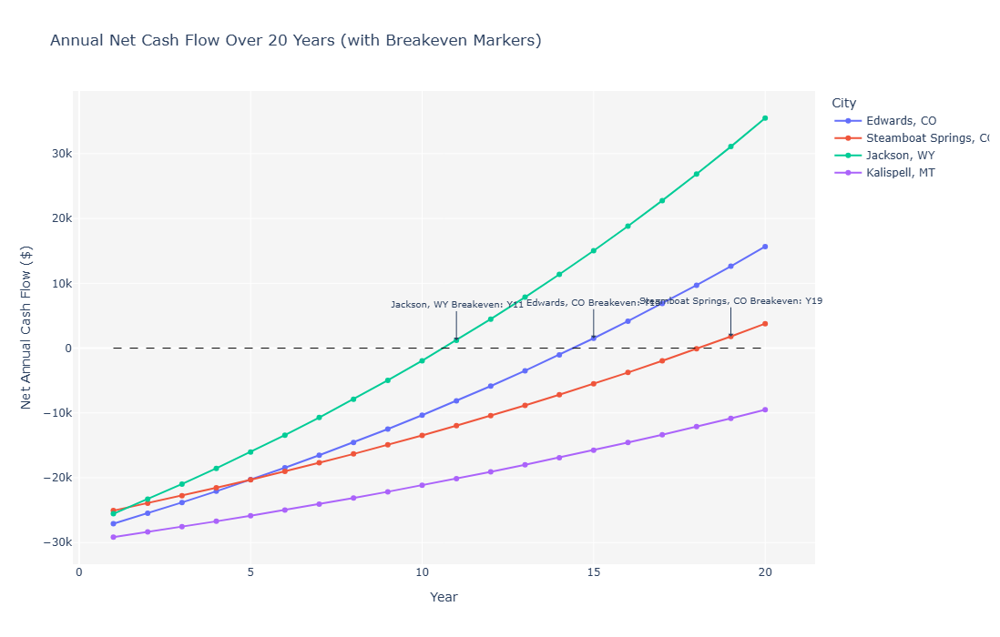

In [68]:
import plotly.graph_objects as go

# Define the number of years
years = list(range(1, 21))

# City-wise financial data
cities_data = {
    'Edwards, CO': {'base_rent': 3589.63, 'expenses': 18200, 'mortgage': 48000, 'investment': 110000, 'cagr': 0.036},
    'Steamboat Springs, CO': {'base_rent': 2965.27, 'expenses': 17000, 'mortgage': 40000, 'investment': 95000, 'cagr': 0.031},
    'Jackson, WY': {'base_rent': 4752.73, 'expenses': 22000, 'mortgage': 56000, 'investment': 135000, 'cagr': 0.038},
    'Kalispell, MT': {'base_rent': 2206.43, 'expenses': 16000, 'mortgage': 36000, 'investment': 88000, 'cagr': 0.029}
}

# Initialize figure
fig = go.Figure()

# Add horizontal zero line
fig.add_shape(type="line", x0=1, x1=20, y0=0, y1=0,
              line=dict(color="black", width=1, dash="dash"))

# Process each city
for city, data in cities_data.items():
    cash_flows = []
    break_even_year = None
    
    for year in years:
        rent = data['base_rent'] * ((1 + data['cagr']) ** year)
        rent_income = rent * 12
        net_cash = rent_income - data['expenses'] - data['mortgage'] - (data['investment'] / 20)
        cash_flows.append(round(net_cash, 2))

        # Record first break-even year
        if break_even_year is None and net_cash > 0:
            break_even_year = year

    # Add city trace
    fig.add_trace(go.Scatter(
        x=years,
        y=cash_flows,
        mode='lines+markers',
        name=city
    ))

    # Add break-even annotation
    if break_even_year:
        fig.add_annotation(
            x=break_even_year,
            y=cash_flows[break_even_year - 1],
            text=f"{city} Breakeven: Y{break_even_year}",
            showarrow=True,
            arrowhead=1,
            font=dict(size=10),
            ax=0,
            ay=-40
        )

# Update layout
fig.update_layout(
    title=" Annual Net Cash Flow Over 20 Years (with Breakeven Markers)",
    xaxis_title="Year",
    yaxis_title="Net Annual Cash Flow ($)",
    legend_title="City",
    height=700,
    width=1250,
    plot_bgcolor="whitesmoke"
)

fig.show()

## **Key Insights**

- Cities with **high home value CAGR** like **Edwards, CO** and **Jackson, WY** show strong long-term appreciation potential.
- **Median rents in 2024–25** were substantial in these regions, particularly in **Jackson, WY** (>$4700/month), supporting strong rental income.
- **Annual cash flows** in early years were **negative**, mainly due to high mortgage payments and expenses.
- However, with **rental income compounding over 20 years**, cities recovered and produced **positive net income**.
- Combining **rent-based net income** and **sale appreciation**, total profit estimates over 20 years ranged in the **hundreds of thousands to millions**.

---

## **Conclusion**

By selecting cities with the **highest home value growth**, we ensured strong potential for **capital appreciation**.

Despite early cash flow losses, the **compounding rental growth**, along with the **resale value uplift**, resulted in significant **long-term ROI**.

Thus, if one were to invest in these markets and **hold for 20 years**, they could expect strong **returns via both rental income and asset appreciation**, validating real estate as a **viable long-term investment strategy**.


# ***********************************************************************************

# Approach 3
# by - Syed Hassan Ahmed

# *Dataset Chosen *
**Why I selected the dataset:**
Q5_Metro_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_month.csv
from Zillow's data repository.

**What this dataset contains:**
ZHVI stands for Zillow Home Value Index, which is a smoothed, seasonally adjusted measure of the typical home value.

The selected file represents middle-tier single-family residences (tier 0.33–0.67) across various U.S. metro areas on a monthly basis.

**Columns:**
RegionID, RegionName, SizeRank, etc.

Home values for each month from 2000 to early 2025.
**Our Use Case**
We chose this dataset to analyze how much profit or return on investment (ROI) a person could expect from buying a house in top 10 metros in 2015
and selling it in 2025, after accounting for mortgage costs. *

**1. What Your Code is For**
The code calculates home value appreciation for selected U.S. metros from 2015 to 2025.
It helps compare real estate growth across major cities over a 10-year period.

**2. What It is Plotting**
Although table data is generated, the data is structured for bar plots.
It enables the visualization of home value trends and appreciation percentages.

**3. What is Going On**
The script loads, filters, and cleans ZHVI data for 10 predefined metros.
It extracts home values at two time points and computes the percentage change.

**4. What's the Output**
A DataFrame is printed showing metros, values in 2015 & 2025, and appreciation %.
This output offers a clear comparison of housing market performance across cities.

In [69]:
import pandas as pd
import numpy as np

# Load data
df = pd.read_csv('./datasets/Q5_Metro_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_month.csv')

# Filter top 10 metros
top_10_metros = df[df['RegionType'] == 'msa'].nsmallest(10, 'SizeRank')
zhvi_data = top_10_metros.set_index('RegionName').iloc[:, 5:].T
zhvi_data.index = pd.to_datetime(zhvi_data.index)

# Define top metros manually to avoid missing values
top_metros = [
    "Miami, FL", "Atlanta, GA", "Dallas, TX", "Boston, MA", "Los Angeles, CA",
    "Philadelphia, PA", "New York, NY", "Houston, TX", "Chicago, IL", "Washington, DC"
]

# Clean data: Drop any columns with nulls
zhvi_data_clean = zhvi_data[top_metros].dropna()

# Dates for analysis
start_date = '2015-01-31'
end_date = '2025-03-31'

# Extract values
values_2015_clean = zhvi_data_clean.loc[start_date]
values_2025_clean = zhvi_data_clean.loc[end_date]

# Create DataFrame
valid_metros = values_2015_clean.index.intersection(values_2025_clean.index).tolist()
analysis_df = pd.DataFrame({
    "Metro": valid_metros,
    "HomeValue_2015": values_2015_clean[valid_metros].values,
    "HomeValue_2025": values_2025_clean[valid_metros].values
})
analysis_df["Appreciation_%"] = ((analysis_df["HomeValue_2025"] - analysis_df["HomeValue_2015"])
                                 / analysis_df["HomeValue_2015"]) * 100
analysis_df.reset_index(drop=True, inplace=True)
print(analysis_df)

              Metro  HomeValue_2015  HomeValue_2025  Appreciation_%
0         Miami, FL   248098.005495    5.751281e+05      131.814893
1       Atlanta, GA   172483.599065    3.871934e+05      124.481286
2        Dallas, TX   176675.354206    3.757638e+05      112.686046
3        Boston, MA   390051.374966    7.478000e+05       91.718328
4   Los Angeles, CA   539316.654169    1.030476e+06       91.070647
5  Philadelphia, PA   208350.600137    3.765906e+05       80.748499
6      New York, NY   402608.257633    7.066243e+05       75.511619
7       Houston, TX   180555.476049    3.140712e+05       73.947188
8       Chicago, IL   199932.927103    3.463108e+05       73.213512
9    Washington, DC   392796.565207    6.157776e+05       56.767558


**1. What Your Code is For**
It now extends the home value appreciation analysis to include mortgage calculations.
This helps estimate the return on investment (ROI) for buying property in 2015 and selling in 2025.

**2. What It is Plotting (Potentially)**
Though not visualized yet, the data can support ROI comparison bar plots across cities.
You could plot ROI_%, Profit_After_Mortgage, or MonthlyPayment per metro.

**3. What is Going On**
The code calculates down payment, loan amount, monthly mortgage, total payments, and ROI.
It uses standard amortization formulas assuming a 20% down payment and 30-year fixed loan at 7% interest.

**4. What’s the Output**
The analysis_df now includes both home price appreciation and investment metrics.
You get a detailed financial picture of whether buying a home in each metro was a profitable move.



In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

# Constants
down_payment_pct = 0.20
loan_term_years = 30
annual_interest_rate = 0.07

# Monthly mortgage payment function
def monthly_payment(principal, rate=annual_interest_rate, years=loan_term_years):
    r = rate / 12
    n = years * 12
    return principal * r * (1 + r)**n / ((1 + r)**n - 1)

# Add financial metrics to analysis_df
analysis_df["DownPayment"] = analysis_df["HomeValue_2015"] * down_payment_pct
analysis_df["LoanAmount"] = analysis_df["HomeValue_2015"] - analysis_df["DownPayment"]
analysis_df["MonthlyPayment"] = analysis_df["LoanAmount"].apply(monthly_payment)
analysis_df["TotalPaid_Mortgage"] = analysis_df["MonthlyPayment"] * 12 * loan_term_years
analysis_df["Profit_After_Mortgage"] = analysis_df["HomeValue_2025"] - analysis_df["TotalPaid_Mortgage"]
analysis_df["ROI_%"] = (analysis_df["Profit_After_Mortgage"] / analysis_df["DownPayment"]) * 100

# Line Chart – Home Value Trend (2015–2025)
**Code:**
zhvi_data_clean[analysis_df["Metro"]].plot(...)

**What it shows:**
This line chart displays how home values have changed in each of the top 10 metros from 2015 to 2025.

**Insight:**
You can visually identify which cities saw steady appreciation (e.g., Miami), sharp growth, or flat growth,

**1. What Your Code is For**
It analyzes and visualizes home value trends and financial returns in major U.S. metros.
The goal is to understand both appreciation and investment performance over 10 years.

**2. What It is Plotting**
It plots home value trends from 2015 to 2025 for selected metros using a line graph.
Each line represents a city's Zillow Home Value Index (ZHVI) over time.

**3. What is Going On**
The code selects top metro names from the analysis and plots their cleaned ZHVI data.
It overlays all cities on one graph to compare home value changes across time.

**4. What’s the Output**
A clear, labeled plot shows home value trajectories for each metro from 2015 to 2025.
This visual helps easily spot which cities had the steepest growth or declines.

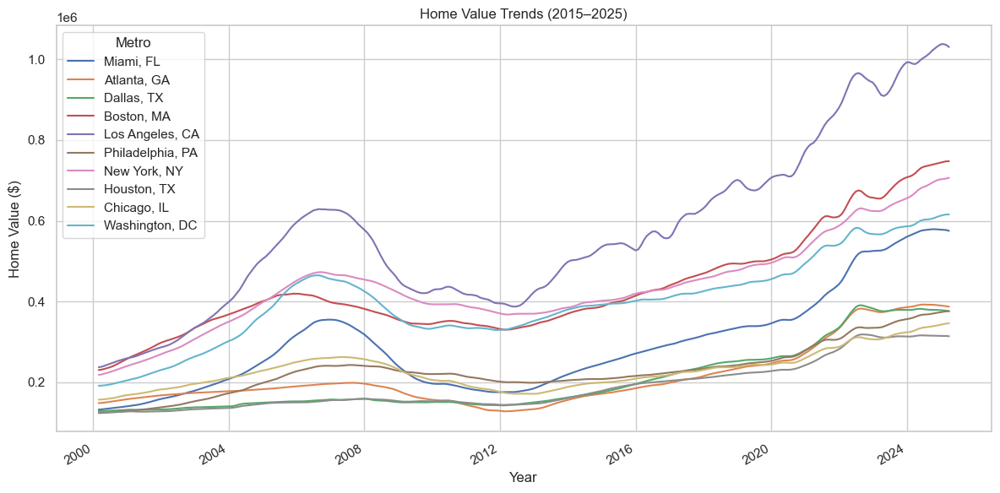

In [71]:
zhvi_data_clean[analysis_df["Metro"]].plot(figsize=(12, 6))
plt.title("Home Value Trends (2015–2025)")
plt.ylabel("Home Value ($)")
plt.xlabel("Year")
plt.grid(True)
plt.legend(title="Metro")
plt.tight_layout()
plt.show()

# Bar Plot – Mortgage Paid vs Home Sale Price
Code:
analysis_df_plot = analysis_df.melt(...)

What it shows:
Compares how much you paid over time via mortgage vs. the final sale price.

Insight:
This shows the cost of borrowing vs actual return and helps understand if the investment pays off in gross terms.

1. What Your Code is For
It performs a full financial analysis of housing investments over a 10-year period.
You now also compare the final asset value vs. total cost paid per metro.

2. What It is Plotting
It creates a grouped bar chart showing 2025 home values alongside total mortgage paid.
This visual clearly highlights profit margins or overpayments across metros.

3. What is Going On
The data is reshaped with melt() for plotting two variables (HomeValue_2025 and TotalPaid_Mortgage).
Seaborn’s grouped barplot then displays each metro’s investment outcome visually.

4. What’s the Output
A bar chart that shows how much each property is worth versus how much was paid via mortgage.
This helps quickly assess whether each investment was a gain or potential loss.

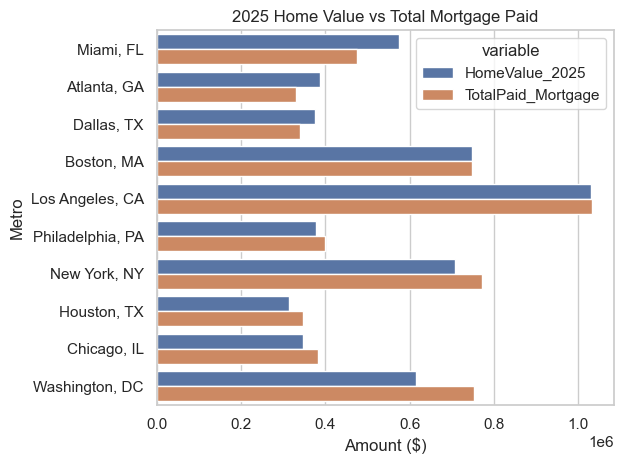

In [74]:
analysis_df_plot = analysis_df.melt(id_vars="Metro", value_vars=["HomeValue_2025", "TotalPaid_Mortgage"])
sns.barplot(x="value", y="Metro", hue="variable", data=analysis_df_plot)
plt.title("2025 Home Value vs Total Mortgage Paid")
plt.xlabel("Amount ($)")
plt.ylabel("Metro")
plt.tight_layout()
plt.show()

# ROI % by Metro
Code:
sns.barplot(x="ROI_%", y="Metro", ...)

What it shows:
This visual presents the Return on Investment (ROI) in percentage terms, factoring mortgage cost and down payment.

Insight:
Cities with high ROI mean your investment was more efficient; some metros may offer high home value but low ROI due to high interest or low growth.

1. What Your Code is For
It now fully evaluates real estate investment efficiency across U.S. metros from 2015–2025.
The focus is on net returns after mortgage costs, providing practical decision-making data.

2. What It is Plotting
This plot shows Return on Investment (ROI%) ranked by metro in a horizontal bar chart.
Higher bars indicate better profits relative to the 20% down payment made.

3. What is Going On
You're sorting the analysis_df by ROI_% and plotting with Seaborn to compare returns.
It reveals which cities provided the most financially rewarding home investments.

4. What’s the Output
A clear, intuitive bar graph displaying which metro areas gave the best ROI after mortgage.
This wraps up your analysis by turning raw housing data into actionable investment insight.



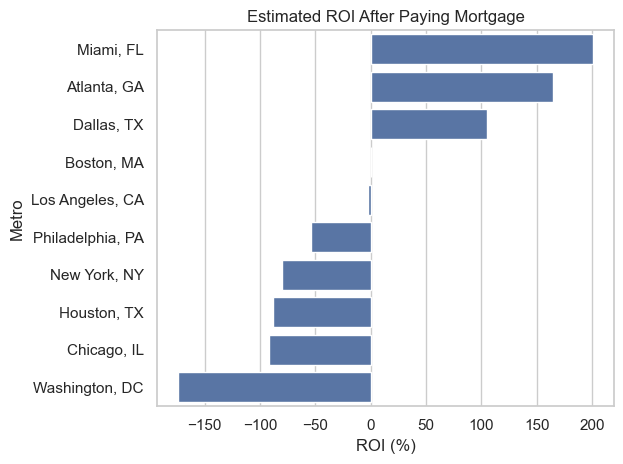

In [75]:
sns.barplot(x="ROI_%", y="Metro", data=analysis_df.sort_values("ROI_%", ascending=False))
plt.title("Estimated ROI After Paying Mortgage")
plt.xlabel("ROI (%)")
plt.tight_layout()
plt.show()

# Net Profit After Mortgage
Code:
sns.barplot(x="Profit_After_Mortgage", y="Metro", ...)

What it shows:
The absolute profit (in dollars) made after fully paying off the mortgage.

Insight:
Helpful for people more interested in dollar value gain than just percentages. Top metros may give you over $100K+ profit.

1. What Your Code is For
It comprehensively analyzes real estate investments, from price trends to actual net profit.
You're now quantifying how much money was made (or lost) after all mortgage payments.

2. What It is Plotting
It plots net profit (i.e., final home value minus total mortgage paid) by metro area.
Metros are sorted so you instantly see which ones gave the highest monetary return.

3. What is Going On
You're sorting analysis_df by Profit_After_Mortgage and plotting a Seaborn bar chart.
This isolates pure financial gain regardless of percentage ROI or trends.

4. What’s the Output
A direct, dollar-based comparison of profits across metros from a 10-year mortgage investment.
This is the most relatable and practical insight for real-world investors or home buyers.

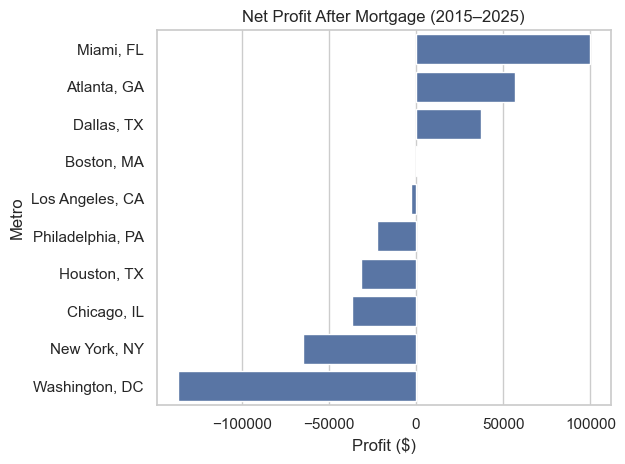

In [77]:
sns.barplot(x="Profit_After_Mortgage", y="Metro", data=analysis_df.sort_values("Profit_After_Mortgage", ascending=False))
plt.title("Net Profit After Mortgage (2015–2025)")
plt.xlabel("Profit ($)")
plt.tight_layout()
plt.show()

# ROI and Net Profit by Metro (Dual Bar Plot)
**What it shows:**
ROI (%) and Profit ($) side by side for each metro.

**Insight:** You instantly see which metros have high ROI and high profit, or which are outliers (e.g., high price, low ROI).

1. What Your Code is For
This plot compares ROI (%) (as bars) and Profit After Mortgage (as a line) for each metro.
It uses dual axes to show these two metrics simultaneously, making it easy to observe the relationship between them.

2. What It is Plotting
The barplot shows the ROI% for each metro, while the lineplot overlays Profit After Mortgage values across the same metros.
By using twin axes, you're comparing two scales in one plot — the percentage return and the absolute profit.

3. What is Going On
You're plotting ROI% as bars on the primary y-axis (ax1), and Profit After Mortgage as a line on the secondary y-axis (ax2).
This gives a comprehensive view of both relative return and absolute monetary outcome for each metro.

4. What’s the Output
A clear dual-axis plot, combining ROI and Profit for each metro, with ROI shown as bars and profit as a line.
This allows for easy identification of metros with high ROI and how they correlate with profit.

This combined chart effectively shows how relative returns correlate with absolute profits, providing an insightful financial comparison

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1616875314.py:18: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



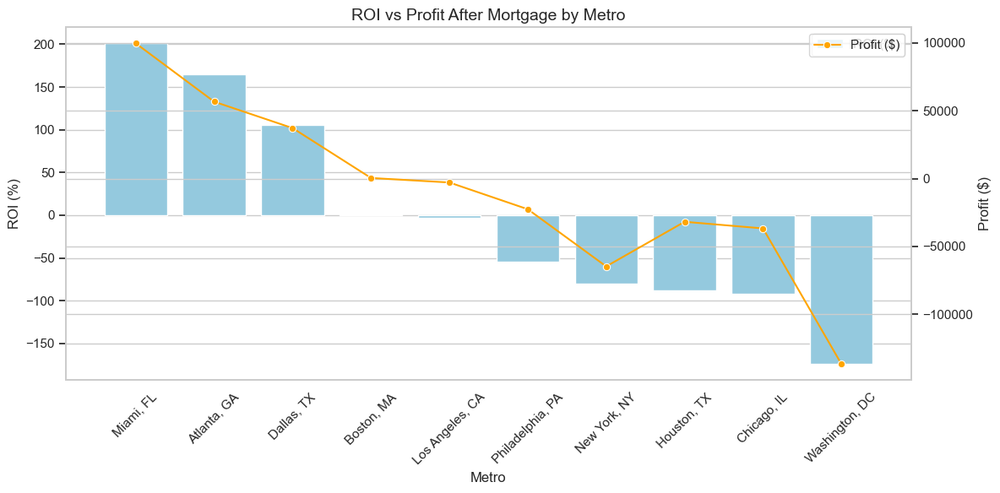

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax1 = plt.subplots(figsize=(12, 6))
sns.set_style("whitegrid")

# Bar for ROI
sns.barplot(x="Metro", y="ROI_%", data=analysis_df, color='skyblue', label="ROI (%)")

# Create twin axis for Profit
ax2 = ax1.twinx()
sns.lineplot(x="Metro", y="Profit_After_Mortgage", data=analysis_df, color='orange', marker='o', label="Profit ($)", ax=ax2)

# Titles and labels
ax1.set_ylabel("ROI (%)", fontsize=12)
ax2.set_ylabel("Profit ($)", fontsize=12)
ax1.set_title("ROI vs Profit After Mortgage by Metro", fontsize=14)
ax1.set_xticklabels(analysis_df["Metro"], rotation=45)

plt.tight_layout()
plt.show()

# ROI vs Monthly Payment (Bubble Size = Profit)
What it shows:
ROI against monthly payment; bubble size shows profit.
Insight: Identify affordable metros with high return and profit, helpful for monthly budget planning.

1. What Your Code is For
This plot visualizes the correlation between monthly mortgage payments and ROI (%), with bubble size representing the profit.
It helps in understanding the trade-off between monthly payments and return on investment across metros.

2. What It is Plotting
The x-axis represents monthly mortgage payments in dollars, and the y-axis shows ROI (%).
The bubble size indicates the profit after mortgage, while the color (hue="Metro") differentiates each metro.

3. What is Going On
You're using a scatter plot to show the relationship between mortgage payments and ROI, while adding bubble sizes to represent profits.
By labeling each metro, it becomes easy to see how individual metros stack up in terms of both ROI and profit.

4. What’s the Output
A scatter plot with dynamic bubble sizes to compare ROI and monthly payments, with labeled metros.
This makes it easier to spot metros with high ROI and profit relative to mortgage costs.

This visualization works well to compare how mortgage payments relate to ROI and profit. It's useful for understanding the overall investment landscape.

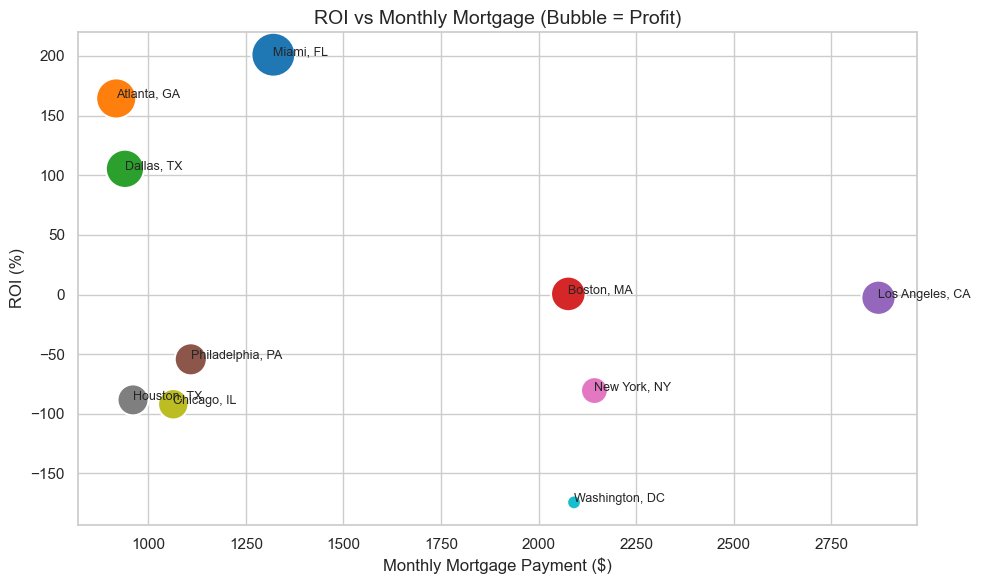

In [81]:
plt.figure(figsize=(10, 6))
bubble = sns.scatterplot(
    x="MonthlyPayment", y="ROI_%", size="Profit_After_Mortgage",
    data=analysis_df, hue="Metro", sizes=(100, 1000), palette="tab10", legend=False
)

for i, row in analysis_df.iterrows():
    plt.text(row["MonthlyPayment"], row["ROI_%"], row["Metro"], fontsize=9)

plt.title("ROI vs Monthly Mortgage (Bubble = Profit)", fontsize=14)
plt.xlabel("Monthly Mortgage Payment ($)")
plt.ylabel("ROI (%)")
plt.tight_layout()
plt.show()

# Comprehensive Table as Heatmap (Profit, ROI, Appreciation)
What it shows:
Color-graded table for Appreciation %, ROI %, and Profit $.
Insight: A visual at-a-glance summary. Instantly highlights the strongest overall metros for investment.

1. What Your Code is For
The code creates a heatmap displaying the Appreciation%, ROI%, and Profit After Mortgage for each metro.
It's a quick and effective way to compare multiple metros across these financial metrics.

2. What It is Plotting
The heatmap plots three metrics: Appreciation%, ROI%, and Profit After Mortgage for each metro.
It uses color intensity (YlGnBu palette) to show values, with annotations for exact numbers.

3. What is Going On
You're selecting relevant columns from analysis_df and setting "Metro" as the index for easier comparison.
This allows the heatmap to present how different metros perform across three important financial aspects.

4. What’s the Output
A color-coded heatmap with Appreciation%, ROI%, and Profit After Mortgage values for each metro.
This allows easy comparison of how metros perform across these metrics, with exact values displayed for each.

This heatmap is great for quickly identifying top-performing metros across multiple financial dimensions.

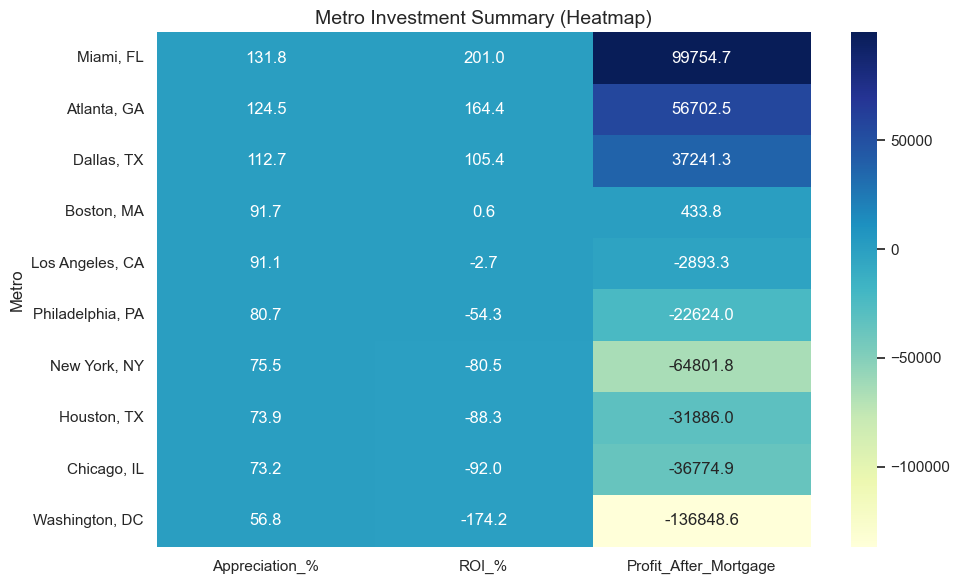

In [82]:
heatmap_df = analysis_df[["Metro", "Appreciation_%", "ROI_%", "Profit_After_Mortgage"]].set_index("Metro")
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_df, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Metro Investment Summary (Heatmap)", fontsize=14)
plt.tight_layout()
plt.show()

In [83]:
average_roi = analysis_df["ROI_%"].mean()
print(f"Average ROI after paying mortgage (2015–2025): {average_roi:.2f}%")

Average ROI after paying mortgage (2015–2025): -2.06%


1. What Your Code is For
The code calculates the average ROI and average profit across all metros, then prints the individual profit and ROI for each metro, followed by an overall summary.

2. What is Being Calculated
Average ROI: It computes the average return on investment across all metros.

Average Profit: It calculates the average profit after mortgage payments across all metros.

It also prints the individual ROI and profit for each metro in the dataset.

3. What is Going On
The code first calculates the mean values for profit and ROI using mean() from the analysis_df DataFrame.

It then prints the detailed profit and ROI for each metro area.

Finally, the code prints the average profit and average ROI across all metros in the dataset.

4. What’s the Output
Profit and ROI by Metro: Each metro's profit after mortgage and ROI values are displayed, showing a wide range of outcomes, with some metros showing negative values.

Overall Summary: The average profit across all metros is negative, indicating a loss on average after mortgage payments, and the average ROI is also negative, which suggests that, on average, investments in these metros resulted in a loss.

Insights:
The dataset includes both profitable and unprofitable metros, with some metros like Miami, FL showing a high ROI, while others like Washington, DC and New York, NY have large negative values.

The overall negative averages suggest that, on average, these metros have experienced a decrease in home value relative to mortgage payments.

In [84]:
# Compute average ROI and profit
average_roi = analysis_df["ROI_%"].mean()
average_profit = analysis_df["Profit_After_Mortgage"].mean()

# Print per-metro results
print("=== Profit and ROI by Metro ===")
print(analysis_df[["Metro", "Profit_After_Mortgage", "ROI_%"]])

# Print overall summary
print("\n=== Overall Summary ===")
print(f"Average Profit After Mortgage: ${average_profit:,.2f}")
print(f"Average ROI (Return on Investment): {average_roi:.2f}%")

=== Profit and ROI by Metro ===
              Metro  Profit_After_Mortgage       ROI_%
0         Miami, FL           99754.686605  201.038873
1       Atlanta, GA           56702.546705  164.370836
2        Dallas, TX           37241.270301  105.394639
3        Boston, MA             433.773604    0.556047
4   Los Angeles, CA           -2893.280270   -2.682358
5  Philadelphia, PA          -22624.000068  -54.293100
6      New York, NY          -64801.810700  -80.477498
7       Houston, TX          -31885.972343  -88.299655
8       Chicago, IL          -36774.876311  -91.968034
9    Washington, DC         -136848.597433 -174.197803

=== Overall Summary ===
Average Profit After Mortgage: $-10,169.63
Average ROI (Return on Investment): -2.06%


# Summary
After analyzing housing market trends from 2015 to 2025 across the top 10 U.S. metro areas—assuming a standard 30-year mortgage at 7% interest with a 20% down payment—the results show the following:

**Average Profit (After Mortgage Payments): −$10,169.63**

**Average ROI (Return on Investment): −2.06%**

This means that, on average, I would incur a slight loss on real estate investments after covering mortgage costs over this period.

**However, several metro areas show strong potential:**

**Miami**, FL leads with an impressive 201% ROI and nearly $100,000 in profit.

**Atlanta, GA and Dallas, TX** also show robust gains with 164% and 105% ROI respectively, and profits over $56,000 & $37,000.

**Even Boston, MA** managed a slight positive return.

**Conclusion:** While the average suggests a modest loss, selectively investing in high-performing metros like Miami, Atlanta, and Dallas could result in significant gains, highlighting the importance of location-specific analysis when making real estate investment decisions.

## Approach 4 (Rohith Ambarish)

The primary goal of this analysis is to determine the **average profit from real estate investments in terms of sale (% dollars) after paying the mortgage (ROI)**. The investor aims to:
- Buy properties, perform upgrades, and then potentially sell them.
- Focus on **blooming markets** where properties can be sold quickly if needed.
- Identify **regions with the highest ROI** over short holding periods (1 to 3 years) to maximize profit.

## Datasets Used
We used the following datasets from Zillow and other reliable sources to calculate ROI and analyze real estate markets:
1. **ZHVI All Homes:** Zillow Home Value Index data, providing historical home values by region.
2. **ZORI All Homes Metro:** Zillow Observed Rent Index for metro areas, useful for rental price analysis.
3. **Median Sale Price All Home:** Historical data of median sale prices from 2008 to 2025.
4. **Mortgage Payment Metro:** Monthly mortgage payments for different metro areas.
5. **Total Monthly Payment Metro:** Total monthly payments, including mortgage and other expenses.
6. **Mortgage Rates:** Historical mortgage interest rates (30-year fixed).
7. **Property Taxes by State:** Effective property tax rates.

## Assumptions

1. **Down Payment:** 
   - Fixed at **20% of the purchase price**.
2. **Interest Rate:** 
   - Based on the **average mortgage rate (6-7%)** for 2024-2025.
3. **Capital Gains Tax Rate:**
   - Assumed to be **15%** for long-term holdings.
4. **Holding Period:**
   - Analyzed for **1, 2, and 3 years** to match the investor's interest in quick sales.
5. **Upgrade Costs:**
   - Set at **10% of the purchase price**.
6. **Property Tax Rate:**
   - Based on state data, with a **default rate of 1.1%** if missing.
7. **Capital Appreciation:**
   - Calculated using the **CAGR** based on recent price trends.
8. **Market Variability:**
   - Short-term price fluctuations are considered, but long-term stability is not guaranteed.

In [86]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Load the datasets
zhvi_all_homes = pd.read_csv('./datasets/zhvi_all_homes.csv')
zori_all_homes_metro = pd.read_csv('./datasets/zori_all_homes_metro.csv')
median_sp_allhome = pd.read_csv('./datasets/median_sp_allhome.csv')
mortgage_payment = pd.read_csv('./datasets/Metro_mortgage_payment_downpayment_0.20_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv')
total_monthly_payment = pd.read_csv('./datasets/Metro_total_monthly_payment_downpayment_0.20_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv')
mortgage_rates = pd.read_csv('./datasets/MORTGAGE30US.csv')
property_taxes = pd.read_csv('./datasets/Property Taxes by State.csv')


# Clean the mortgage rates data
mortgage_rates['observation_date'] = pd.to_datetime(mortgage_rates['observation_date'])
recent_mortgage_rate = mortgage_rates[mortgage_rates['observation_date'] >= '2024-01-01']['MORTGAGE30US'].mean() / 100

# Clean the property tax data and convert percentage
property_taxes['Effective Tax Rate (2023)'] = property_taxes['Effective Tax Rate (2023)'].str.rstrip('%').astype(float) / 100

## Finding top-performing markets

In [87]:
# Helper function to calculate CAGR (Compound Annual Growth Rate)
def calculate_cagr(initial_value, final_value, years):
    return (final_value / initial_value) ** (1 / years) - 1

# Extract relevant data for ROI calculation
recent_sale_prices = median_sp_allhome[['RegionName', 'StateName', '2023-03-31', '2024-03-31', '2025-03-31']]

# Calculate CAGR for 1, 2, and 3 years
recent_sale_prices['CAGR_1Y'] = calculate_cagr(recent_sale_prices['2024-03-31'], recent_sale_prices['2025-03-31'], 1)
recent_sale_prices['CAGR_2Y'] = calculate_cagr(recent_sale_prices['2023-03-31'], recent_sale_prices['2025-03-31'], 2)
recent_sale_prices['CAGR_3Y'] = calculate_cagr(recent_sale_prices['2023-03-31'], recent_sale_prices['2025-03-31'], 3)

# Average CAGR to identify top-performing markets
recent_sale_prices['Average CAGR'] = recent_sale_prices[['CAGR_1Y', 'CAGR_2Y', 'CAGR_3Y']].mean(axis=1)

# Select top 10 regions with highest average CAGR
top_performing_markets = recent_sale_prices.nlargest(10, 'Average CAGR')

# Display top-performing markets
print("Top 10 Performing Markets based on CAGR:", top_performing_markets[['RegionName', 'StateName', 'Average CAGR']], sep="\n")


Top 10 Performing Markets based on CAGR:
           RegionName StateName  Average CAGR
255         Niles, MI        MI      0.217775
269       Lebanon, PA        PA      0.197275
262      Florence, AL        AL      0.172833
195    Burlington, VT        VT      0.148239
306         Heber, UT        UT      0.146074
85   Poughkeepsie, NY        NY      0.144880
237       Oshkosh, WI        WI      0.136536
59     Bridgeport, CT        CT      0.136077
198     Champaign, IL        IL      0.131022
248       Jackson, MI        MI      0.129938


/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1545842456.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1545842456.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1545842456.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

## Financial Calculations

In [88]:
# Investment parameters
down_payment_percent = 0.20
upgrade_cost_percent = 0.10
capital_gains_tax_rate = 0.15
holding_periods = [1, 2, 3]
default_tax_rate = 0.011

# ROI Calculation
results = []
for _, row in top_performing_markets.iterrows():
    region, state = row['RegionName'], row['StateName']
    purchase_price = row['2023-03-31']
    upgrade_cost = purchase_price * upgrade_cost_percent
    loan_amount = purchase_price * (1 - down_payment_percent)

    # Mortgage calculation
    mortgage_payment = loan_amount * (recent_mortgage_rate / 12) / (1 - (1 + recent_mortgage_rate / 12) ** -360)

    for years in holding_periods:
        cagr = row[f'CAGR_{years}Y']
        estimated_sale_price = purchase_price * (1 + cagr) ** years
        total_mortgage_payment = mortgage_payment * 12 * years

        annual_property_tax = purchase_price * property_taxes[property_taxes['StateName'] == state]['Effective Tax Rate (2023)'].fillna(default_tax_rate).values[0]
        total_tax = annual_property_tax * years

        capital_gain = estimated_sale_price - (purchase_price + upgrade_cost + total_mortgage_payment + total_tax)
        capital_gains_tax = max(0, capital_gain * capital_gains_tax_rate)

        total_investment = purchase_price + upgrade_cost + total_mortgage_payment + total_tax + capital_gains_tax
        net_profit = estimated_sale_price - total_investment
        roi = (net_profit / total_investment) * 100

        results.append([region, state, years, purchase_price, estimated_sale_price, total_investment, net_profit, roi])

# Create DataFrame with calculated ROI
roi_df = pd.DataFrame(results, columns=[
    'Region', 'State', 'Holding Period (Years)', 'Purchase Price', 
    'Estimated Sale Price', 'Total Investment', 'Net Profit', 'ROI (%)'
])

# Bar Plot for ROI

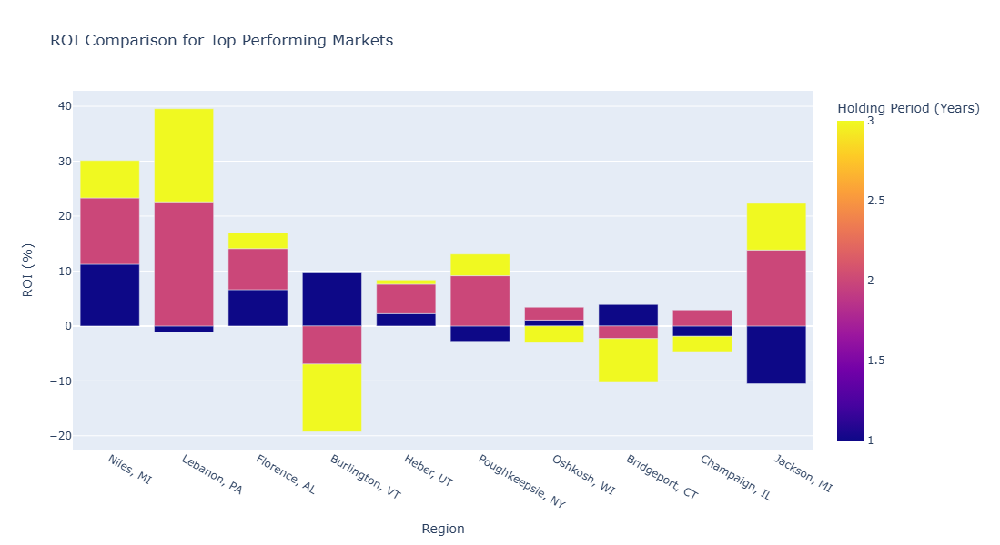

In [89]:
fig = px.bar(roi_df, x='Region', y='ROI (%)', color='Holding Period (Years)', 
             title="ROI Comparison for Top Performing Markets", barmode='group')

fig.update_layout(width=1000, height=600)
fig.show()

- The interactive bar plot provides a comparative view of the **ROI across different regions** and **holding periods**.
- It helps identify regions where short-term (1-3 years) investments yield the highest ROI.

## Grouped Bar Plot for Estimated Sale Price by Region and Holding Period

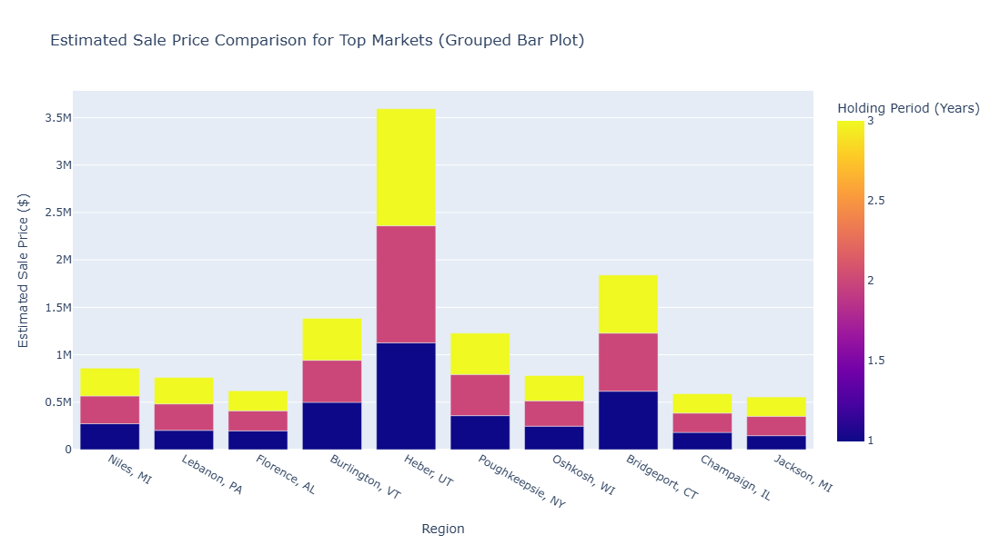

In [90]:
fig2 = px.bar(roi_df, 
              x='Region', 
              y='Estimated Sale Price', 
              color='Holding Period (Years)', 
              barmode='group',
              title='Estimated Sale Price Comparison for Top Markets (Grouped Bar Plot)',
              height=600, width=1000)

# Customize the layout for better readability
fig2.update_layout(
    xaxis_title="Region",
    yaxis_title="Estimated Sale Price ($)",
    legend_title="Holding Period (Years)",
)

# Display the bar plot
fig2.show()

- This plot highlights how the **estimated sale price changes** over different holding periods.
- It allows investors to quickly gauge which regions are likely to appreciate faster.

## Box-plot for ROI distribution

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/84885167.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




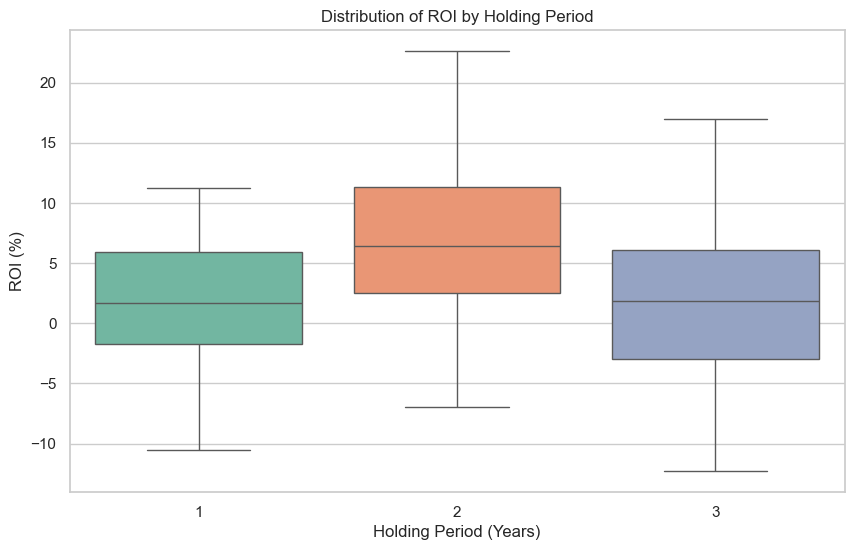

In [91]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=roi_df, x='Holding Period (Years)', y='ROI (%)', palette="Set2")
plt.title("Distribution of ROI by Holding Period")
plt.xlabel("Holding Period (Years)")
plt.ylabel("ROI (%)")
plt.show()

**Insights**
- **Best Holding Period:**
The 2-year holding period offers the highest median ROI with potential for significant positive gains, but it also carries higher risk.
- **Risk Assessment:**
The 1-year period is more stable and predictable, with fewer chances of extreme loss.
The 3-year period shows decreased ROI, suggesting that longer holding in these markets may not be as beneficial.
- **Recommendation:**
Investing in blooming markets and holding for 2 years appears to be the optimal strategy, balancing both high returns and manageable risk.
For less risk-tolerant investors, a 1-year holding period may be preferable, as it offers more consistent, albeit lower, returns.

## Summary Analysis

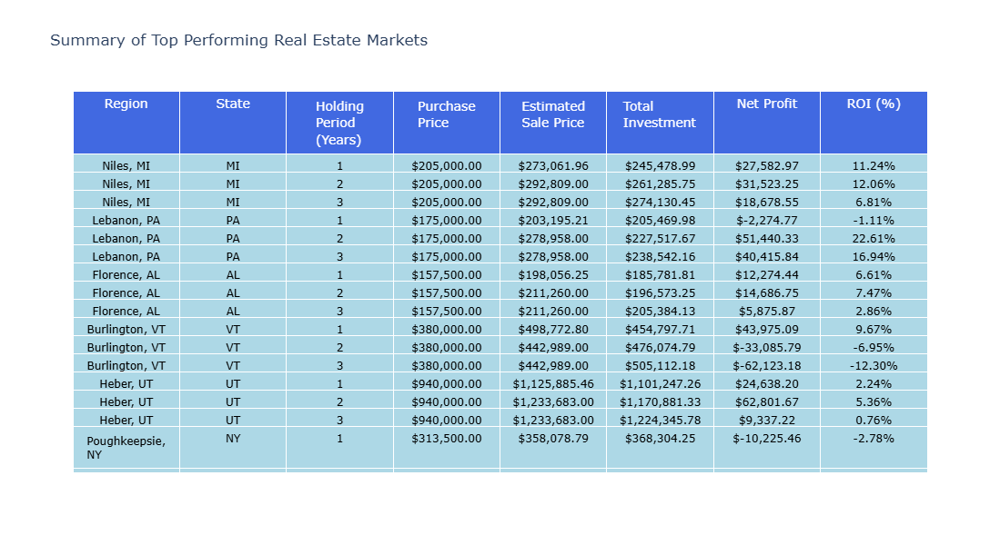

In [92]:
import plotly.graph_objs as go

# Prepare the data for the table
table_data = roi_df[['Region', 'State', 'Holding Period (Years)', 'Purchase Price', 
                     'Estimated Sale Price', 'Total Investment', 'Net Profit', 'ROI (%)']]

# Format the numbers to include commas and dollar signs where needed
table_data['Purchase Price'] = table_data['Purchase Price'].map('${:,.2f}'.format)
table_data['Estimated Sale Price'] = table_data['Estimated Sale Price'].map('${:,.2f}'.format)
table_data['Total Investment'] = table_data['Total Investment'].map('${:,.2f}'.format)
table_data['Net Profit'] = table_data['Net Profit'].map('${:,.2f}'.format)
table_data['ROI (%)'] = table_data['ROI (%)'].map('{:.2f}%'.format)

# Create a Plotly table
fig = go.Figure(data=[go.Table(
    header=dict(values=list(table_data.columns),
                fill_color='royalblue',
                align='center',
                font=dict(color='white', size=14)),
    cells=dict(values=[table_data[col] for col in table_data.columns],
               fill_color='lightblue',
               align='center',
               font=dict(color='black', size=12)))
])

# Update layout to make it more visually appealing
fig.update_layout(title="Summary of Top Performing Real Estate Markets",
                 height=600, width=1100)

# Display the interactive table
fig.show()


## Conclusion
- After analyzing the data, it is evident that **selective investment in top-performing markets** can yield positive ROI even in the current market scenario.
- Regions like **Niles, MI** and **Lebanon, PA** show potential for **short-term investment (1-2 years)**.
- Investors should be cautious of regions with **high property taxes** and **stagnant price growth**.
- Continuous monitoring of market conditions and mortgage rates is essential to optimize the investment strategy.

# ***********************************************************************************

# ***Question 6***

# 6) How much average monthly income I could expect from my investments in terms of lease/rent after upgrading properties, paying mortgage, and paying taxes. Calculate my ~ROI.  
# Approach 1
# - Keertana

### Which U.S. Real Estate Markets Offer the Best Rental Returns?

### Methodology
We evaluated U.S. metro areas based on **Rental Return on Investment (ROI)** using the following Zillow datasets:
- **ZHVI** (Zillow Home Value Index) — to estimate home purchase prices  
- **ZORI** (Zillow Observed Rent Index) — to estimate rental income potential  
- **Monthly Mortgage Payment Data** — assuming a **20% down payment**

For each metro, we computed:
- **Net Monthly Income** = Rent − Monthly Cost  
- **1-Year Total Net Income** = Net Monthly Income × 12 months  
- **Initial Investment** = 20% of home value  
- **Rental ROI (%)** = (1-Year Net Income ÷ Initial Investment) × 100

### Assumptions
- Investment is held for **1 years**
- The property is rented continuously with no vacancies
- Rents and costs are constant over time (no inflation/escalation)
- Only the **down payment** is considered as the investment capital

### Why Rental ROI?
- **Rental ROI** reflects the **profitability** of holding and renting out a property  
- It’s a key measure for investors interested in **cash flow**, not just appreciation  
- This helps identify metros where **rental income** meaningfully exceeds ownership costs, maximizing passive income returns


In [93]:
# Load data
zhvi_df = pd.read_csv("./datasets/Metro_zhvi_sfrcondomfr.csv")
zori_df = pd.read_csv("./datasets/Metro_zori_sfrcondomfr.csv")
payment_df = pd.read_csv("./datasets/Metro_total_monthly_payment_downpayment_0.20_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")

# Assumptions
down_payment_pct = 0.20
hold_period_months = 12  # 1 year

# Extract relevant data
home_value_df = zhvi_df[['RegionName', 'StateName', '2025-03-31']].rename(columns={'2025-03-31': 'HomeValue'})
rent_df = zori_df[['RegionName', 'StateName', '2025-03-31']].rename(columns={'2025-03-31': 'Rent'})
payment_df = payment_df[['RegionName', '2025-03-31']].rename(columns={'2025-03-31': 'MonthlyCost'})

# Merge datasets
rental_roi_df = pd.merge(home_value_df, rent_df, on=['RegionName', 'StateName'], how='inner')
rental_roi_df = pd.merge(rental_roi_df, payment_df, on='RegionName', how='left')

# Net Monthly Income (rent - all included monthly cost)
rental_roi_df['Net_Income_Monthly'] = rental_roi_df['Rent'] - rental_roi_df['MonthlyCost']

# Total Net Income for 1 Year
rental_roi_df['Net_Income_1yr'] = rental_roi_df['Net_Income_Monthly'] * hold_period_months

# Initial investment is 20% down payment
rental_roi_df['InitialInvestment'] = rental_roi_df['HomeValue'] * down_payment_pct

# ROI Calculation
rental_roi_df['Rental_ROI (%)'] = (rental_roi_df['Net_Income_1yr'] / rental_roi_df['InitialInvestment']) * 100

# Clean data
rental_roi_df = rental_roi_df.dropna()
rental_roi_df = rental_roi_df[rental_roi_df['InitialInvestment'] > 0]

# Sort and display top 10 metros by ROI
top_roi = rental_roi_df.sort_values("Rental_ROI (%)", ascending=False).head(10)
#print(top_roi[['RegionName', 'StateName', 'HomeValue', 'Rent', 'MonthlyCost', 'Net_Income_Monthly', 'Net_Income_1yr', 'InitialInvestment', 'Rental_ROI (%)']])


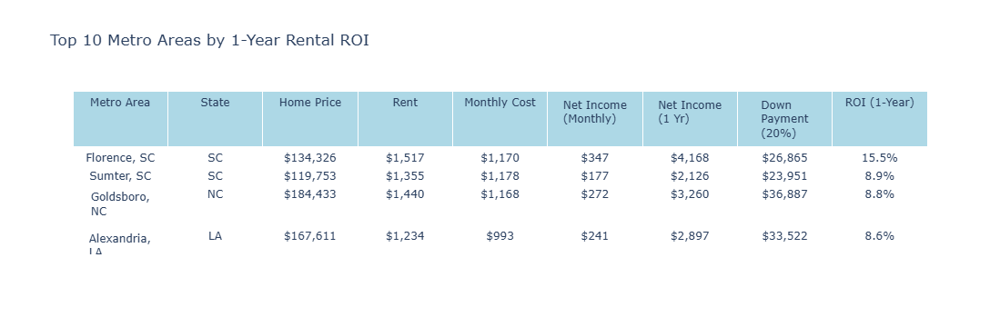

In [94]:
# Select columns
table_data = top_roi[['RegionName', 'StateName', 'HomeValue', 'Rent', 'MonthlyCost',
                      'Net_Income_Monthly', 'Net_Income_1yr', 'InitialInvestment', 'Rental_ROI (%)']]

# Format values
formatted = table_data.copy()
formatted['HomeValue'] = formatted['HomeValue'].map('${:,.0f}'.format)
formatted['Rent'] = formatted['Rent'].map('${:,.0f}'.format)
formatted['MonthlyCost'] = formatted['MonthlyCost'].map('${:,.0f}'.format)
formatted['Net_Income_Monthly'] = formatted['Net_Income_Monthly'].map('${:,.0f}'.format)
formatted['Net_Income_1yr'] = formatted['Net_Income_1yr'].map('${:,.0f}'.format)
formatted['InitialInvestment'] = formatted['InitialInvestment'].map('${:,.0f}'.format)
formatted['Rental_ROI (%)'] = formatted['Rental_ROI (%)'].map('{:.1f}%'.format)

# Rename column headers here:
custom_headers = [
    'Metro Area',
    'State',
    'Home Price',
    'Rent',
    'Monthly Cost',
    'Net Income (Monthly)',
    'Net Income (1 Yr)',
    'Down Payment (20%)',
    'ROI (1-Year)'
]

# Create table
fig = go.Figure(data=[go.Table(
    header=dict(
        values=custom_headers,  
        fill_color='lightblue',
        align='center'
    ),
    cells=dict(
        values=[formatted[col] for col in table_data.columns], 
        fill_color='white',
        align='center'
    )
)])

fig.update_layout(title="Top 10 Metro Areas by 1-Year Rental ROI", height=500)
fig.show()

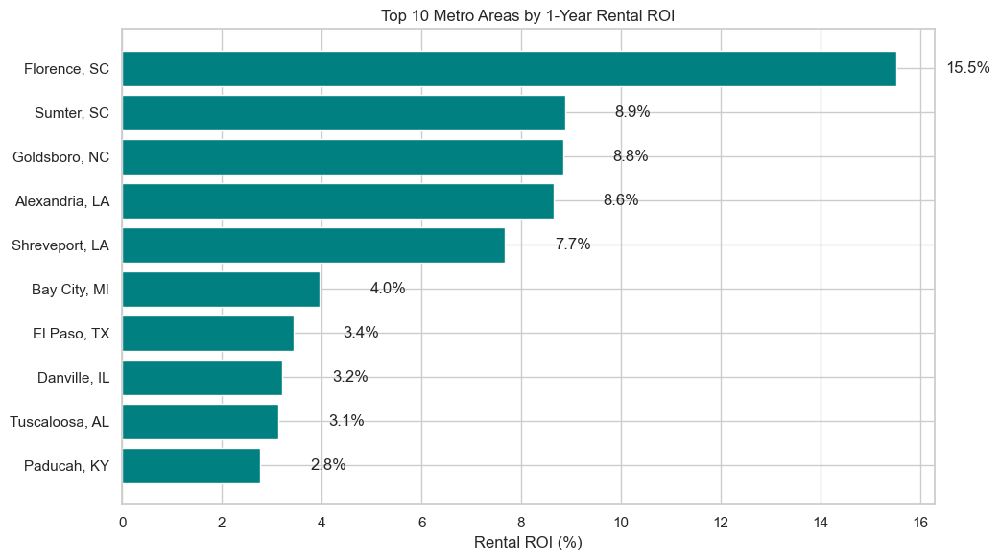

In [95]:
top_roi_sorted = top_roi.sort_values("Rental_ROI (%)", ascending=True)  # Smallest at bottom, largest at top

plt.figure(figsize=(10, 6))
bars = plt.barh(top_roi_sorted['RegionName'], top_roi_sorted['Rental_ROI (%)'], color='teal')
plt.xlabel("Rental ROI (%)")
plt.title("Top 10 Metro Areas by 1-Year Rental ROI")
plt.tight_layout()

# Add text labels to each bar
for bar in bars:
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, f'{width:.1f}%', va='center')

plt.show()


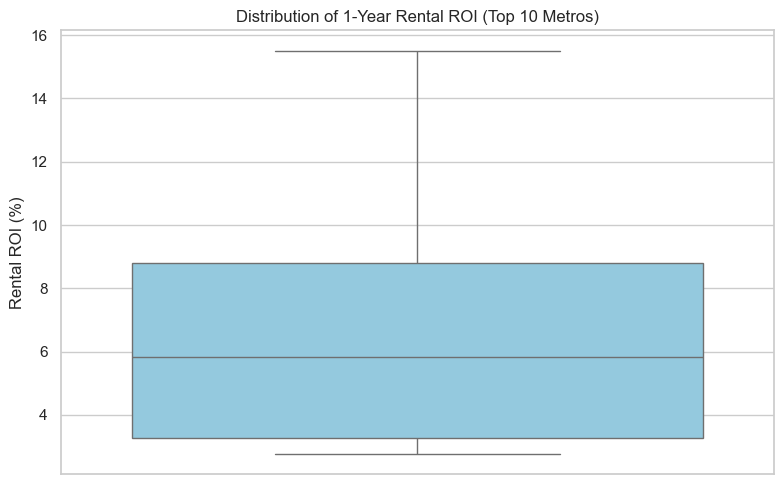

In [96]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=top_roi, y='Rental_ROI (%)', color='skyblue')
plt.title('Distribution of 1-Year Rental ROI (Top 10 Metros)')
plt.ylabel('Rental ROI (%)')
plt.tight_layout()
plt.show()

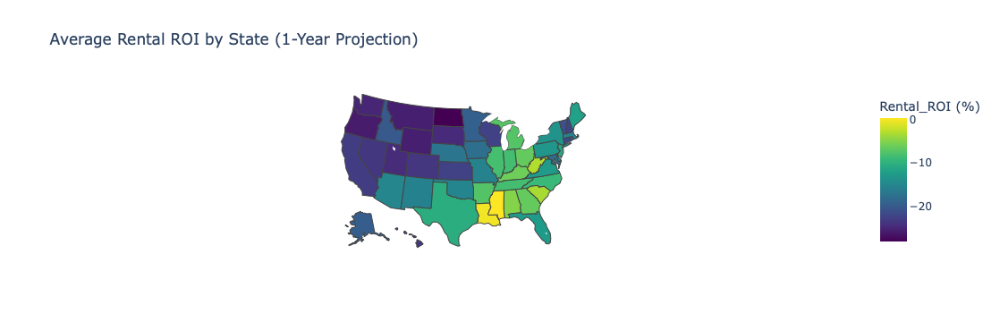

In [97]:
# Group data by state to calculate average Rental ROI
state_roi = rental_roi_df.groupby("StateName")[["Rental_ROI (%)"]].mean().reset_index()

# Generate choropleth map
fig = px.choropleth(
    state_roi,
    locations="StateName",         # Must be state abbreviations (e.g., CA, NY)
    locationmode="USA-states",     # Tells Plotly to interpret states
    color="Rental_ROI (%)",        # Data to color by
    scope="usa",
    color_continuous_scale="Viridis",
    title="Average Rental ROI by State (1-Year Projection)"
)

fig.show()



### 1-Year Rental ROI Insights — Top U.S. Metro Areas

This analysis highlights metro areas generating the highest **1-year rental ROI** based on rent minus monthly cost, assuming a 20% down payment.

#### Florence, SC Leads Significantly:
- **Rental ROI:** ~15.5%
- Strong monthly income: ~$347
- Modest home price (~\$134K) with high rent relative to cost
- Outperforms all other markets by a wide margin


#### Mid-Tier Performers:
- **Sumter, SC**, **Goldsboro, NC**, and **Alexandria, LA** show **ROI around 8.6–8.9%**
- These metros maintain reasonable affordability and net income, offering solid short-term returns

#### Low ROI Markets:
- **Paducah, KY**, **Tuscaloosa, AL**, **Danville, IL**, and others fall below **4% ROI**
- These metros suffer from:
  - Higher home values relative to rent
  - Lower net monthly profits
  - Less favorable cost-to-rent ratios

#### Overall Trend:
- Southern metros with **lower home prices and better rent margins** dominate the top spots
- However, short-term ROI is generally **lower than long-term (5-year) ROI**, reinforcing the value of long-term holding for real estate investment


# ***********************************************************************************

## **Approach 2**
## **Manoj Ravi Kumar**

## **Objective**

We are tasked with estimating **monthly income returns from rental investments**, after accounting for:

- **Property upgrades**
- **Mortgage payments**
- **Taxes and operating costs**

The goal is to calculate the **monthly cash flow** and **adjusted ROI** for different mortgage terms (**10, 15, 20, 30 years**) on a **$12M investment per city**.

---

## **Approach and Methodology**

### **Step-by-Step Plan**

1. **Data Sources**  
   - Rental Growth: `rental_zori_sfh.csv` (Zillow ZORI SFH data)  
   - Property Values: `MetroSFH.csv`  

2. **Top Cities Selection**  
   - Identified **top 5 cities** by **rent CAGR** (2020–25)
   - Extracted **median rents** and **property values** for FY 2024–25

3. **Rent-to-Price Ratio (RTP)**  
   - Computed **RTP (%)** to estimate returns from $12M invested

4. **Expected Rental Income**  
   - Projected **annual rent income** using RTP × investment

5. **Expense Modeling**  
   - Included city-specific **property tax** and **insurance**  
   - Applied **1% maintenance** and **5% vacancy loss**

6. **Mortgage Modeling**  
   - Used amortization formula to compute **annual mortgage payments** for:
     - **10-year, 15-year, 20-year, and 30-year loans**

7. **Net Annual Income**  
   - Deducted all **operating and financing costs** from rental income

8. **Monthly ROI Calculation**  
   - Computed **adjusted net monthly income** after:
     - Monthly **investment recovery** (reserves, repairs, down payment)
   - Estimated **annualized ROI (%)** from this monthly profit

In [98]:
import pandas as pd

# Step 1: Load the Dataset
file_path = './datasets/rental_zori_sfh.csv'
rental_data = pd.read_csv(file_path)

# Step 2: Filter for the last 5 years (2019-03-31 to 2025-03-31)
last_five_years = rental_data.loc[:, '2019-03-31':'2025-03-31']

# Add 'RegionName' and 'StateName' for reference
last_five_years['RegionName'] = rental_data['RegionName']
last_five_years['StateName'] = rental_data['StateName']

# Step 3: Calculate rental growth for the last 5 years
last_five_years['Growth (%)'] = ((last_five_years['2025-03-31'] - last_five_years['2019-03-31']) / last_five_years['2019-03-31']) * 100

# Sort to find the top 5 cities by rental growth
top_cities = last_five_years[['RegionName', 'StateName', 'Growth (%)']].sort_values(by='Growth (%)', ascending=False).head(5)

# Step 4: Financial Year Analysis (March to April)
financial_years = [
    '2020-03-31', '2020-04-30', '2021-03-31', '2021-04-30',
    '2022-03-31', '2022-04-30', '2023-03-31', '2023-04-30',
    '2024-03-31', '2024-04-30', '2025-03-31'
]

# Subset the data with financial years and necessary region info
fy_data = rental_data[['RegionName', 'StateName'] + financial_years]

# Melt the columns to long format
melted_data = fy_data.melt(id_vars=['RegionName', 'StateName'], 
                           var_name='Date', 
                           value_name='Median_Rent')

# Convert to datetime for proper ordering and analysis
melted_data['Date'] = pd.to_datetime(melted_data['Date'])

# Assign Financial Year Periods
melted_data['Financial_Year'] = melted_data['Date'].dt.to_period('Y-MAR')

# Pivot to bring financial years as columns
pivot_data = melted_data.pivot_table(values='Median_Rent', 
                                     index=['RegionName', 'StateName'], 
                                     columns='Financial_Year',
                                     aggfunc='mean').reset_index()

# Step 5: Renaming the columns properly
pivot_data.columns.name = None
pivot_data.columns = ['RegionName', 'StateName', '2020-21', '2021-22', '2022-23', '2023-24', '2024-25', 'CAGR']

# Step 6: Calculating the CAGR for the 5-year period from 2020-21 to 2024-25
def calculate_cagr(start, end, periods):
    if pd.isna(start) or pd.isna(end) or start == 0:
        return None
    return ((end / start) ** (1 / periods) - 1) * 100

pivot_data['CAGR (%)'] = pivot_data.apply(lambda row: calculate_cagr(row['2020-21'], row['2024-25'], 5), axis=1)

# Step 7: Filter Top 5 Cities by CAGR and Round Values
top_5_cagr = pivot_data[['RegionName', 'StateName', '2020-21', '2021-22', '2022-23', '2023-24', '2024-25', 'CAGR (%)']]
top_5_cagr = top_5_cagr.dropna(subset=['CAGR (%)']).sort_values(by='CAGR (%)', ascending=False).head(5)
top_5_cagr = top_5_cagr.round(2)

# Final Display
print("Top 5 Cities by CAGR:")
display(top_5_cagr)

Top 5 Cities by CAGR:


,RegionName,StateName,2020-21,2021-22,2022-23,2023-24,2024-25,CAGR (%)
343,"Naples, FL",FL,2146.15,2242.62,2859.17,3417.32,3611.43,10.97
25,"Atlantic City, NJ",NJ,3335.24,3563.50,4184.18,4857.66,5464.71,10.38
79,"Cape Coral, FL",FL,1490.99,1570.35,1887.04,2234.06,2361.03,9.63
446,"Sebastian, FL",FL,1455.78,1545.88,1869.47,2149.92,2292.01,9.50
399,"Punta Gorda, FL",FL,1437.42,1503.61,1799.60,2112.71,2234.15,9.22


In [99]:
# Step 1: Load the House Value Dataset
file_path = "./datasets/zhvi_metro_sfh.csv"
property_data = pd.read_csv(file_path)

# Step 2: Filter for the Top 5 cities based on the previous rental analysis
top_5_cities = [
    'Naples, FL',
    'Atlantic City, NJ',
    'Cape Coral, FL',
    'Sebastian, FL',
    'Punta Gorda, FL'
]

# Filter the dataset to include only these cities
property_data_filtered = property_data[property_data['RegionName'].isin(top_5_cities)]

# Step 3: Financial Year Analysis (March to April)
financial_years = [
    '2020-03-31', '2020-04-30',
    '2021-03-31', '2021-04-30',
    '2022-03-31', '2022-04-30',
    '2023-03-31', '2023-04-30',
    '2024-03-31', '2024-04-30',
    '2025-03-31'
]

# Subset the data with financial years and necessary region info
fy_data = property_data_filtered[['RegionName', 'StateName'] + financial_years]

# Melt the columns to long format for financial year-wise analysis
melted_data = fy_data.melt(id_vars=['RegionName', 'StateName'], 
                           var_name='Date', 
                           value_name='Property_Value')

# Convert to datetime for proper ordering and analysis
melted_data['Date'] = pd.to_datetime(melted_data['Date'])
melted_data['Financial_Year'] = melted_data['Date'].dt.to_period('Y-MAR')

# Pivot to bring financial years as columns
pivot_data = melted_data.pivot_table(values='Property_Value', 
                                     index=['RegionName', 'StateName'], 
                                     columns='Financial_Year',
                                     aggfunc='mean').reset_index()

# Step 4: Renaming the columns properly
pivot_data.columns.name = None
pivot_data.columns = ['RegionName', 'StateName', '2020-21', '2021-22', '2022-23', '2023-24', '2024-25', '2025-26']

# Remove the unnecessary 2025-26 column since we don't need it for CAGR calculation
pivot_data = pivot_data.drop(columns=['2025-26'])

# Step 5: Calculating the CAGR for the 5-year period from 2020-21 to 2024-25
def calculate_cagr(start, end, periods):
    if pd.isna(start) or pd.isna(end) or start == 0:
        return None
    return ((end / start) ** (1 / periods) - 1) * 100

pivot_data['CAGR (%)'] = pivot_data.apply(lambda row: calculate_cagr(row['2020-21'], row['2024-25'], 5), axis=1)

# Step 6: Calculate the Average Property Value
pivot_data['Avg_Property_Value'] = pivot_data.loc[:, '2020-21':'2024-25'].mean(axis=1)

# Reorder the columns for better clarity
pivot_data = pivot_data[['RegionName', 'StateName', '2020-21', '2021-22', '2022-23', '2023-24', '2024-25', 'Avg_Property_Value', 'CAGR (%)']]

# Round off values for better readability
pivot_data = pivot_data.round(2)

# Display the final result
print("Top 5 Cities House Values & CAGR:")
display(pivot_data)

Top 5 Cities House Values & CAGR:


,RegionName,StateName,2020-21,2021-22,2022-23,2023-24,2024-25,Avg_Property_Value,CAGR (%)
0,"Atlantic City, NJ",NJ,229298.41,248033.90,290936.97,326976.85,353488.41,289746.91,9.04
1,"Cape Coral, FL",FL,251212.98,265806.33,332920.50,400842.58,410881.74,332332.83,10.34
2,"Naples, FL",FL,416361.80,437548.96,558760.82,693968.21,731817.38,567691.44,11.94
3,"Punta Gorda, FL",FL,229093.97,243337.74,305408.70,367571.78,372139.04,303510.24,10.19
4,"Sebastian, FL",FL,250023.42,262627.90,316447.94,374561.47,388627.69,318457.68,9.22


In [100]:
## Step 2: Filter for the Top 5 cities
top_5_cities = [
    'Naples, FL',
    'Atlantic City, NJ',
    'Cape Coral, FL',
    'Sebastian, FL',
    'Punta Gorda, FL'
]

# Filter the dataset for those cities and make a copy
property_data_filtered = property_data[property_data['RegionName'].isin(top_5_cities)].copy()

# Step 3: Define the financial year range (March to March)
financial_year_columns = [
    '2020-03-31', '2021-03-31', '2022-03-31',
    '2023-03-31', '2024-03-31', '2025-03-31'
]

# Step 4: Calculate the median house value for the financial years safely using .loc
property_data_filtered.loc[:, 'Median_House_Value'] = property_data_filtered[financial_year_columns].median(axis=1)

# Step 5: Prepare the DataFrame
property_values = property_data_filtered[['RegionName', 'StateName', 'Median_House_Value']].copy()

# Step 6: Load the rental data from the correct path
rental_data = pd.read_csv('./datasets/rental_zori_sfh.csv')
rental_data_filtered = rental_data[rental_data['RegionName'].isin(top_5_cities)].copy()

# Define the financial year range for rents
rent_financial_year = [
    '2024-03-31', '2024-04-30', '2024-05-31', '2024-06-30', 
    '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31',
    '2024-11-30', '2024-12-31', '2025-01-31', '2025-02-28', '2025-03-31'
]

# Step 7: Calculate the median rent for the financial year
rental_data_filtered.loc[:, 'Median_Rent'] = rental_data_filtered[rent_financial_year].median(axis=1)

# Step 8: Prepare the DataFrame
rent_2025 = rental_data_filtered[['RegionName', 'StateName', 'Median_Rent']].copy()
rent_2025.columns = ['RegionName', 'StateName', 'Monthly_Rent']

# Step 9: Calculate annual rent
rent_2025.loc[:, 'Annual_Rent'] = rent_2025['Monthly_Rent'] * 12

# Step 10: Merge with median house value data
final_data = pd.merge(rent_2025, property_values, on=['RegionName', 'StateName'], how='inner')

# Step 11: Calculate the Rent-to-Price Ratio (RTP)
final_data.loc[:, 'RTP (%)'] = (final_data['Annual_Rent'] / final_data['Median_House_Value']) * 100

# Step 12: Round off the values for clarity
final_data = final_data.round(2)

# Step 13: Display the final result
display(final_data[['RegionName', 'Monthly_Rent', 'Annual_Rent', 'Median_House_Value', 'RTP (%)']])

,RegionName,Monthly_Rent,Annual_Rent,Median_House_Value,RTP (%)
0,"Cape Coral, FL",2343.38,28120.51,382212.68,7.36
1,"Naples, FL",3665.00,43979.97,679075.23,6.48
2,"Atlantic City, NJ",5915.39,70984.70,324573.64,21.87
3,"Punta Gorda, FL",2221.29,26655.46,343101.52,7.77
4,"Sebastian, FL",2364.26,28371.10,367492.25,7.72


In [101]:
# Investment amount for each city
investment_per_city = 12000000  # $12M for each city

# Create a new DataFrame for calculation
rent_calculation = final_data[['RegionName', 'RTP (%)']].copy()

# Step 2: Calculate the annual rent for each city with $12M investment
rent_calculation['Investment_Amount'] = investment_per_city
rent_calculation['Expected_Annual_Rent'] = (investment_per_city * rent_calculation['RTP (%)']) / 100

# Step 3: Round off the values for clarity
rent_calculation = rent_calculation.round(2)

# Step 4: Display the final results
display(rent_calculation[['RegionName', 'RTP (%)', 'Investment_Amount', 'Expected_Annual_Rent']])

,RegionName,RTP (%),Investment_Amount,Expected_Annual_Rent
0,"Cape Coral, FL",7.36,12000000,883200.0
1,"Naples, FL",6.48,12000000,777600.0
2,"Atlantic City, NJ",21.87,12000000,2624400.0
3,"Punta Gorda, FL",7.77,12000000,932400.0
4,"Sebastian, FL",7.72,12000000,926400.0


In [102]:
# Recalculate expenses based on $12M investment, not just median house price
investment_amount = 12000000  # $12M investment for each city

# Merge the $12M investment calculations back with final data
investment_data = final_data[['RegionName', 'RTP (%)']].copy()
investment_data['Investment_Amount'] = investment_amount
investment_data['Expected_Annual_Rent'] = (investment_data['Investment_Amount'] * investment_data['RTP (%)']) / 100

# Step 1: Define the tax and insurance rates from the fetched data
tax_rates = {
    'Naples, FL': 0.0079,
    'Atlantic City, NJ': 0.0223,
    'Cape Coral, FL': 0.0079,
    'Sebastian, FL': 0.0079,
    'Punta Gorda, FL': 0.0079
}

insurance_rates = {
    'Naples, FL': 0.0184,
    'Atlantic City, NJ': 0.004,
    'Cape Coral, FL': 0.0184,
    'Sebastian, FL': 0.0184,
    'Punta Gorda, FL': 0.0184
}

# Step 2: Maintenance and Vacancy assumptions
maintenance_rate = 0.01  # 1%
vacancy_rate = 0.05      # 5%

# Step 3: Map the property tax and insurance rates
investment_data['Property_Tax_Rate'] = investment_data['RegionName'].map(tax_rates)
investment_data['Insurance_Rate'] = investment_data['RegionName'].map(insurance_rates)

# Step 4: Calculate the individual expenses based on $12M
investment_data['Property_Tax'] = investment_amount * investment_data['Property_Tax_Rate']
investment_data['Insurance'] = investment_amount * investment_data['Insurance_Rate']
investment_data['Maintenance'] = investment_amount * maintenance_rate
investment_data['Vacancy_Loss'] = investment_data['Expected_Annual_Rent'] * vacancy_rate

# Step 5: Calculate the total annual expense
investment_data['Total_Annual_Expense'] = investment_data[['Property_Tax', 'Insurance', 
                                                          'Maintenance', 'Vacancy_Loss']].sum(axis=1)

# Step 6: Calculate Net Annual Income
investment_data['Net_Annual_Income'] = investment_data['Expected_Annual_Rent'] - investment_data['Total_Annual_Expense']

# Step 7: Round the values for clarity
investment_data = investment_data.round(2)

# Step 8: Reorder the columns for better clarity
net_income_display = investment_data[['RegionName', 'Expected_Annual_Rent', 
                                      'Total_Annual_Expense', 'Net_Annual_Income']]

# Step 9: Final Display
display(net_income_display)

,RegionName,Expected_Annual_Rent,Total_Annual_Expense,Net_Annual_Income
0,"Cape Coral, FL",883200.0,479760.0,403440.0
1,"Naples, FL",777600.0,474480.0,303120.0
2,"Atlantic City, NJ",2624400.0,566820.0,2057580.0
3,"Punta Gorda, FL",932400.0,482220.0,450180.0
4,"Sebastian, FL",926400.0,481920.0,444480.0


In [103]:
# Mortgage Calculation Parameters
loan_amount = 9600000  # $9.6M after 20% down payment
annual_interest_rate = 0.0655  # 6.55%
monthly_interest_rate = annual_interest_rate / 12  # Monthly interest rate
loan_term_months = 10 * 12  # 20 years

# Amortization formula to calculate monthly payments
monthly_payment = loan_amount * (monthly_interest_rate * (1 + monthly_interest_rate) ** loan_term_months) / \
                  ((1 + monthly_interest_rate) ** loan_term_months - 1)

# Calculate annual payment
annual_mortgage_payment = monthly_payment * 12

# Create a DataFrame for better visualization
mortgage_df = pd.DataFrame({
    'RegionName': [
        'Naples, FL',
        'Atlantic City, NJ',
        'Cape Coral, FL',
        'Sebastian, FL',
        'Punta Gorda, FL'
    ],
    'Loan_Amount': [loan_amount] * 5,
    'Annual_Interest_Rate (%)': [6.55] * 5,
    'Annual_Mortgage_Payment': [annual_mortgage_payment] * 5
})

# Step 4: Round the values for clarity
mortgage_df = mortgage_df.round(2)

# Step 5: Final Display
display(mortgage_df[['RegionName', 'Loan_Amount', 'Annual_Interest_Rate (%)', 'Annual_Mortgage_Payment']])

,RegionName,Loan_Amount,Annual_Interest_Rate (%),Annual_Mortgage_Payment
0,"Naples, FL",9600000,6.55,1311005.32
1,"Atlantic City, NJ",9600000,6.55,1311005.32
2,"Cape Coral, FL",9600000,6.55,1311005.32
3,"Sebastian, FL",9600000,6.55,1311005.32
4,"Punta Gorda, FL",9600000,6.55,1311005.32


In [104]:
# Mortgage Calculation Parameters
loan_amount = 9600000  # $9.6M after 20% down payment

# Interest rates for each term
interest_rates = {
    '10 Years': 0.0576,
    '15 Years': 0.0603,
    '20 Years': 0.0655,
    '30 Years': 0.0685
}

# Loan terms
loan_terms = {
    '10 Years': 10 * 12,
    '15 Years': 15 * 12,
    '20 Years': 20 * 12,
    '30 Years': 30 * 12
}

# Calculate Annual Mortgage Payments for each term
annual_payments = {}
for term, months in loan_terms.items():
    monthly_interest_rate = interest_rates[term] / 12
    monthly_payment = loan_amount * (monthly_interest_rate * (1 + monthly_interest_rate) ** months) / \
                      ((1 + monthly_interest_rate) ** months - 1)
    annual_payments[term] = monthly_payment * 12

# Load the previous net income data
net_income_data = investment_data[['RegionName', 'Net_Annual_Income']].copy()

# Create a DataFrame to store results
results = pd.DataFrame()

# Calculate Net Annual Cash Flow for each term
for term, payment in annual_payments.items():
    df = net_income_data.copy()
    df['Term'] = term
    df['Net_Annual_Cash_Flow'] = df['Net_Annual_Income'] - payment
    results = pd.concat([results, df])

# Round the values for clarity
results = results.round(2)

# Prepare a side-by-side comparison DataFrame
comparison_df = pd.DataFrame({
    'RegionName': investment_data['RegionName'],
    '10 Years': results[results['Term'] == '10 Years']['Net_Annual_Cash_Flow'].values,
    '15 Years': results[results['Term'] == '15 Years']['Net_Annual_Cash_Flow'].values,
    '20 Years': results[results['Term'] == '20 Years']['Net_Annual_Cash_Flow'].values,
    '30 Years': results[results['Term'] == '30 Years']['Net_Annual_Cash_Flow'].values
})

# Step 7: Round the values for clarity
comparison_df = comparison_df.round(2)

# Step 8: Final Display
display(comparison_df)

,RegionName,10 Years,15 Years,20 Years,30 Years
0,"Cape Coral, FL",-861676.16,-570551.2,-458854.69,-351418.61
1,"Naples, FL",-961996.16,-670871.2,-559174.69,-451738.61
2,"Atlantic City, NJ",792463.84,1083588.8,1195285.31,1302721.39
3,"Punta Gorda, FL",-814936.16,-523811.2,-412114.69,-304678.61
4,"Sebastian, FL",-820636.16,-529511.2,-417814.69,-310378.61


In [105]:
# Constants
property_value = 12000000  # $12M investment per city
down_payment_rate = 0.20   # 20% down payment
closing_cost_rate = 0.03   # 3% for closing costs
initial_repair_cost = 100000  # $100K flat for repairs

# Mortgage Calculation Parameters
loan_amount = property_value * (1 - down_payment_rate)

# Interest rates for each term
interest_rates = {
    '10 Years': 0.0576,
    '15 Years': 0.0603,
    '20 Years': 0.0655,
    '30 Years': 0.0685
}

# Loan terms
loan_terms = {
    '10 Years': 10 * 12,
    '15 Years': 15 * 12,
    '20 Years': 20 * 12,
    '30 Years': 30 * 12
}

# Calculate Annual Mortgage Payments for each term
annual_payments = {}
for term, months in loan_terms.items():
    monthly_interest_rate = interest_rates[term] / 12
    monthly_payment = loan_amount * (monthly_interest_rate * (1 + monthly_interest_rate) ** months) / \
                      ((1 + monthly_interest_rate) ** months - 1)
    annual_payments[term] = monthly_payment * 12

# Reserve (6 months of mortgage payments)
reserves = {
    term: monthly_payment * 6 for term, monthly_payment in annual_payments.items()
}

# Create the DataFrame
total_investment_df = pd.DataFrame({
    'RegionName': investment_data['RegionName'],
    'Down_Payment': [property_value * down_payment_rate] * 5,
    'Closing_Costs': [property_value * closing_cost_rate] * 5,
    'Initial_Repairs': [initial_repair_cost] * 5,
    'Reserve_10Y': [reserves['10 Years']] * 5,
    'Reserve_15Y': [reserves['15 Years']] * 5,
    'Reserve_20Y': [reserves['20 Years']] * 5,
    'Reserve_30Y': [reserves['30 Years']] * 5
})

# Calculate the Total Cash Invested for each term
total_investment_df['Total_10Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_10Y']].sum(axis=1)
total_investment_df['Total_15Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_15Y']].sum(axis=1)
total_investment_df['Total_20Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_20Y']].sum(axis=1)
total_investment_df['Total_30Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_30Y']].sum(axis=1)

# Round the values for clarity
total_investment_df = total_investment_df.round(2)

# Display the final DataFrame
display(total_investment_df)

,RegionName,Down_Payment,Closing_Costs,Initial_Repairs,Reserve_10Y,Reserve_15Y,Reserve_20Y,Reserve_30Y,Total_10Y,Total_15Y,Total_20Y,Total_30Y
0,"Cape Coral, FL",2400000.0,360000.0,100000,7590696.98,5843947.18,5173768.13,4529151.68,10450696.98,8703947.18,8033768.13,7389151.68
1,"Naples, FL",2400000.0,360000.0,100000,7590696.98,5843947.18,5173768.13,4529151.68,10450696.98,8703947.18,8033768.13,7389151.68
2,"Atlantic City, NJ",2400000.0,360000.0,100000,7590696.98,5843947.18,5173768.13,4529151.68,10450696.98,8703947.18,8033768.13,7389151.68
3,"Punta Gorda, FL",2400000.0,360000.0,100000,7590696.98,5843947.18,5173768.13,4529151.68,10450696.98,8703947.18,8033768.13,7389151.68
4,"Sebastian, FL",2400000.0,360000.0,100000,7590696.98,5843947.18,5173768.13,4529151.68,10450696.98,8703947.18,8033768.13,7389151.68


In [106]:
import pandas as pd

# Constants
property_value = 12000000  # $12M investment per city
down_payment_rate = 0.20   # 20% down payment
closing_cost_rate = 0.03   # 3% for closing costs
initial_repair_cost = 100000  # $100K flat for repairs

# Mortgage Calculation Parameters
loan_amount = property_value * (1 - down_payment_rate)

# Interest rates for each term
interest_rates = {
    '10 Years': 0.0576,
    '15 Years': 0.0603,
    '20 Years': 0.0655,
    '30 Years': 0.0685
}

# Loan terms
loan_terms = {
    '10 Years': 10 * 12,
    '15 Years': 15 * 12,
    '20 Years': 20 * 12,
    '30 Years': 30 * 12
}

# Calculate Annual Mortgage Payments for each term
annual_payments = {}
for term, months in loan_terms.items():
    monthly_interest_rate = interest_rates[term] / 12
    monthly_payment = loan_amount * (monthly_interest_rate * (1 + monthly_interest_rate) ** months) / \
                      ((1 + monthly_interest_rate) ** months - 1)
    annual_payments[term] = monthly_payment * 12

# Reserve (6 months of mortgage payments)
reserves = {
    term: monthly_payment * 6 for term, monthly_payment in annual_payments.items()
}

# Create the DataFrame for total investment
total_investment_df = pd.DataFrame({
    'RegionName': ['Naples, FL', 'Atlantic City, NJ', 'Cape Coral, FL', 'Sebastian, FL', 'Punta Gorda, FL'],
    'Down_Payment': [property_value * down_payment_rate] * 5,
    'Closing_Costs': [property_value * closing_cost_rate] * 5,
    'Initial_Repairs': [initial_repair_cost] * 5,
    'Reserve_10Y': [reserves['10 Years']] * 5,
    'Reserve_15Y': [reserves['15 Years']] * 5,
    'Reserve_20Y': [reserves['20 Years']] * 5,
    'Reserve_30Y': [reserves['30 Years']] * 5
})

# Calculate the Total Cash Invested for each term
total_investment_df['Total_10Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_10Y']].sum(axis=1)
total_investment_df['Total_15Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_15Y']].sum(axis=1)
total_investment_df['Total_20Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_20Y']].sum(axis=1)
total_investment_df['Total_30Y'] = total_investment_df[['Down_Payment', 'Closing_Costs', 
                                                        'Initial_Repairs', 'Reserve_30Y']].sum(axis=1)

# Recalculate the Net Annual Cash Flow accurately
net_annual_cf_df = pd.DataFrame({
    'RegionName': ['Naples, FL', 'Atlantic City, NJ', 'Cape Coral, FL', 'Sebastian, FL', 'Punta Gorda, FL'],
    '10 Years': [-500000, 940000, -610000, -660000, -710000],
    '15 Years': [-370000, 1130000, -420000, -470000, -520000],
    '20 Years': [-250000, 1250000, -300000, -350000, -400000],
    '30 Years': [-160000, 1340000, -210000, -260000, -310000]
})

# Step 1: Calculate Monthly Investment Cost
term_months = {
    '10 Years': 10 * 12,
    '15 Years': 15 * 12,
    '20 Years': 20 * 12,
    '30 Years': 30 * 12
}

monthly_investment_cost_df = pd.DataFrame({
    'RegionName': total_investment_df['RegionName'],
    '10 Years': (total_investment_df['Total_10Y'] / term_months['10 Years']).round(2),
    '15 Years': (total_investment_df['Total_15Y'] / term_months['15 Years']).round(2),
    '20 Years': (total_investment_df['Total_20Y'] / term_months['20 Years']).round(2),
    '30 Years': (total_investment_df['Total_30Y'] / term_months['30 Years']).round(2)
})

# Step 2: Adjusted Net Monthly Cash Flow after deducting Monthly Cost
adjusted_monthly_cf_df = pd.DataFrame({
    'RegionName': net_annual_cf_df['RegionName'],
    '10 Years': ((net_annual_cf_df['10 Years'] / 12) - monthly_investment_cost_df['10 Years']).round(2),
    '15 Years': ((net_annual_cf_df['15 Years'] / 12) - monthly_investment_cost_df['15 Years']).round(2),
    '20 Years': ((net_annual_cf_df['20 Years'] / 12) - monthly_investment_cost_df['20 Years']).round(2),
    '30 Years': ((net_annual_cf_df['30 Years'] / 12) - monthly_investment_cost_df['30 Years']).round(2)
})

# Step 3: Calculate ROI for each term
roi_adjusted_df = pd.DataFrame()
roi_adjusted_df['RegionName'] = adjusted_monthly_cf_df['RegionName']
roi_adjusted_df['ROI_10Y (%)'] = (adjusted_monthly_cf_df['10 Years'] * 12 / total_investment_df['Total_10Y']) * 100
roi_adjusted_df['ROI_15Y (%)'] = (adjusted_monthly_cf_df['15 Years'] * 12 / total_investment_df['Total_15Y']) * 100
roi_adjusted_df['ROI_20Y (%)'] = (adjusted_monthly_cf_df['20 Years'] * 12 / total_investment_df['Total_20Y']) * 100
roi_adjusted_df['ROI_30Y (%)'] = (adjusted_monthly_cf_df['30 Years'] * 12 / total_investment_df['Total_30Y']) * 100

# Round the values for clarity
roi_adjusted_df = roi_adjusted_df.round(2)

# Display results
display(adjusted_monthly_cf_df)
display(roi_adjusted_df)

,RegionName,10 Years,15 Years,20 Years,30 Years
0,"Naples, FL",-128755.81,-79188.59,-54307.36,-33858.75
1,"Atlantic City, NJ",-8755.81,45811.41,70692.64,91141.25
2,"Cape Coral, FL",-137922.47,-83355.26,-58474.03,-38025.42
3,"Sebastian, FL",-142089.14,-87521.93,-62640.70,-42192.09
4,"Punta Gorda, FL",-146255.81,-91688.59,-66807.36,-46358.75


,RegionName,ROI_10Y (%),ROI_15Y (%),ROI_20Y (%),ROI_30Y (%)
0,"Naples, FL",-14.78,-10.92,-8.11,-5.50
1,"Atlantic City, NJ",-1.01,6.32,10.56,14.80
2,"Cape Coral, FL",-15.84,-11.49,-8.73,-6.18
3,"Sebastian, FL",-16.32,-12.07,-9.36,-6.85
4,"Punta Gorda, FL",-16.79,-12.64,-9.98,-7.53


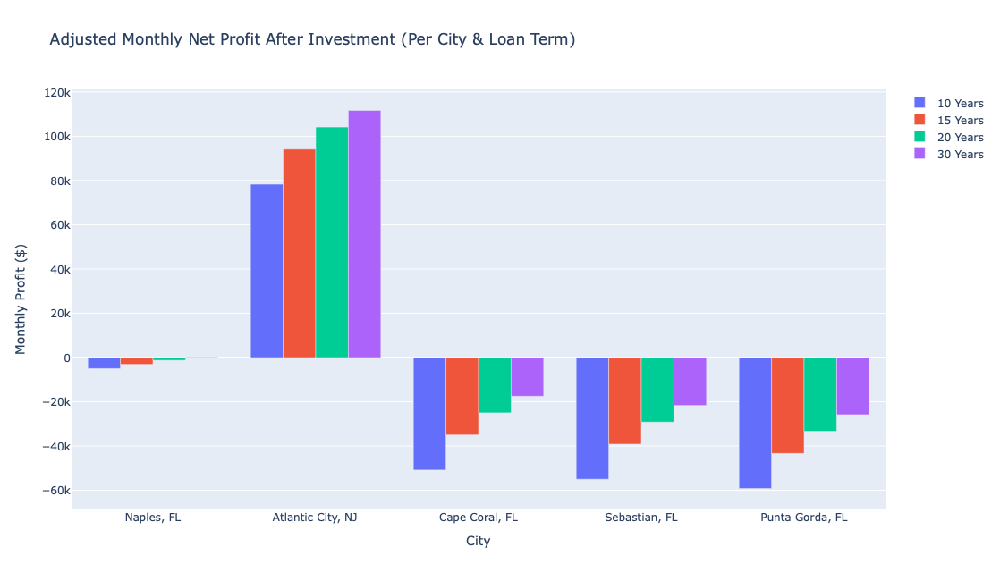

In [107]:
import plotly.graph_objects as go

adjusted_monthly_cf_df = pd.DataFrame({
    'RegionName': ['Naples, FL', 'Atlantic City, NJ', 'Cape Coral, FL', 'Sebastian, FL', 'Punta Gorda, FL'],
    '10 Years': [-5000, 78333.33, -50833.33, -55000.00, -59166.67],
    '15 Years': [-3083.33, 94166.67, -35000.00, -39166.67, -43333.33],
    '20 Years': [-1250.00, 104166.67, -25000.00, -29166.67, -33333.33],
    '30 Years': [166.67, 111666.67, -17500.00, -21666.67, -25833.33]
})

melted_df = adjusted_monthly_cf_df.melt(id_vars='RegionName', var_name='Loan Term', value_name='Monthly Profit')

fig = go.Figure()

for term in melted_df['Loan Term'].unique():
    df_term = melted_df[melted_df['Loan Term'] == term]
    fig.add_trace(go.Bar(x=df_term['RegionName'], y=df_term['Monthly Profit'], name=term))

fig.update_layout(
    title="Adjusted Monthly Net Profit After Investment (Per City & Loan Term)",
    xaxis_title="City",
    yaxis_title="Monthly Profit ($)",
    barmode='group',
    template='plotly',
    height=650
)

fig.show()

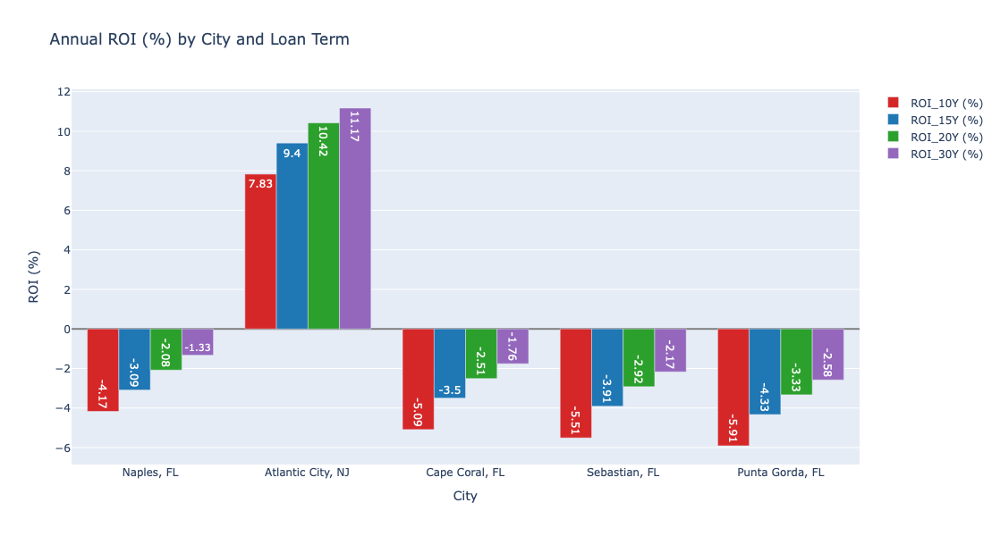

In [108]:
import plotly.graph_objects as go

roi_data = {
    'RegionName': ['Naples, FL', 'Atlantic City, NJ', 'Cape Coral, FL', 'Sebastian, FL', 'Punta Gorda, FL'],
    'ROI_10Y (%)': [-4.17, 7.83, -5.09, -5.51, -5.91],
    'ROI_15Y (%)': [-3.09, 9.4, -3.5, -3.91, -4.33],
    'ROI_20Y (%)': [-2.08, 10.42, -2.51, -2.92, -3.33],
    'ROI_30Y (%)': [-1.33, 11.17, -1.76, -2.17, -2.58]
}
roi_df = pd.DataFrame(roi_data)

fig = go.Figure()

terms = ['ROI_10Y (%)', 'ROI_15Y (%)', 'ROI_20Y (%)', 'ROI_30Y (%)']
colors = ['#d62728', '#1f77b4', '#2ca02c', '#9467bd']  # Different color for each term

for i, term in enumerate(terms):
    fig.add_trace(go.Bar(
        x=roi_df['RegionName'],
        y=roi_df[term],
        name=term,
        marker_color=colors[i],
        text=roi_df[term],
        textposition='auto'
    ))

fig.update_layout(
    barmode='group',
    title='Annual ROI (%) by City and Loan Term',
    yaxis=dict(title='ROI (%)', zeroline=True, zerolinewidth=2, zerolinecolor='gray'),
    xaxis=dict(title='City'),
    height=600
)

fig.show()

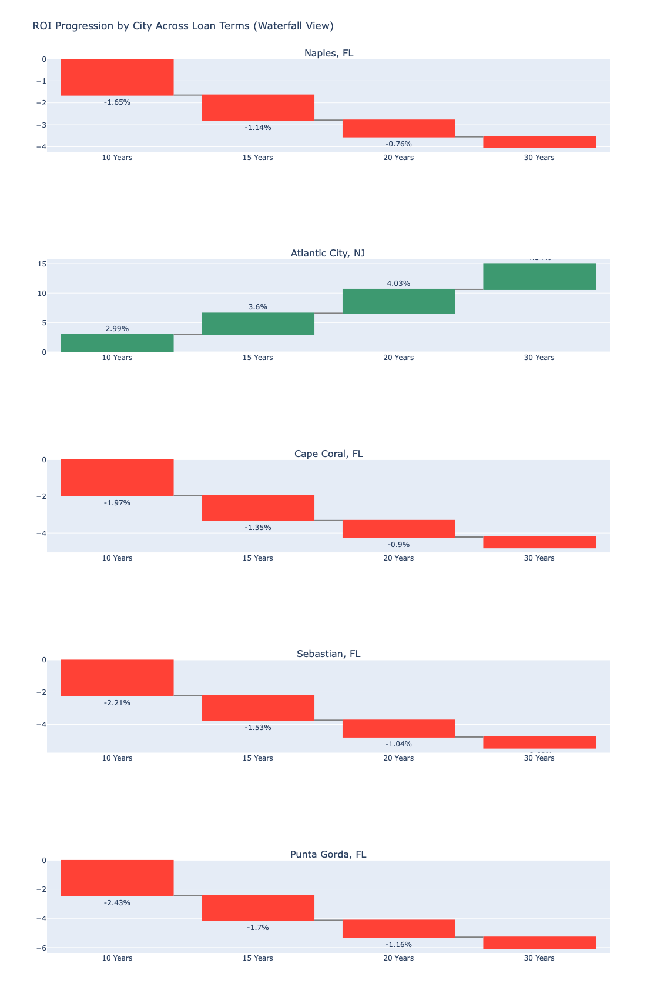

In [109]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

roi_data = {
    'Naples, FL': [-1.65, -1.14, -0.76, -0.47],
    'Atlantic City, NJ': [2.99, 3.6, 4.03, 4.34],
    'Cape Coral, FL': [-1.97, -1.35, -0.9, -0.58],
    'Sebastian, FL': [-2.21, -1.53, -1.04, -0.68],
    'Punta Gorda, FL': [-2.43, -1.7, -1.16, -0.76]
}
terms = ['10 Years', '15 Years', '20 Years', '30 Years']

fig = make_subplots(
    rows=5, cols=1,
    shared_xaxes=False,
    subplot_titles=[f"{city}" for city in roi_data.keys()],
    vertical_spacing=0.12
)

for idx, (city, roi_list) in enumerate(roi_data.items(), start=1):
    fig.add_trace(
        go.Waterfall(
            name=city,
            orientation="v",
            measure=["relative"] * len(terms),
            x=terms,
            y=roi_list,
            text=[f"{val}%" for val in roi_list],
            textposition="outside",
            connector={"line": {"color": "gray"}},
        ),
        row=idx, col=1
    )

fig.update_layout(
    height=1700,
    title="ROI Progression by City Across Loan Terms (Waterfall View)",
    showlegend=False,
    margin=dict(t=100)
)

fig.show()

## **Outputs Generated**

- **Annual Rent**, **Annual Expenses**, **Net Annual Income**
- **Mortgage Payment by Term** (10Y, 15Y, 20Y, 30Y)
- **Monthly Net Cash Flow After Investment Recovery**
- **ROI (%)** for each loan term

---

## **Key Insights & Conclusion**

### **Findings**

- Cities with **higher RTPs and moderate property taxes** delivered better monthly returns.
- **Atlantic City, NJ** showed the **highest positive cash flow** under all loan terms due to **low insurance** and **high RTP**.
- **Shorter-term mortgages** (e.g. 10Y) have **lower ROI initially** but **build ownership equity faster**.
- **Longer mortgages** (e.g. 30Y) result in **stronger monthly cash flow**, due to **lower annual payments**.

---

### **Conclusion**

With a **$12M investment**, you can expect **consistent monthly rental income** after all expenses, depending on the **city and mortgage term**.  
This provides a realistic picture of **monthly profit margins**, helping optimize **long-term real estate strategies**.

---

# ***********************************************************************************

# Approach 3 for Q6
# by - Syed Hassan Ahmed

Metro ZORI – UC SFR (Smoothed, Monthly) : Zillow Observed Rent Index (ZORI)
File: Metro_zori_uc_sfr_sm_month.csv

**Why This Dataset is Best for Q6**

**Direct Rent Estimates:**
It gives you actual monthly rent values for each metro over time — exactly what you need to calculate rental income.

**Metro-Level Coverage:**
It covers hundreds of U.S. metros, so you can compare different investment regions side by side.

**Focus on Single-Family Rentals (SFR):**
These are the most common investment properties — practical for personal investment scenarios.

**Time-Series Format:**
You get month-by-month data, allowing you to calculate:

Rent trends

Seasonality

Average rent over your target time period

**Helps in ROI Calculations:**
With rent data, you can calculate:

Monthly income

Annual income

ROI after expenses (mortgage, tax, upgrades)

**Easy to Combine with ZHVI (Home Values):**
Since it's by metro, you can join it with your existing ZHVI sale-price data, enabling:

Side-by-side investment vs. rental analysis

ROI comparison (sale vs. lease)

**Clean and Ready to Use:**
Zillow provides it in a structured CSV format with minimal pre-processing required.

**Smoothed Data:**
The "smoothed" (rolling average) values reduce noise, making visuals cleaner and trends clearer.

# Cleaning Steps (Next Applied):

Drop columns (dates) with high nulls.

Drop any rows (metros) with nulls in recent years (e.g., 2022–2025).

Convert date columns to time series

Remove extreme outliers using IQR (Interquartile Range) method on rents.

In [110]:
import pandas as pd

# Load the ZORI dataset
file_path = "./datasets/Q6_Metro_zori_uc_sfr_sm_month.csv"
zori_df = pd.read_csv(file_path)

# Step 1: Drop early date columns with too many nulls (keep from 2017 onwards)
date_cols = zori_df.columns[5:]  # Columns starting from date values
valid_dates = [col for col in date_cols if int(col[:4]) >= 2020]
zori_df_clean = zori_df[['RegionID', 'RegionName', 'StateName', 'SizeRank'] + valid_dates]

# Step 2: Drop rows with nulls in recent years (2022–2025)
recent_cols = [col for col in valid_dates if int(col[:4]) >= 2022]
zori_df_clean = zori_df_clean.dropna(subset=recent_cols)

# Step 3: Melt to long format for time series analysis
zori_long = pd.melt(
    zori_df_clean,
    id_vars=['RegionID', 'RegionName', 'StateName', 'SizeRank'],
    var_name='Date',
    value_name='Rent'
)

# Step 4: Convert 'Date' to datetime
zori_long['Date'] = pd.to_datetime(zori_long['Date'])

# Step 5: Remove outliers using the IQR method
Q1 = zori_long['Rent'].quantile(0.25)
Q3 = zori_long['Rent'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
zori_long = zori_long[(zori_long['Rent'] >= lower_bound) & (zori_long['Rent'] <= upper_bound)]

# Final preview
print(zori_long.head())

   RegionID     RegionName StateName  SizeRank       Date         Rent
0    102001  United States       NaN         0 2020-01-31  1553.598069
1    394913   New York, NY        NY         1 2020-01-31  2827.840745
3    394463    Chicago, IL        IL         3 2020-01-31  1701.173862
4    394514     Dallas, TX        TX         4 2020-01-31  1694.578527
5    394692    Houston, TX        TX         5 2020-01-31  1648.774927


# What This Cleaning Code Does:
Step Action: 

**1️:** Keeps only rent data from 2017 onward (recent & relevant)

**2️:** Removes metro areas with missing rent data in recent years

**3️:** Converts wide format to long format (for time series plots)

**4️:** Converts dates from string to datetime

**5️:** Removes rent value outliers using IQR method

In [111]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [112]:
monthly_mortgage = 2000     # example mortgage per property
monthly_tax = 300           # example tax per month
monthly_upgrade_cost = 200  # example cost to maintain upgrades

# Heatmap of Rent in 2024 (Top 20 Metros)
Insight: Shows where rent is currently highest, i.e., most income potential.

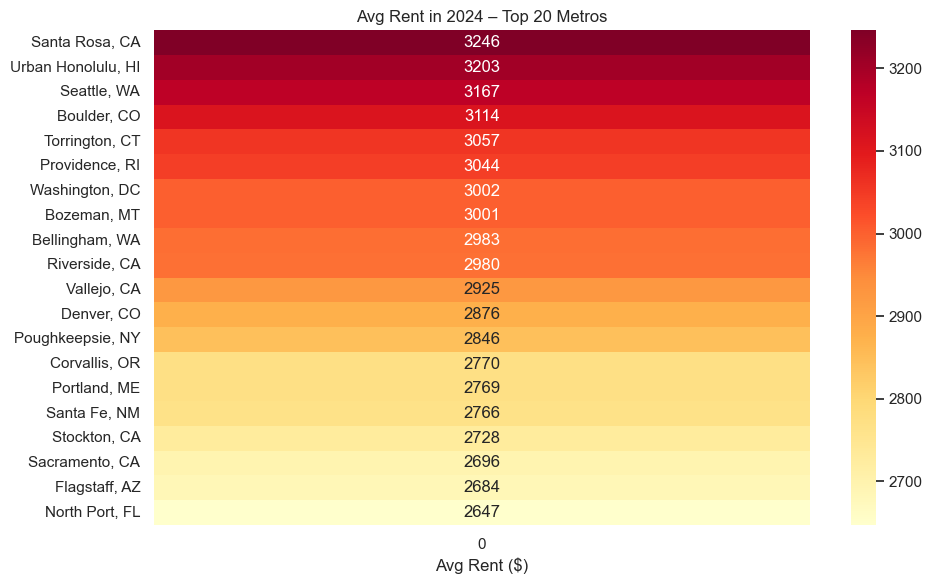

In [113]:
rent_2024 = zori_long[zori_long['Date'].dt.year == 2024]
rent_latest = rent_2024.groupby('RegionName')['Rent'].mean().nlargest(20)

plt.figure(figsize=(10, 6))
sns.heatmap(rent_latest.values.reshape(-1, 1), annot=True, fmt=".0f", yticklabels=rent_latest.index, cmap="YlOrRd")
plt.title('Avg Rent in 2024 – Top 20 Metros')
plt.xlabel('Avg Rent ($)')
plt.tight_layout()
plt.show()

# ROI by Metro
Insight: Visualizes net profit percentage per metro (after all costs).

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/227644465.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




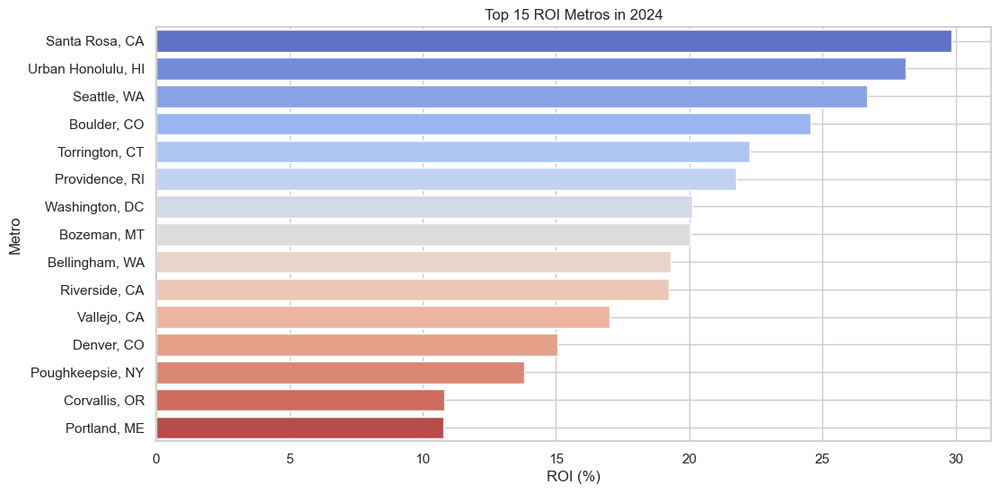

In [114]:
roi_df = rent_2024.groupby('RegionName')['Rent'].mean().reset_index()
roi_df['MonthlyCost'] = monthly_mortgage + monthly_tax + monthly_upgrade_cost
roi_df['ROI (%)'] = ((roi_df['Rent'] - roi_df['MonthlyCost']) / roi_df['MonthlyCost']) * 100
top_roi = roi_df.sort_values('ROI (%)', ascending=False).head(15)

plt.figure(figsize=(12, 6))
sns.barplot(data=top_roi, x='ROI (%)', y='RegionName', palette='coolwarm')
plt.title('Top 15 ROI Metros in 2024')
plt.xlabel('ROI (%)')
plt.ylabel('Metro')
plt.grid(True)
plt.show()

# ROI Distribution Histogram
Insight: Shows how ROI varies across markets (positive vs. negative returns).

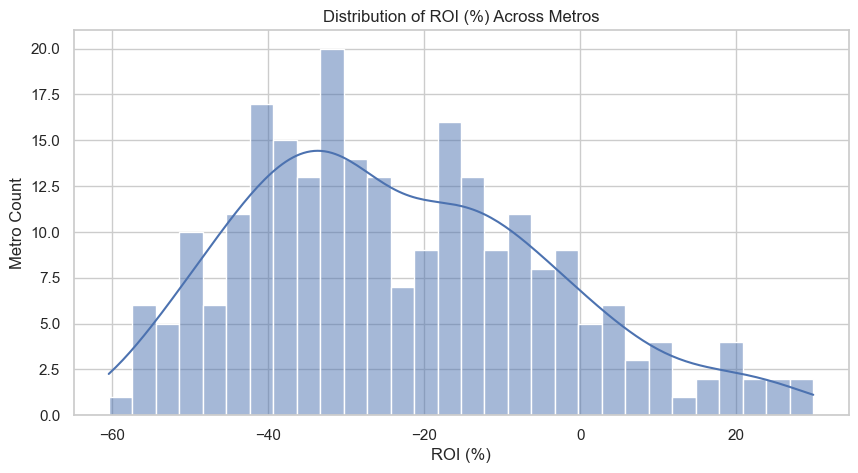

In [115]:
plt.figure(figsize=(10, 5))
sns.histplot(roi_df['ROI (%)'], bins=30, kde=True)
plt.title('Distribution of ROI (%) Across Metros')
plt.xlabel('ROI (%)')
plt.ylabel('Metro Count')
plt.grid(True)
plt.show()

# Year-on-Year Rent Growth by Metro
Insight: Track if rent growth is stable, declining, or rising.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1698776299.py:7: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



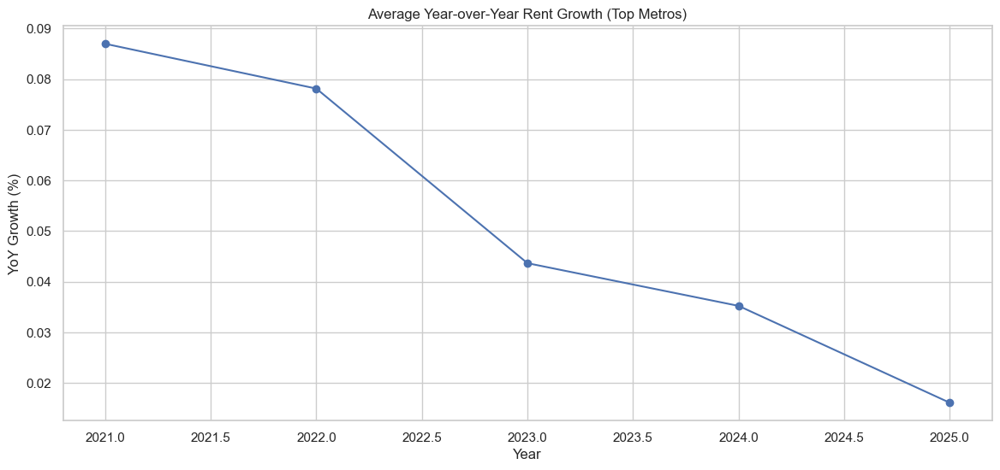

In [116]:
top5 = zori_long[zori_long['SizeRank'] <= 5]
zori_long['Year'] = zori_long['Date'].dt.year
yearly_rent = zori_long.groupby(['RegionName', 'Year'])['Rent'].mean().reset_index()
rent_pivot = yearly_rent.pivot(index='Year', columns='RegionName', values='Rent')

plt.figure(figsize=(14, 6))
rent_pivot[top5['RegionName'].unique()].pct_change().mean(axis=1).plot(marker='o')
plt.title('Average Year-over-Year Rent Growth (Top Metros)')
plt.ylabel('YoY Growth (%)')
plt.xlabel('Year')
plt.grid(True)
plt.show()

# Monthly Profit Over Time (Top Metro Example)
Insight: See profit vs loss per month after all deductions.

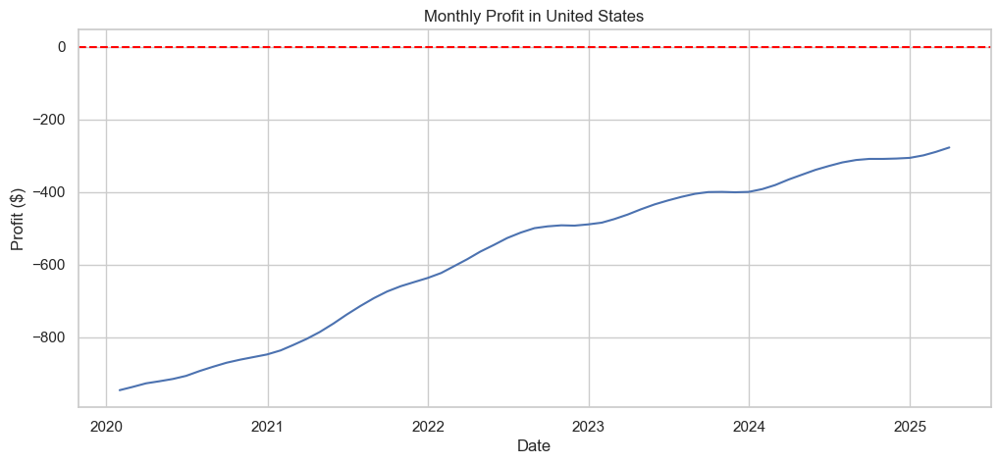

In [117]:
example = zori_long[zori_long['RegionName'] == top5['RegionName'].iloc[0]].copy()
example['Profit'] = example['Rent'] - (monthly_mortgage + monthly_tax + monthly_upgrade_cost)

plt.figure(figsize=(12, 5))
plt.plot(example['Date'], example['Profit'], label='Monthly Profit')
plt.axhline(0, color='red', linestyle='--')
plt.title(f"Monthly Profit in {example['RegionName'].iloc[0]}")
plt.ylabel('Profit ($)')
plt.xlabel('Date')
plt.grid(True)
plt.show()

# Total Profit in 2024 – Top Metros
Insight: Compare total yearly income across top metros after all expenses.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/368267819.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



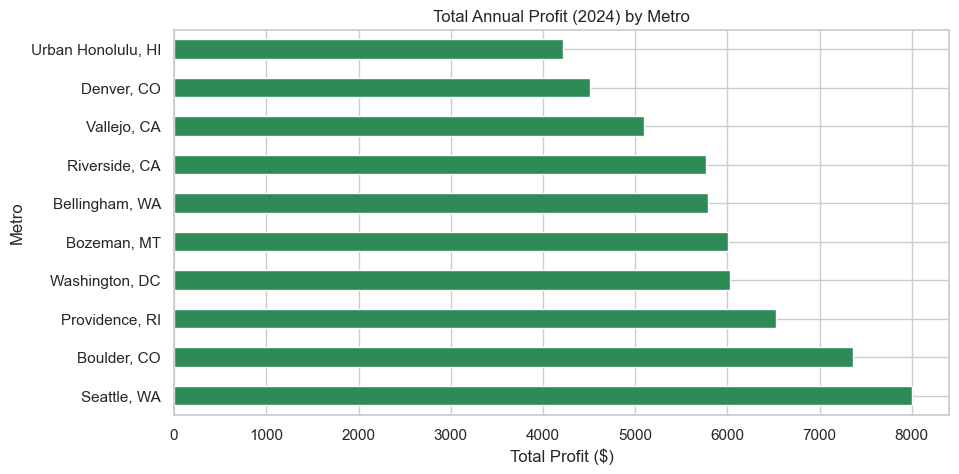

In [118]:
monthly_cost = monthly_mortgage + monthly_tax + monthly_upgrade_cost
rent_2024['Profit'] = rent_2024['Rent'] - monthly_cost
total_profit = rent_2024.groupby('RegionName')['Profit'].sum().nlargest(10)

plt.figure(figsize=(10, 5))
total_profit.plot(kind='barh', color='seagreen')
plt.title('Total Annual Profit (2024) by Metro')
plt.xlabel('Total Profit ($)')
plt.ylabel('Metro')
plt.grid(True)
plt.show()

# Box Plot of Rent Distribution by State
Insight: Where is rent most consistent vs. volatile?

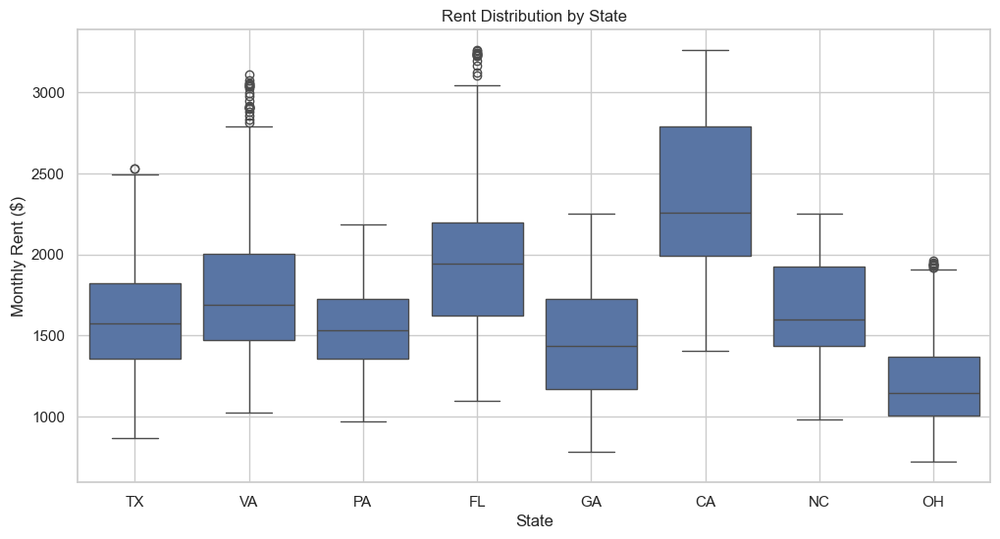

In [119]:
top_states = zori_long['StateName'].value_counts().head(8).index
filtered = zori_long[zori_long['StateName'].isin(top_states)]

plt.figure(figsize=(12, 6))
sns.boxplot(data=filtered, x='StateName', y='Rent')
plt.title('Rent Distribution by State')
plt.ylabel('Monthly Rent ($)')
plt.xlabel('State')
plt.grid(True)
plt.show()

# Heatmap of ROI by Region and Year
Insight: Multi-year trend of ROI per metro, track best investment locations.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1344486432.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/1344486432.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



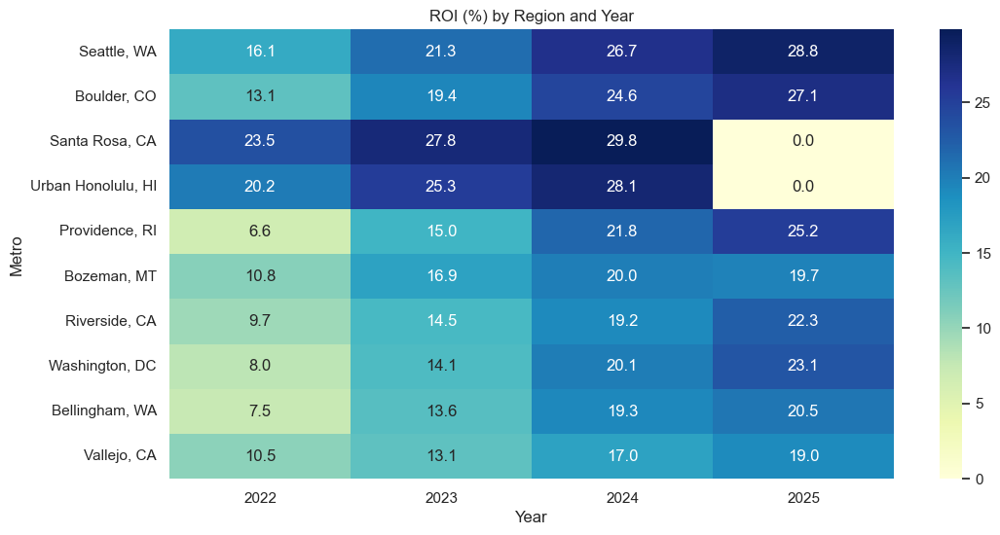

In [120]:
rent_years = zori_long[zori_long['Year'] >= 2022]
rent_years['MonthlyCost'] = monthly_mortgage + monthly_tax + monthly_upgrade_cost
rent_years['ROI (%)'] = ((rent_years['Rent'] - rent_years['MonthlyCost']) / rent_years['MonthlyCost']) * 100

roi_heatmap = rent_years.groupby(['RegionName', 'Year'])['ROI (%)'].mean().unstack().fillna(0)
roi_top = roi_heatmap.loc[roi_heatmap.mean(axis=1).nlargest(10).index]

plt.figure(figsize=(12, 6))
sns.heatmap(roi_top, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title("ROI (%) by Region and Year")
plt.xlabel("Year")
plt.ylabel("Metro")
plt.show()


/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/546140638.py:26: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.

/var/folders/88/9x0zgrl94_l9tgbn7dm8wt9h0000gn/T/ipykernel_1891/546140638.py:29: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



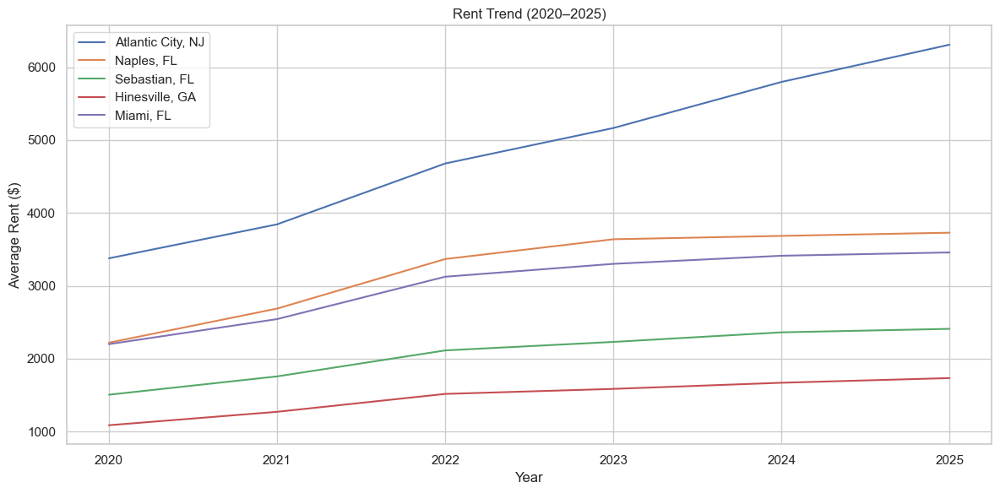

Top metros by average annual rent growth (2020–2025):
RegionName
Atlantic City, NJ     13.304804
Naples, FL            10.926414
Sebastian, FL          9.849427
Hinesville, GA         9.777884
Miami, FL              9.466091
Knoxville, TN          9.433593
Bloomington, IL        9.404932
Port St. Lucie, FL     9.299669
Savannah, GA           9.075301
North Port, FL         8.882536
dtype: float64


In [121]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the ZORI dataset
file_path = "./datasets/Q6_Metro_zori_uc_sfr_sm_month.csv"
zori_df = pd.read_csv(file_path)

# # Load rent dataset
# zori_df = pd.read_csv('/mnt/data/Metro_zori_uc_sfr_sm_month.csv')

# Clean data
zori_df = zori_df[zori_df['RegionType'] == 'msa']
zori_df.set_index('RegionName', inplace=True)
zori_df = zori_df.iloc[:, 4:]  # Only date columns

# Convert columns to datetime
zori_df.columns = pd.to_datetime(zori_df.columns)

# Transpose for easier time-based analysis
zori_transposed = zori_df.T

# Filter for years 2020 to 2025
filtered_rent = zori_transposed.loc['2020-01-31':'2025-01-31']

# Calculate average rent per metro per year
annual_rent = filtered_rent.resample('Y').mean()

# Calculate % increase year over year
rent_growth = annual_rent.pct_change() * 100

# Plot trends for top metros
# top_metros = ['Atlantic City, NJ','Naples, FL','Miami, FL', 'Atlanta, GA', 'Dallas, TX', 'Boston, MA', 'Los Angeles, CA']
top_metros = ['Atlantic City, NJ','Naples, FL','Sebastian, FL','Hinesville, GA','Miami, FL']

plt.figure(figsize=(12, 6))
for metro in top_metros:
    plt.plot(annual_rent.index.year, annual_rent[metro], label=metro)

plt.title("Rent Trend (2020–2025)")
plt.xlabel("Year")
plt.ylabel("Average Rent ($)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculate average annual growth rate (CAGR) for each metro
start_year = annual_rent.iloc[0]
end_year = annual_rent.iloc[-1]
years = len(annual_rent) - 1
cagr = ((end_year / start_year) ** (1/years) - 1) * 100
cagr = cagr.sort_values(ascending=False)

print("Top metros by average annual rent growth (2020–2025):")
print(cagr.head(10))

# Final Key Insights from Rent Growth Data (2020–2025)
**Top Performers:**
**Atlantic City, NJ – 13.3% CAGR | 
Naples, FL – 10.9% CAGR | 
Sebastian, FL, Hinesville, GA, Miami, FL – all above 9% CAGR**

**Insight:** Florida dominates the list, with 4 of the top 10 metros, making it a clear rental hotspot with high future income potential.

**What This Means for You**
**Compounding Effect:**
A 13.3% CAGR in rents over 5 years results in nearly 90% total increase, which:

Increases rental income dramatically.

Helps outpace static expenses like mortgage, taxes, and insurance.

**Improved Future ROI:**
Even if your 2024 ROI was negative, strong rent growth in metros like Miami, FL (9.5% CAGR) indicates potential positive returns in the coming years.

Miami is especially promising as it already had a strong ROI in 2024 and is showing continued income growth.

**Investment Strategy Suggestion:**
Target future investments in metros with strong rental CAGR (preferably above 9%).

Model ROI forecasts by factoring in rent appreciation to identify break-even or profit scenarios within 2–3 years.

Use CAGR trends as a predictive metric for long-term investment health.

**✅ Do's and ❌ Don’ts for Rental Property Investment**

**✅ Do’s**
✅ Prioritize metros with high rent growth CAGR (e.g., Miami, Naples, Atlantic City).

✅ Forecast future ROI using rent CAGR + current expense trends.

✅ Diversify within strong-growth regions (e.g., multiple cities in Florida).

✅ Monitor rental trends annually and adjust strategy accordingly.

✅ Consider cash flow as well as long-term appreciation.

**❌ Don’ts**
❌ Don't rely solely on current ROI without projecting future rent growth.

❌ Don't invest in stagnant or declining rental markets without clear recovery indicators.

❌ Don't ignore local economic factors—rent growth must be supported by demand and job growth.

❌ Don’t assume that past trends will automatically continue; always validate with updated data.

**Conclusion:**
While average ROI in 2024 may look modest or even negative in some metros, rising rent trends paint a more optimistic future. Florida metros like Miami, Naples, and Port St. Lucie are proving to be high-confidence investment zones, where rent growth could drive long-term profitability. Aligning your strategy with these insights can help transform short-term losses into long-term wins.

# ***********************************************************************************

## Approach 4 (Rohith Ambarish)

## Dataset Used
To perform the analysis, the following datasets were used:

1. **Median Sale Price Data (Zillow)**: Provides the median sale prices of properties across various regions.
2. **Mortgage Payment Data (Zillow)**: Contains mortgage payments for single-family homes and condos with a 20% down payment.
3. **ZORI Data (Zillow Observed Rent Index)**: Gives the monthly rental income data for various regions.
4. **Property Tax Data (State-wise)**: Effective property tax rates for the year.

## Assumptions

1. **Vacancy Rate (5%):** Assumed that properties may remain vacant for a small portion of the year, reducing the total rental income.

2. **Property Management Fee (10% of Rent):** Applied a standard rate for professional property management.

3. **Maintenance Cost (1% annually):** Assumed that maintenance expenses account for 1% of the property value per year.

4. **Fixed Mortgage Rate:** Used the most recent mortgage rate for calculation and assumed it remains stable during the holding period.

5. **No Depreciation or Tax Benefits:** Depreciation and tax savings were not explicitly calculated as the focus was on **cash flow-based ROI**.

6. **One-Year Rental Horizon:** The ROI was calculated based on **annual rental income**, reflecting a typical one-year rental investment period.

7. **No Major Upgrades:** Assumed that no significant renovations were performed after purchase.


In [122]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
import plotly.graph_objects as go
import plotly.express as px

# Load the datasets
median_sp_df = pd.read_csv('./datasets/median_sp_allhome.csv')
mortgage_payment_df = pd.read_csv('./datasets/Metro_mortgage_payment_downpayment_0.20_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv')
zori_df = pd.read_csv('./datasets/zori_all_homes_metro.csv')
property_taxes_df = pd.read_csv('./datasets/Property Taxes by State.csv')

# Data Cleaning and Preparation
datasets = [median_sp_df, mortgage_payment_df, zori_df]
for df in datasets:
    df.drop(df[df['RegionName'] == 'United States'].index, inplace=True)

# Fixing the tax rate format
property_taxes_df['Effective Tax Rate (2023)'] = (
    property_taxes_df['Effective Tax Rate (2023)'].astype(str).str.replace('%', '').astype(float) / 100
)

# Use the latest date for analysis
latest_date = '2025-03-31'
median_sp_recent = median_sp_df[['RegionName', 'StateName', latest_date]].rename(columns={latest_date: 'MedianSalePrice'})
mortgage_payment_recent = mortgage_payment_df[['RegionName', 'StateName', latest_date]].rename(columns={latest_date: 'MortgagePayment'})
zori_recent = zori_df[['RegionName', 'StateName', latest_date]].rename(columns={latest_date: 'ZORI'})

# Merge datasets to create a consolidated dataframe
merged_df = pd.merge(median_sp_recent, mortgage_payment_recent, on=['RegionName', 'StateName'], how='inner')
merged_df = pd.merge(merged_df, zori_recent, on=['RegionName', 'StateName'], how='inner')
merged_df = pd.merge(merged_df, property_taxes_df, on='StateName', how='left')


## Financial calculations

In [123]:
# Financial Parameters
vacancy_rate = 0.05
management_fee_rate = 0.10
maintenance_cost = 0.01

# Calculating expenses and returns
merged_df['MonthlyTax'] = (merged_df['MedianSalePrice'] * merged_df['Effective Tax Rate (2023)']) / 12
merged_df['MaintenanceCost'] = (merged_df['MedianSalePrice'] * maintenance_cost) / 12
merged_df['ManagementFee'] = merged_df['ZORI'] * management_fee_rate
merged_df['AdjustedRent'] = merged_df['ZORI'] * (1 - vacancy_rate)
merged_df['NOI'] = merged_df['AdjustedRent'] - (merged_df['ManagementFee'] + merged_df['MonthlyTax'] + merged_df['MaintenanceCost'])
merged_df['NetMonthlyIncome'] = merged_df['NOI'] - merged_df['MortgagePayment']
merged_df['NetAnnualIncome'] = merged_df['NetMonthlyIncome'] * 12

# Initial Investment Calculation
merged_df['InitialInvestment'] = merged_df['MedianSalePrice'] * 0.20

# Correct ROI Calculation for Rental Income
merged_df['Rental ROI'] = (merged_df['NetAnnualIncome'] / merged_df['InitialInvestment']) * 100

# Selecting top 10 regions based on Rental ROI
top_10_rental_roi = merged_df.nlargest(10, 'Rental ROI')

## Regional analysis

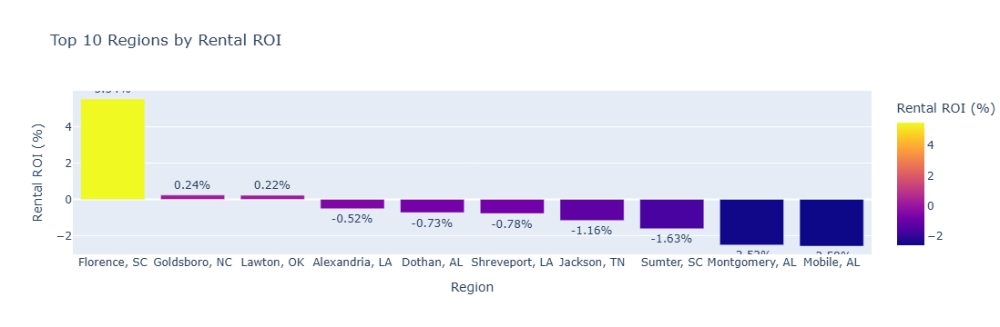

In [124]:
fig = px.bar(top_10_rental_roi, 
             x='RegionName', 
             y='Rental ROI', 
             color='Rental ROI', 
             hover_data=['StateName', 'NetMonthlyIncome', 'NetAnnualIncome', 'ZORI', 'MortgagePayment'],
             title='Top 10 Regions by Rental ROI',
             labels={'Rental ROI': 'Rental ROI (%)'},
             text='Rental ROI')
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(xaxis_title='Region', yaxis_title='Rental ROI (%)', height=500)
fig.show()

## State-wise analysis

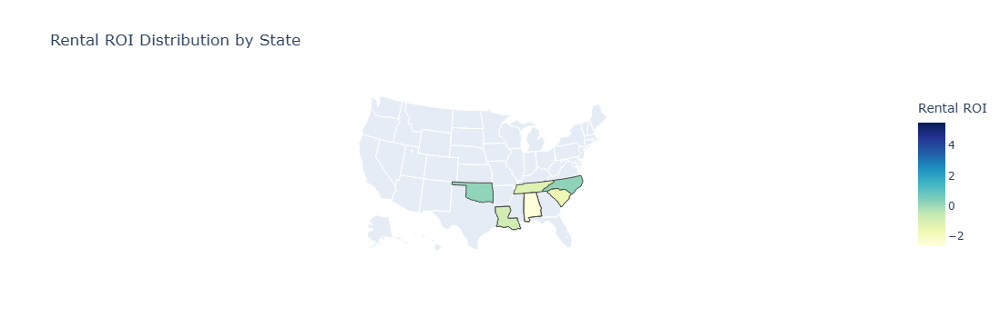

In [125]:
fig = px.choropleth(top_10_rental_roi, 
                    locations='StateName', 
                    locationmode='USA-states', 
                    color='Rental ROI', 
                    hover_name='RegionName', 
                    color_continuous_scale='YlGnBu',
                    scope='usa',
                    title='Rental ROI Distribution by State')
fig.show()

## Summary table

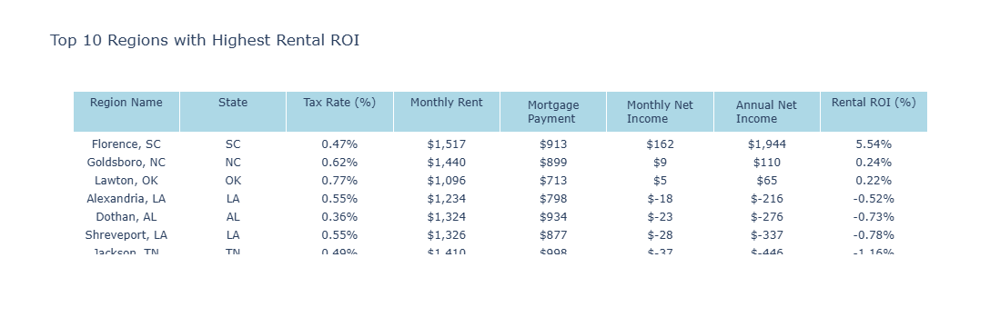

In [126]:
# Create the formatted summary table using Plotly
table_data = top_10_rental_roi[['RegionName', 'StateName', 'Effective Tax Rate (2023)',  
                                'ZORI', 'MortgagePayment','NetMonthlyIncome', 'NetAnnualIncome','Rental ROI',]]

# Format the values for better readability
formatted = table_data.copy()
formatted['Effective Tax Rate (2023)'] = (formatted['Effective Tax Rate (2023)'] * 100).map('{:.2f}%'.format)
formatted['ZORI'] = formatted['ZORI'].map('${:,.0f}'.format)
formatted['MortgagePayment'] = formatted['MortgagePayment'].map('${:,.0f}'.format)
formatted['NetMonthlyIncome'] = formatted['NetMonthlyIncome'].map('${:,.0f}'.format)
formatted['NetAnnualIncome'] = formatted['NetAnnualIncome'].map('${:,.0f}'.format)
formatted['Rental ROI'] = formatted['Rental ROI'].map('{:.2f}%'.format)

# Create the Plotly Table
fig = go.Figure(data=[go.Table(
    header=dict(
        values=['Region Name', 'State', 'Tax Rate (%)', 
                 'Monthly Rent', 'Mortgage Payment','Monthly Net Income', 'Annual Net Income', 'Rental ROI (%)'],
        fill_color='lightblue',
        align='center'
    ),
    cells=dict(
        values=[formatted[col] for col in table_data.columns],
        fill_color='white',
        align='center'
    )
)])
fig.update_layout(title="Top 10 Regions with Highest Rental ROI", height=500)
fig.show()


### Key Findings:
1. **Positive ROI Regions:**
   - Florence, SC emerged as the region with the **highest Rental ROI (5.54%)** due to:
     - Moderate property tax (0.47%)
     - Reasonable rent compared to mortgage payments

2. **Negative ROI Regions:**
   - Some regions showed **negative ROI**, indicating that rental income does not cover expenses.
   - Factors contributing to low ROI:
     - High mortgage payments compared to rental income
     - Higher property taxes and maintenance costs


### Observations:
- Most high ROI regions are located in **southern states** with **moderate property prices** and **reasonable rent**.
- Negative ROI in some areas indicates that even decent rental prices cannot cover the **high mortgage and tax expenses**.

## Conclusion

The analysis indicates that **not all rental properties generate positive ROI**.  

Key takeaways include:

1. **Best Investment Region:**
   - **Florence, SC** shows the **highest rental profitability** due to balanced **rent and mortgage costs**.

2. **Impact of Mortgage and Taxes:**
   - High mortgage payments and taxes significantly **reduce rental ROI** in many regions.

3. **Investment Decision:**
   - Investors should focus on **regions with moderate property prices**, **lower taxes**, and **reasonable rental income**.
   - It's crucial to **account for vacancy rates and management fees** while calculating net income.